In [1]:
COLLAB = False
if COLLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    !pip install --force-reinstall git+https://github.com/joshuaspear/pymlrf.git
    !pip install wandb
    !pip install torchinfo
    !pip install jaxtyping
    !pip install git+https://github.com/joshuaspear/comp0188_cw2_public.git
    !pip install typeguard==2.13.3

In [1]:
!pip install --force-reinstall git+https://github.com/joshuaspear/pymlrf.git
!pip install wandb
!pip install torchinfo
!pip install jaxtyping
!pip install typeguard==2.13.3

  Cloning https://github.com/joshuaspear/pymlrf.git to c:\users\32618\appdata\local\temp\pip-req-build-9y8dfrke
  Resolved https://github.com/joshuaspear/pymlrf.git to commit 13f5c1cbad249ec6d5a6cd356612c874ae68bb53
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for pymlrf: filename=pymlrf-1.0.0-py3-none-any.whl size=23899 sha256=557ab90374b6832b400a9c605071de2255c893210afc9df92f32195a6704671c
  Stored in directory: C:\Users\32618\AppData\Local\Temp\pip-ephem-wheel-cache-qoy4sw0w\wheels\f1\cb\97\454b1a9071448b027d0faecba7b7e6ae819354c83df4e7e70e
Successfully built pymlrf
  Attempting uninstall: pymlrf
    Found existing installation: pymlrf 1.0.0
    Uninstalling pymlrf-1.0.0:
      Successfu

  Running command git clone --filter=blob:none --quiet https://github.com/joshuaspear/pymlrf.git 'C:\Users\32618\AppData\Local\Temp\pip-req-build-9y8dfrke'


In [2]:
from comp0188_cw2 import project_options
project_options.collab = False
print(project_options.collab)
project_options.debug = False
print(project_options.debug)

False
False


In [3]:
import torch
import numpy as np
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
import datetime
from pymlrf.Structs.torch import DatasetOutput
import copy

from comp0188_cw2.utils import load_all_files
from torchvision import transforms
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import datetime
from typing import List
from pymlrf.Structs.torch import DatasetOutput

from comp0188_cw2.config import (
    train_dh, val_dh, test_dh, WANDB_PROJECT
    )
from comp0188_cw2.models.CNNConfig import ConvolutionLayersConfig
from comp0188_cw2.models.base import BaseModel
from comp0188_cw2.models.JointCNNEncoder import JointCNNEncoder
from comp0188_cw2.models.CNN import CNN
from comp0188_cw2.models.MLP import MLP
from comp0188_cw2.Metric.WandBMetricOrchestrator import WandBMetricOrchestrator
from comp0188_cw2.Dataset.NpDictDataset import NpDictDataset
from comp0188_cw2.Loss.BalancedLoss import TrackerBalancedLoss
from comp0188_cw2 import logger
from comp0188_cw2.training.TrainingLoop import TorchTrainingLoop

2026-01-16 12:38:31,624 - pymlrf - WARNING - pymlrf environment variable not set. Logging to file will not be performed (__init__.py:50)


In [4]:
print(train_dh.loc)

../data/all_play_data_diverse/train


In [4]:
from comp0188_cw2.Preprocessing import main
RUN_PREPROCESSING = False
if RUN_PREPROCESSING:
  main()

In [5]:
_keys = [
    "actions","front_cam_ob",
    "mount_cam_ob","terminals",
    "ee_cartesian_pos_ob",
    "ee_cartesian_vel_ob",
    "joint_pos_ob"
    ]
train_nps = load_all_files(train_dh.loc,"train_[0-9]+.h5",keys=_keys)
val_nps = load_all_files(val_dh.loc,"val_[0-9]+.h5",keys=_keys)

100%|██████████| 5/5 [00:00<00:00, 20.42it/s]


In [6]:
# Implementation section
def img_to_chw_float01(x):
    t = torch.as_tensor(x, dtype=torch.float32)
    if t.ndim == 2:          # (H,W) -> (1,H,W)
        t = t.unsqueeze(0)
    elif t.ndim == 3:        # (H,W,C) -> (C,H,W)
        t = t.permute(2, 0, 1)
    return t / 255.0

global_transforms = {
    "front_cam_ob": img_to_chw_float01,
    "mount_cam_ob": img_to_chw_float01,

    "ee_cartesian_pos_ob": lambda x: torch.as_tensor(x, dtype=torch.float32),
    "ee_cartesian_vel_ob": lambda x: torch.as_tensor(x, dtype=torch.float32),
    "joint_pos_ob":        lambda x: torch.as_tensor(x, dtype=torch.float32),

    "actions": lambda x: torch.as_tensor(x, dtype=torch.float32),
}

# ******* Implementation HERE - END *******

# Robotic Behavior Cloning

**Objective.** Predict actuator commands from visual observations using imitation learning.

**Pipeline.** Sequence modeling and training/evaluation workflow.

**Evaluation.** Error analysis and generalization considerations.

Num samples FULL (N_full): 25469
saved: ./outputs/Q1a_EDA\eda_subsample_info.txt


,shape,dtype,min,max,mean,std,p01,p99,nan_count,inf_count,frames_subsampled
key,,,,,,,,,,,
actions,"(25469, 4)",float16,-0.199951,2.000000,0.249539,0.512724,-0.199951,2.000000,0,0,NaN
ee_cartesian_pos_ob,"(25469, 7)",float16,-0.663574,0.998047,0.123746,0.410677,-0.554199,0.994141,0,0,NaN
ee_cartesian_vel_ob,"(25469, 6)",float16,-11.882812,12.250000,-0.003136,0.295084,-0.285889,0.295410,0,0,NaN
joint_pos_ob,"(25469, 2)",float16,-0.001232,1.412109,0.875636,0.318063,0.001232,1.390625,0,0,NaN
front_cam_ob,"(25469, 224, 224)",float16,0.412842,249.625000,114.904419,55.892091,2.494141,192.750000,0,0,300.0
mount_cam_ob,"(25469, 224, 224)",float16,1.173828,254.625000,125.466461,52.578885,8.382812,219.500000,0,0,300.0
terminals,"(25469,)",int64,0.000000,1.000000,0.017786,0.132174,0.000000,1.000000,0,0,NaN


saved: ./outputs/Q1a_EDA\eda_summary_table.csv

Actions quick view (first 5 rows):
 [[0.      0.      0.03072 1.     ]
 [0.      0.      0.03506 1.     ]
 [0.02853 0.      0.2     1.     ]
 [0.1284  0.      0.2     1.     ]
 [0.1284  0.      0.2     1.     ]]
Regression dims min/max/mean/std per dim (FULL):
  dim0: min=-0.2000, max=0.2000, mean=-0.0018, std=0.1115
  dim1: min=-0.2000, max=0.2000, mean=-0.0008, std=0.1013
  dim2: min=-0.2000, max=0.2000, mean=-0.0072, std=0.1181
Gripper unique labels: [0. 1. 2.]
Gripper counts: {0.0: 3061, 1.0: 19147, 2.0: 3261}
saved: ./outputs/Q1a_EDA\actions_reg_dim0_hist.png


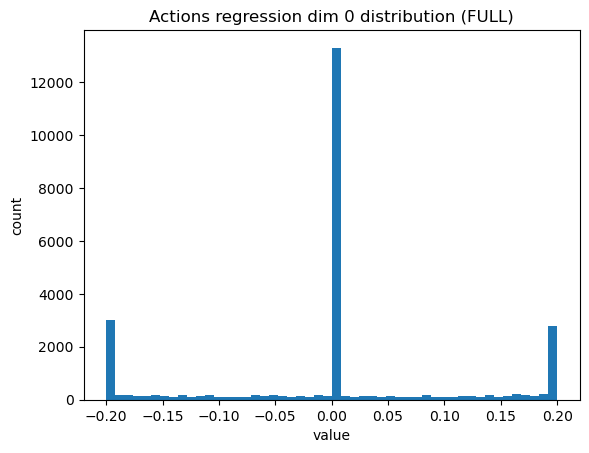

saved: ./outputs/Q1a_EDA\actions_reg_dim1_hist.png


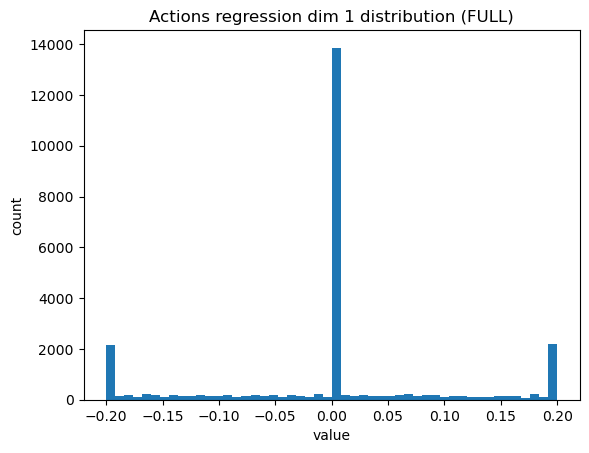

saved: ./outputs/Q1a_EDA\actions_reg_dim2_hist.png


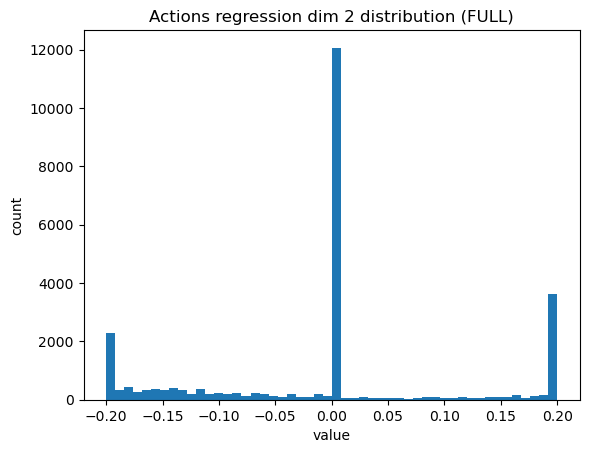

saved: ./outputs/Q1a_EDA\actions_gripper_class_bar.png


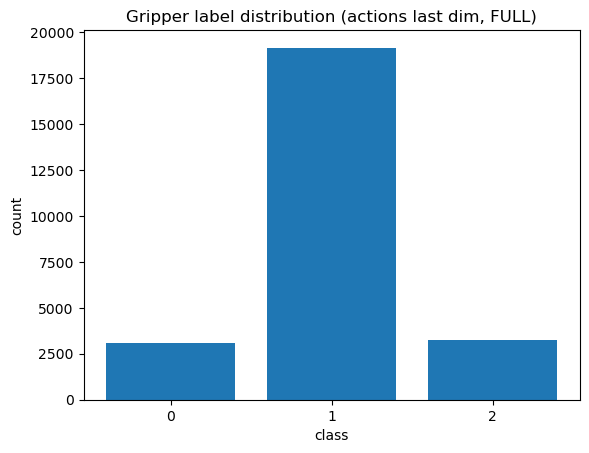


ee_cartesian_pos_ob: shape=(25469, 7), dtype=float16


,dim,min,max,mean,std
0,0,-0.440674,0.219971,-0.079590,0.132935
1,1,-0.663574,-0.252441,-0.427979,0.085205
2,2,0.156860,0.401367,0.266602,0.047424
3,3,-0.067932,0.037872,0.004375,0.009277
4,4,-0.093018,0.072754,-0.015900,0.015625
5,5,0.977051,0.998047,0.991211,0.002058
6,6,0.047394,0.195557,0.127441,0.016449


saved: ./outputs/Q1a_EDA\ee_cartesian_pos_ob_dim0_hist.png


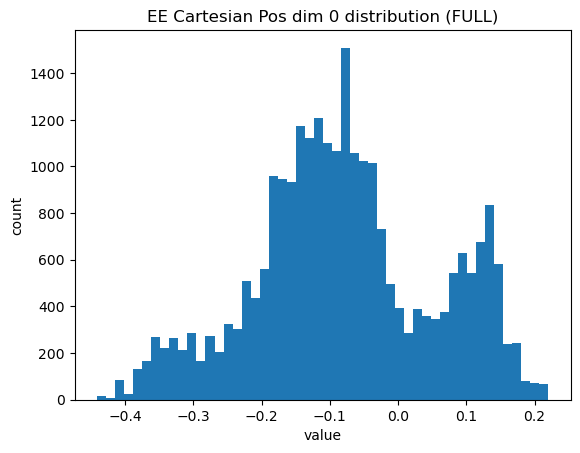

saved: ./outputs/Q1a_EDA\ee_cartesian_pos_ob_dim1_hist.png


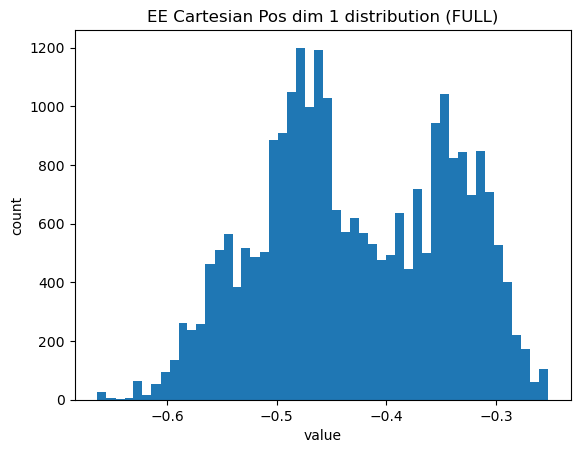

saved: ./outputs/Q1a_EDA\ee_cartesian_pos_ob_dim2_hist.png


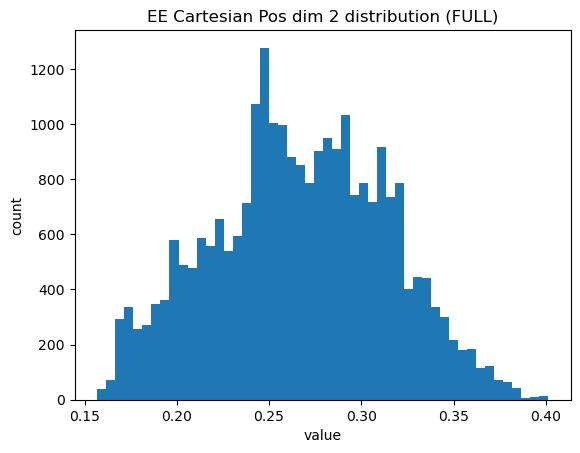

saved: ./outputs/Q1a_EDA\ee_cartesian_pos_ob_dim3_hist.png


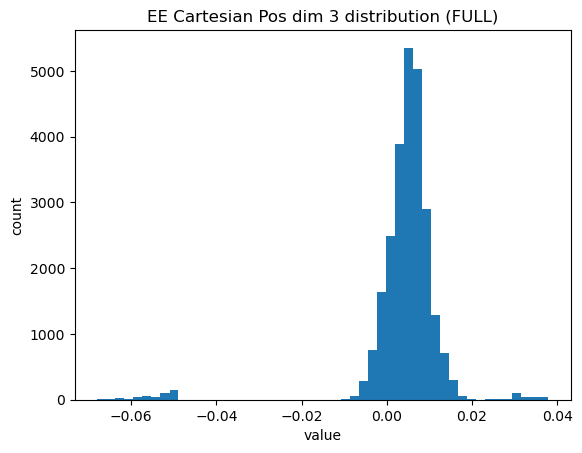

saved: ./outputs/Q1a_EDA\ee_cartesian_pos_ob_dim4_hist.png


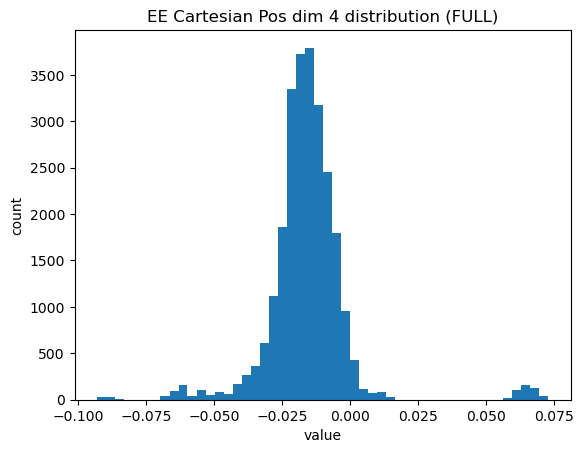

saved: ./outputs/Q1a_EDA\ee_cartesian_pos_ob_dim5_hist.png


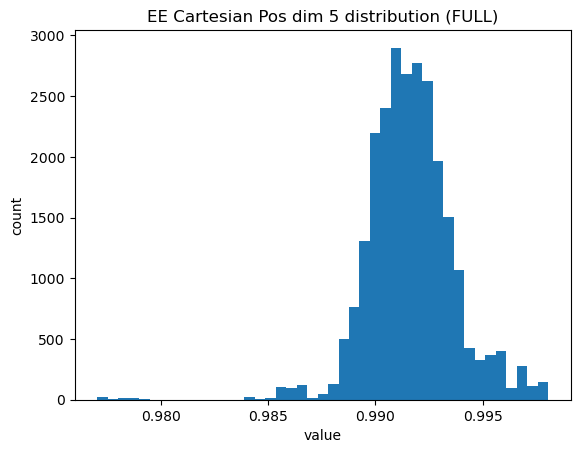

saved: ./outputs/Q1a_EDA\ee_cartesian_pos_ob_dim6_hist.png


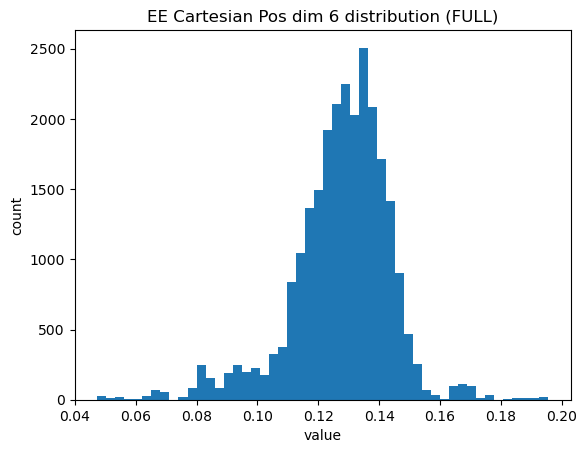


ee_cartesian_vel_ob: shape=(25469, 6), dtype=float16


,dim,min,max,mean,std
0,0,-1.153320,1.156250,-0.000689,0.134766
1,1,-0.687012,0.392822,-0.002449,0.114258
2,2,-0.458008,0.404053,-0.008438,0.131226
3,3,-4.312500,3.351562,0.001617,0.142700
4,4,-11.882812,12.250000,-0.012253,0.617188
5,5,-5.437500,5.160156,0.003397,0.269287


saved: ./outputs/Q1a_EDA\ee_cartesian_vel_ob_dim0_hist.png


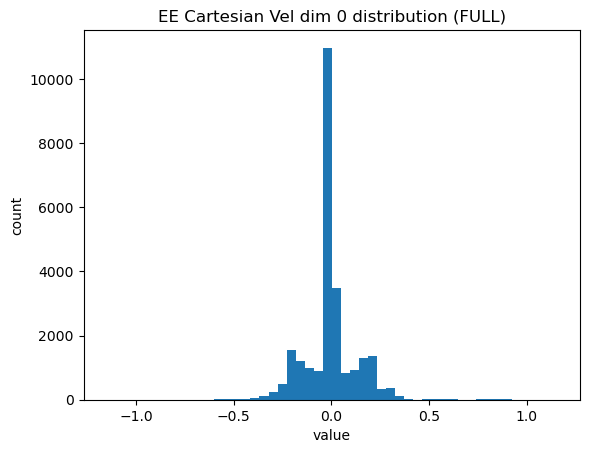

saved: ./outputs/Q1a_EDA\ee_cartesian_vel_ob_dim1_hist.png


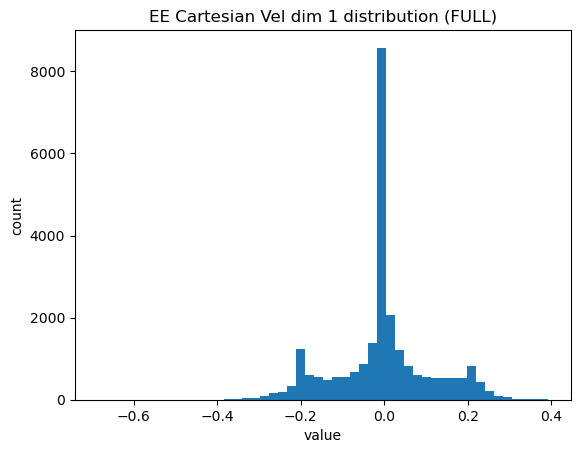

saved: ./outputs/Q1a_EDA\ee_cartesian_vel_ob_dim2_hist.png


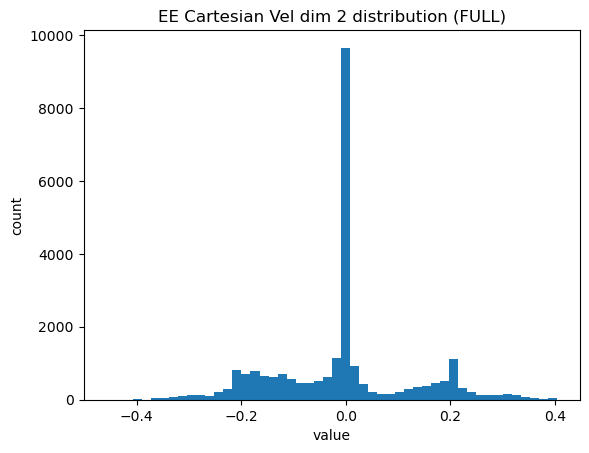

saved: ./outputs/Q1a_EDA\ee_cartesian_vel_ob_dim3_hist.png


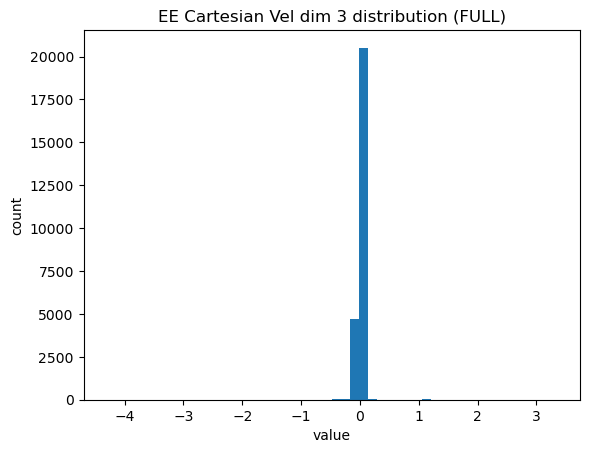

saved: ./outputs/Q1a_EDA\ee_cartesian_vel_ob_dim4_hist.png


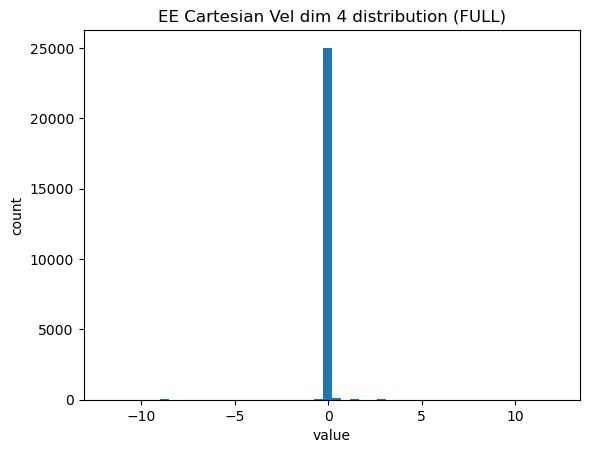

saved: ./outputs/Q1a_EDA\ee_cartesian_vel_ob_dim5_hist.png


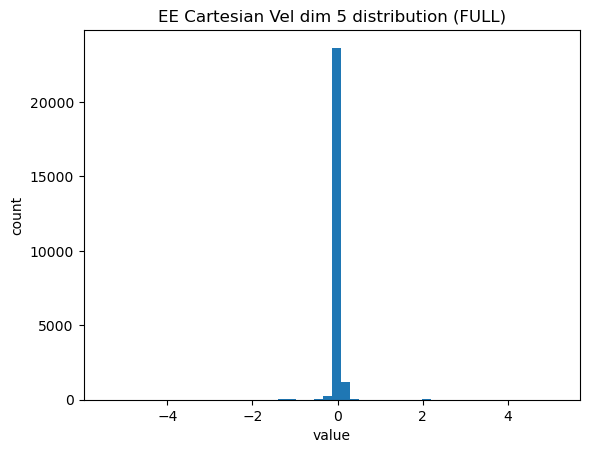


joint_pos_ob: shape=(25469, 2), dtype=float16


,dim,min,max,mean,std
0,0,-0.001232,1.412109,0.884277,0.318848
1,1,-0.001232,1.379883,0.866699,0.317139


saved: ./outputs/Q1a_EDA\joint_pos_ob_dim0_hist.png


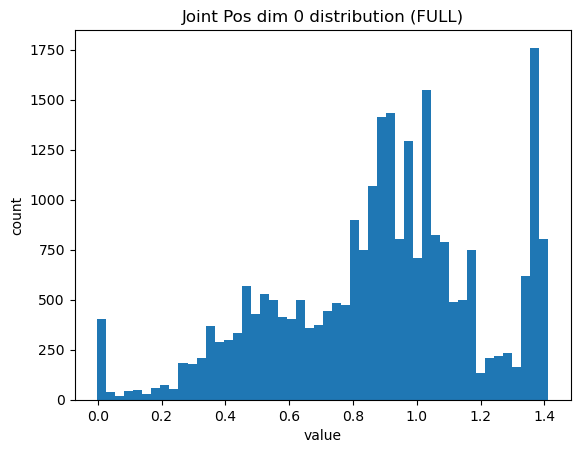

saved: ./outputs/Q1a_EDA\joint_pos_ob_dim1_hist.png


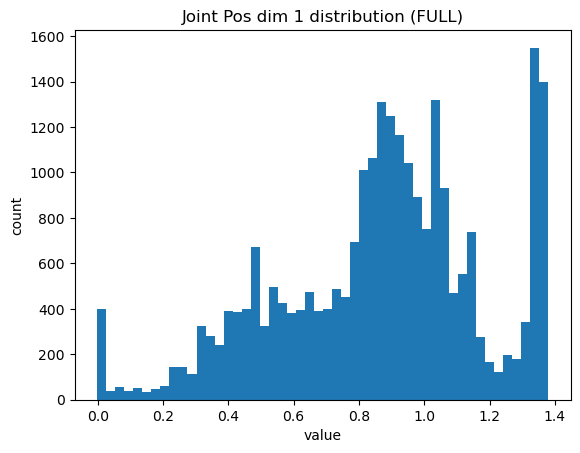


front_cam_ob: (25469, 224, 224) float16
mount_cam_ob: (25469, 224, 224) float16
saved: ./outputs/Q1a_EDA\front_pixel_hist.png


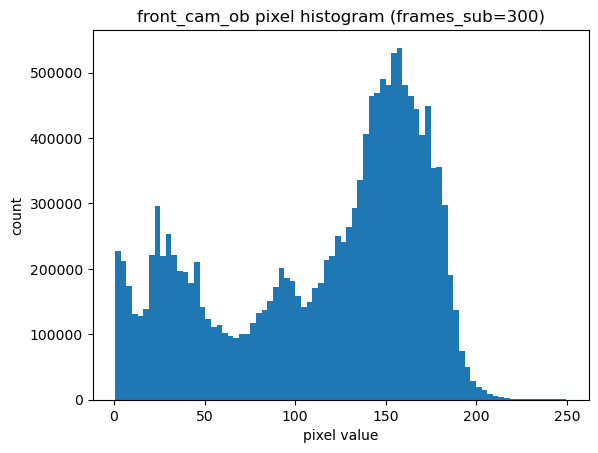

saved: ./outputs/Q1a_EDA\mount_pixel_hist.png


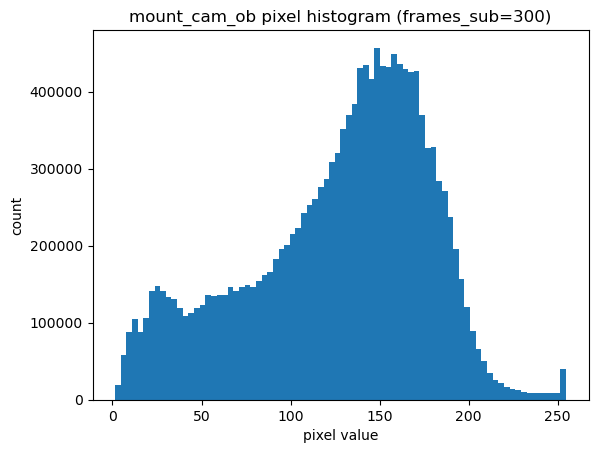

saved: ./outputs/Q1a_EDA\front_sample_17945.png


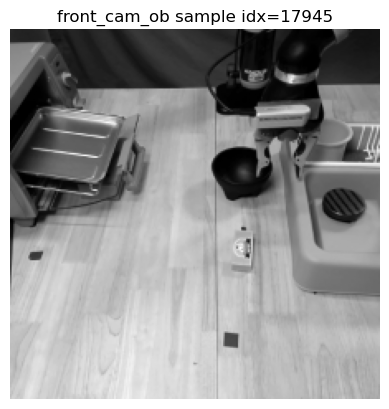

saved: ./outputs/Q1a_EDA\mount_sample_17945.png


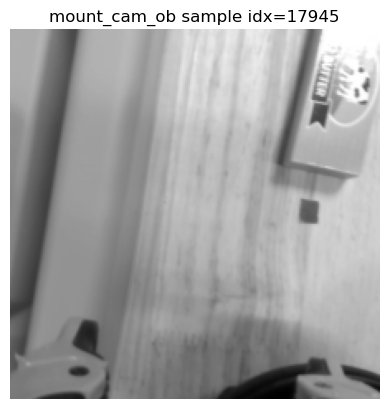

saved: ./outputs/Q1a_EDA\front_sample_4096.png


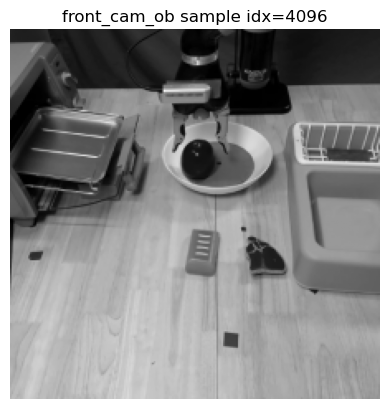

saved: ./outputs/Q1a_EDA\mount_sample_4096.png


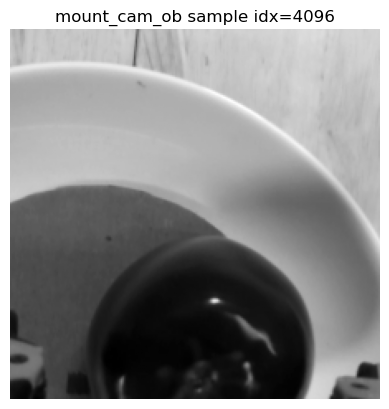

saved: ./outputs/Q1a_EDA\front_sample_23646.png


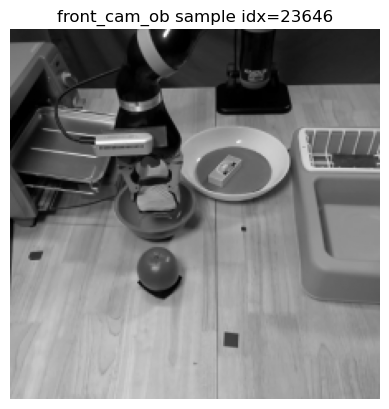

saved: ./outputs/Q1a_EDA\mount_sample_23646.png


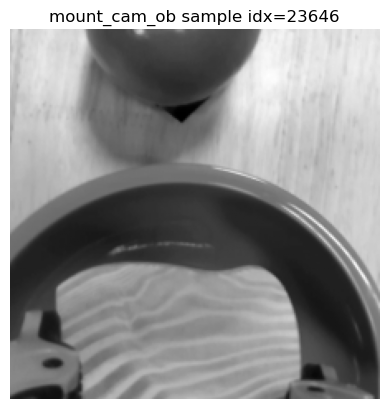

saved: ./outputs/Q1a_EDA\front_sample_9284.png


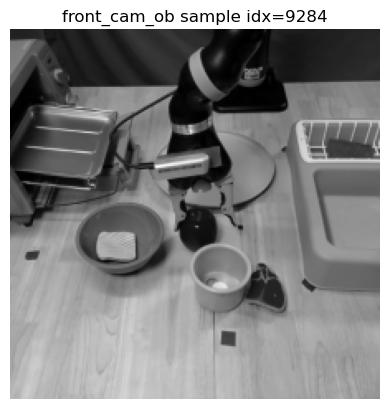

saved: ./outputs/Q1a_EDA\mount_sample_9284.png


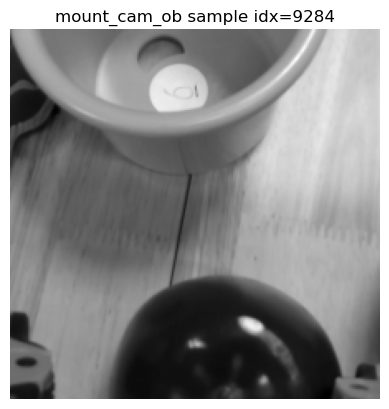

saved: ./outputs/Q1a_EDA\front_sample_12932.png


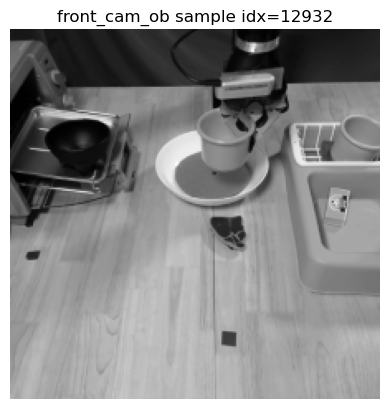

saved: ./outputs/Q1a_EDA\mount_sample_12932.png


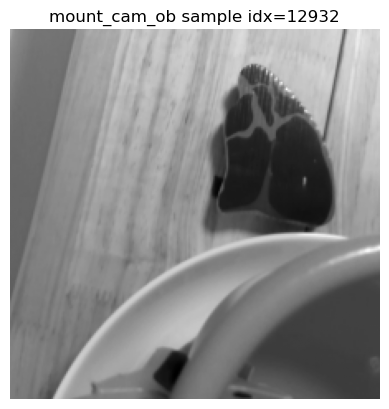

saved: ./outputs/Q1a_EDA\front_sample_3513.png


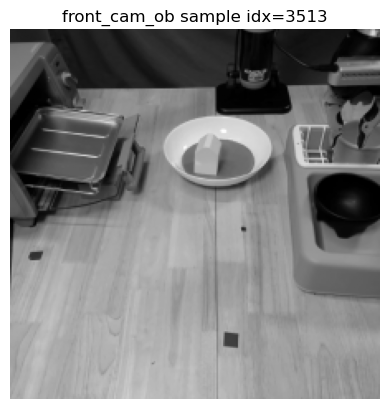

saved: ./outputs/Q1a_EDA\mount_sample_3513.png


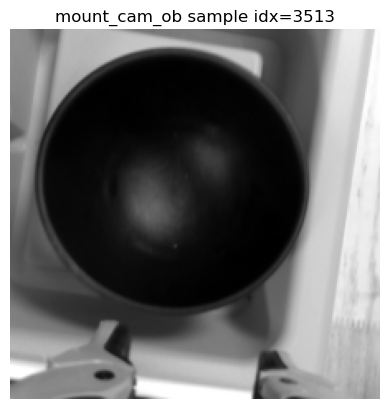


Hybrid EDA outputs saved to: ./outputs/Q1a_EDA


In [8]:
# Run this cell to generate empirical evaluation evidence.

# Implementation section
# =========================
# Dataset EDA (full for vectors, subsample for images)
# =========================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---------- (0) Config ----------
SEED = 1
rng = np.random.default_rng(SEED)

SAVE_FIGS = True
OUT_DIR = "./outputs/Q1a_EDA"
os.makedirs(OUT_DIR, exist_ok=True)

# image EDA subsampling (tune for speed)
IMG_FRAME_SUB_N = 300      # how many frames to use for pixel histogram
IMG_SAMPLE_SHOW_K = 6      # how many example images to save/show
PIXEL_HIST_BINS = 80

def savefig(name):
    if SAVE_FIGS:
        path = os.path.join(OUT_DIR, name)
        plt.savefig(path, bbox_inches="tight", dpi=150)
        print("saved:", path)

# ---------- (1) Basic checks ----------
required_keys = [
    "actions",
    "front_cam_ob",
    "mount_cam_ob",
    "ee_cartesian_pos_ob",
    "ee_cartesian_vel_ob",
    "joint_pos_ob",
]
missing = [k for k in required_keys if k not in train_nps]
assert len(missing) == 0, f"Missing keys in train_nps: {missing}"

N_full = int(train_nps["actions"].shape[0])
print("Num samples FULL (N_full):", N_full)

# record EDA config
if SAVE_FIGS:
    with open(os.path.join(OUT_DIR, "eda_subsample_info.txt"), "w") as f:
        f.write(f"SEED={SEED}\n")
        f.write(f"FULL_N={N_full}\n")
        f.write(f"IMG_FRAME_SUB_N={min(IMG_FRAME_SUB_N, N_full)}\n")
        f.write(f"IMG_SAMPLE_SHOW_K={min(IMG_SAMPLE_SHOW_K, N_full)}\n")
        f.write(f"PIXEL_HIST_BINS={PIXEL_HIST_BINS}\n")
    print("saved:", os.path.join(OUT_DIR, "eda_subsample_info.txt"))

# ---------- (2) Summary table (FULL for vectors + actions; images only basic stats) ----------
def numeric_summary(arr):
    arr = np.asarray(arr)

    if arr.dtype == np.float16:
        arr = arr.astype(np.float32)

    info = {}
    if np.issubdtype(arr.dtype, np.number):
        a64 = arr.astype(np.float64, copy=False)

        info["min"] = float(np.nanmin(a64))
        info["max"] = float(np.nanmax(a64))
        info["mean"] = float(np.nanmean(a64))
        info["std"] = float(np.nanstd(a64))
        info["p01"] = float(np.nanpercentile(a64, 1))
        info["p99"] = float(np.nanpercentile(a64, 99))

        if np.issubdtype(a64.dtype, np.floating):
            info["nan_count"] = int(np.isnan(a64).sum())
            info["inf_count"] = int(np.isinf(a64).sum())
        else:
            info["nan_count"] = 0
            info["inf_count"] = 0
    return info

rows = []

# full summaries for low-dim arrays
for k in ["actions", "ee_cartesian_pos_ob", "ee_cartesian_vel_ob", "joint_pos_ob"]:
    v = np.asarray(train_nps[k])
    row = {"key": k, "shape": str(v.shape), "dtype": str(v.dtype)}
    row.update(numeric_summary(v))
    rows.append(row)

# images: only basic pixel stats (computed on a subsample to be fast)
def image_pixel_summary(name, imgs, frame_sub_n=300):
    imgs = np.asarray(imgs)
    n = imgs.shape[0]
    sub_n = min(frame_sub_n, n)
    idx = rng.choice(n, size=sub_n, replace=False) if sub_n < n else np.arange(n)
    sub = imgs[idx]  # shape (sub_n, H, W)
    row = {"key": name, "shape": str(imgs.shape), "dtype": str(imgs.dtype), "frames_subsampled": int(sub_n)}
    row.update(numeric_summary(sub))
    return row

rows.append(image_pixel_summary("front_cam_ob", train_nps["front_cam_ob"], IMG_FRAME_SUB_N))
rows.append(image_pixel_summary("mount_cam_ob", train_nps["mount_cam_ob"], IMG_FRAME_SUB_N))

# optional: terminals if exists
if "terminals" in train_nps:
    v = np.asarray(train_nps["terminals"])
    row = {"key": "terminals", "shape": str(v.shape), "dtype": str(v.dtype)}
    row.update(numeric_summary(v))
    rows.append(row)

df_summary = pd.DataFrame(rows).set_index("key")
display(df_summary)

if SAVE_FIGS:
    df_summary.to_csv(os.path.join(OUT_DIR, "eda_summary_table.csv"))
    print("saved:", os.path.join(OUT_DIR, "eda_summary_table.csv"))

# ---------- (3) Actions EDA (FULL) ----------
actions = np.asarray(train_nps["actions"])
assert actions.ndim == 2 and actions.shape[1] >= 4, f"Unexpected actions shape: {actions.shape}"

pos_act = actions[:, :3]
grip = actions[:, -1]

print("\nActions quick view (first 5 rows):\n", actions[:5])

print("Regression dims min/max/mean/std per dim (FULL):")
for i in range(3):
    print(f"  dim{i}: min={pos_act[:,i].min():.4f}, max={pos_act[:,i].max():.4f}, "
          f"mean={pos_act[:,i].mean():.4f}, std={pos_act[:,i].std():.4f}")

vals, counts = np.unique(grip, return_counts=True)
print("Gripper unique labels:", vals)
print("Gripper counts:", dict(zip(vals, counts)))

for i in range(3):
    plt.figure()
    plt.hist(pos_act[:, i], bins=50)
    plt.title(f"Actions regression dim {i} distribution (FULL)")
    plt.xlabel("value"); plt.ylabel("count")
    savefig(f"actions_reg_dim{i}_hist.png")
    plt.show()

plt.figure()
plt.bar(vals.astype(int), counts)
plt.title("Gripper label distribution (actions last dim, FULL)")
plt.xlabel("class"); plt.ylabel("count")
plt.xticks(vals.astype(int))
savefig("actions_gripper_class_bar.png")
plt.show()

# ---------- (4) State vectors EDA (FULL) ----------
state_specs = [
    ("ee_cartesian_pos_ob", "EE Cartesian Pos"),
    ("ee_cartesian_vel_ob", "EE Cartesian Vel"),
    ("joint_pos_ob", "Joint Pos"),
]

for key, title in state_specs:
    X = np.asarray(train_nps[key])
    print(f"\n{key}: shape={X.shape}, dtype={X.dtype}")

    dim_stats = []
    for d in range(X.shape[1]):
        dim_stats.append({
            "dim": d,
            "min": float(np.min(X[:, d])),
            "max": float(np.max(X[:, d])),
            "mean": float(np.mean(X[:, d])),
            "std": float(np.std(X[:, d])),
        })
    dim_df = pd.DataFrame(dim_stats)
    display(dim_df)

    # plot all dims if small, else cap
    max_dims_to_plot = min(X.shape[1], 8)
    for d in range(max_dims_to_plot):
        plt.figure()
        plt.hist(X[:, d], bins=50)
        plt.title(f"{title} dim {d} distribution (FULL)")
        plt.xlabel("value"); plt.ylabel("count")
        savefig(f"{key}_dim{d}_hist.png")
        plt.show()

# ---------- (5) Image EDA (SUBSAMPLED frames/pixels) ----------
front = np.asarray(train_nps["front_cam_ob"])
mount = np.asarray(train_nps["mount_cam_ob"])
print("\nfront_cam_ob:", front.shape, front.dtype)
print("mount_cam_ob:", mount.shape, mount.dtype)

# choose frame subsample indices
frame_sub_n = min(IMG_FRAME_SUB_N, N_full)
idx_frames = rng.choice(N_full, size=frame_sub_n, replace=False) if frame_sub_n < N_full else np.arange(N_full)

front_sub = front[idx_frames]
mount_sub = mount[idx_frames]

# pixel histogram on subsample only (fast)
plt.figure()
plt.hist(front_sub.ravel(), bins=PIXEL_HIST_BINS)
plt.title(f"front_cam_ob pixel histogram (frames_sub={frame_sub_n})")
plt.xlabel("pixel value"); plt.ylabel("count")
savefig("front_pixel_hist.png")
plt.show()

plt.figure()
plt.hist(mount_sub.ravel(), bins=PIXEL_HIST_BINS)
plt.title(f"mount_cam_ob pixel histogram (frames_sub={frame_sub_n})")
plt.xlabel("pixel value"); plt.ylabel("count")
savefig("mount_pixel_hist.png")
plt.show()

# show a few sampled images (also subsampled)
show_k = min(IMG_SAMPLE_SHOW_K, frame_sub_n)
show_ids_local = rng.choice(frame_sub_n, size=show_k, replace=False)
for j in show_ids_local:
    real_idx = int(idx_frames[j])

    plt.figure()
    plt.imshow(front[real_idx], cmap="gray")
    plt.title(f"front_cam_ob sample idx={real_idx}")
    plt.axis("off")
    savefig(f"front_sample_{real_idx}.png")
    plt.show()

    plt.figure()
    plt.imshow(mount[real_idx], cmap="gray")
    plt.title(f"mount_cam_ob sample idx={real_idx}")
    plt.axis("off")
    savefig(f"mount_sample_{real_idx}.png")
    plt.show()

print("\nHybrid EDA outputs saved to:", OUT_DIR if SAVE_FIGS else "(not saving)")
# ******* Implementation HERE - END *******

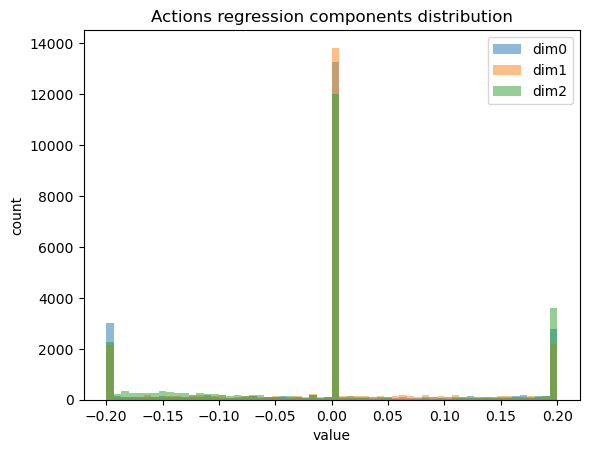

In [8]:
pos_act = train_nps["actions"][:, :3]
labels = ["dim0", "dim1", "dim2"]

plt.figure()
for i in range(3):
    plt.hist(pos_act[:, i], bins=60, alpha=0.5, label=labels[i])
plt.title("Actions regression components distribution")
plt.xlabel("value"); plt.ylabel("count")
plt.legend()
plt.savefig("./outputs/Q1a_EDA/actions_reg_overlay_hist.png", bbox_inches="tight", dpi=150)
plt.show()

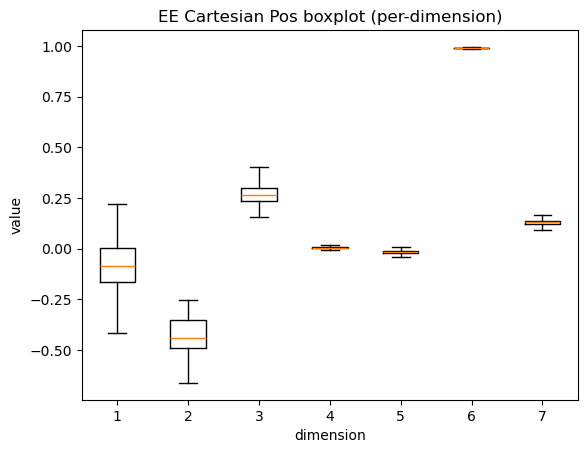

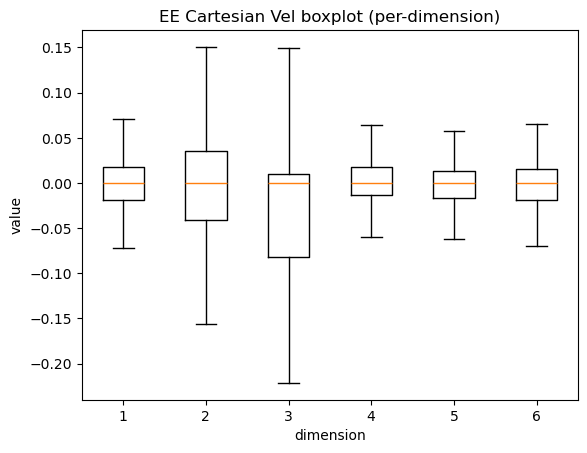

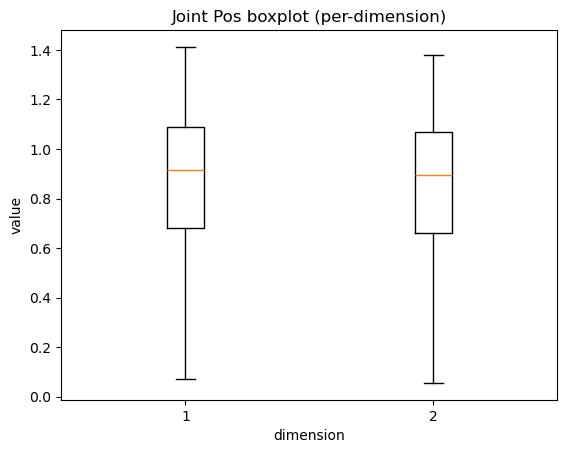

In [9]:
def boxplot_state(key, title):
    X = np.asarray(train_nps[key])
    plt.figure()
    plt.boxplot([X[:, d] for d in range(X.shape[1])], showfliers=False)
    plt.title(title)
    plt.xlabel("dimension"); plt.ylabel("value")
    plt.savefig(f"./outputs/Q1a_EDA/{key}_boxplot.png", bbox_inches="tight", dpi=150)
    plt.show()

boxplot_state("ee_cartesian_pos_ob", "EE Cartesian Pos boxplot (per-dimension)")
boxplot_state("ee_cartesian_vel_ob", "EE Cartesian Vel boxplot (per-dimension)")
boxplot_state("joint_pos_ob", "Joint Pos boxplot (per-dimension)")

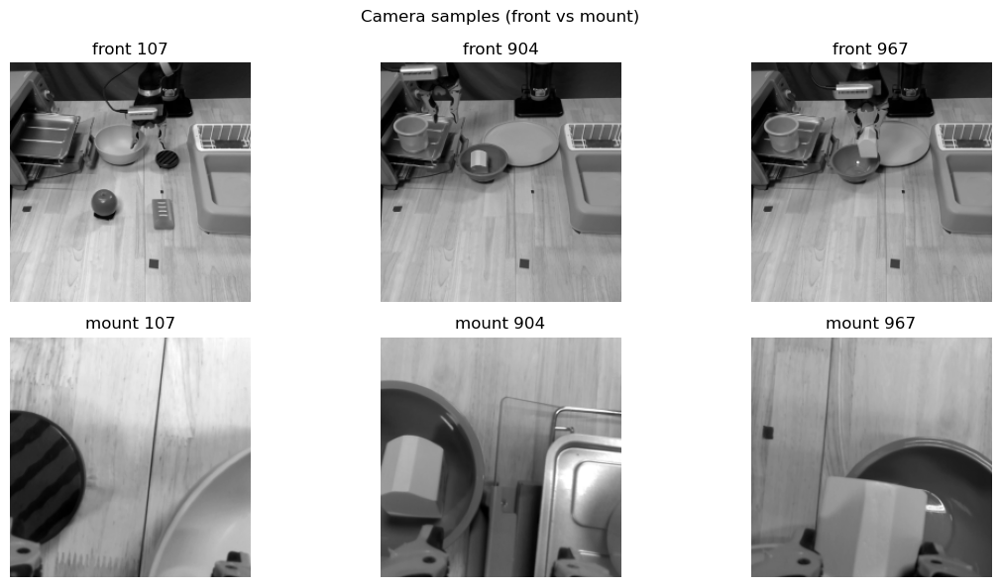

In [8]:
front = train_nps["front_cam_ob"]
mount = train_nps["mount_cam_ob"]
idxs = [107, 904, 967]  # 你之前已经保存的那三张

fig, axes = plt.subplots(2, len(idxs), figsize=(4*len(idxs), 6))
for j, idx in enumerate(idxs):
    axes[0, j].imshow(front[idx], cmap="gray")
    axes[0, j].set_title(f"front {idx}")
    axes[0, j].axis("off")

    axes[1, j].imshow(mount[idx], cmap="gray")
    axes[1, j].set_title(f"mount {idx}")
    axes[1, j].axis("off")

plt.suptitle("Camera samples (front vs mount)")
plt.tight_layout()
plt.savefig("./outputs/Q1a_EDA/camera_samples_grid.png", bbox_inches="tight", dpi=150)
plt.show()

In [7]:
cnn2_config = ConvolutionLayersConfig(
    input_dim=224,
    input_channels=2,
    layers=[
        nn.Conv2d(
            in_channels=2,
            out_channels=8,
            kernel_size=(3,3),
            stride=1,
            padding=1,
            dilation=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=8,
            out_channels=16,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2)),
        nn.Conv2d(
            in_channels=16,
            out_channels=32,
            kernel_size=(3,3),
            stride=1,
            padding=1
          ),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=(2,2))
        ]
    )

_cnn_output_dim = cnn2_config.get_output_dims()
_cnn_output_channels = cnn2_config.get_output_channels()
_mlp_input_dim = int(
            (_cnn_output_dim[-1]*_cnn_output_dim[-1])*_cnn_output_channels[-1]
            )


image_encoder = JointCNNEncoder(
    cnn=CNN(cnn2_config),
    dense=MLP(
        input_dim=_mlp_input_dim,
        hidden_dims=[256],
        output_dim=128
        )
)

obs_encoder = MLP(
    input_dim = 15,
    hidden_dims = [256,256],
    output_dim = 128
)

dense = MLP(
    input_dim = 128,
    hidden_dims = [64,32],
    output_dim = 6
)

class Baseline1(BaseModel):

  def __init__(
      self,
      image_encoder:JointCNNEncoder,
      obs_encoder:MLP,
      dense:MLP
      ) -> None:
      super().__init__()
      self.image_encoder = image_encoder
      self.obs_encoder = obs_encoder
      self.dense = dense

  def forward(self, images, obs):
    _img_enc = self.image_encoder(images)
    _obs_enc = self.obs_encoder(obs)
    _dense_enc = self.dense(_img_enc+_obs_enc)
    pos = _dense_enc[:,0:3]
    grp = _dense_enc[:,3:]
    return {
        "pos": pos,
        "grp":grp
        }
  def reset(
      self,
      image_encoder_kwargs,
      obs_encoder_kwargs,
      dense_kwargs
      ):
    self.image_encoder.reset(**image_encoder_kwargs)
    self.obs_encoder.reset(**obs_encoder_kwargs)
    self.dense.reset(**dense_kwargs)

torch.manual_seed(1)
model = Baseline1(
    image_encoder=image_encoder,
    obs_encoder=obs_encoder,
    dense=dense
)

In [8]:

pos_criterion = nn.MSELoss(reduction="mean")
grp_criterion = nn.CrossEntropyLoss(reduction="mean")

In [9]:
torch.manual_seed(1)
model.reset({},{},{})
exp_kwargs = {
    "batch_size": 64,
    "learning_rate": 0.001,
    "half_precision": True,
    "target_offset": 0
}

if project_options.debug:
    exp_kwargs["batch_size"] = 4

if exp_kwargs["half_precision"]:
    train_dataset = NpDictDataset(
        array_dict=train_nps,
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

    val_dataset = NpDictDataset(
        array_dict=val_nps,
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )
else:
    train_dataset = NpDictDataset(
        array_dict={k:train_nps[k].astype(np.float32) for k in train_nps},
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

    val_dataset = NpDictDataset(
        array_dict={k:val_nps[k].astype(np.float32) for k in val_nps},
        transform_lkp = global_transforms,
        dep_vars = ["actions"],
        indep_vars = [
            "front_cam_ob","mount_cam_ob", "ee_cartesian_pos_ob",
            "ee_cartesian_vel_ob", "joint_pos_ob"
            ],
        target_offset=exp_kwargs["target_offset"]
        )

print(len(train_dataset))
out = train_dataset[0]

def collate_func(input_list:List[DatasetOutput])->DatasetOutput:
    pos = []
    _grp = []
    images = []
    obs = []
    for val in input_list:
        images.append(
            torch.concat(
                [val.input["front_cam_ob"], val.input["mount_cam_ob"]],
                dim=0
            )[None,:]
            )
        obs.append(
            torch.concat(
                [
                    val.input["ee_cartesian_pos_ob"],
                    val.input["ee_cartesian_vel_ob"],
                    val.input["joint_pos_ob"]
                    ],
                dim=0
            )[None,:]
        )
        pos.append(val.output["actions"][0:3][None,:])
        _grp.append(val.output["actions"][-1:][None])
    _grp = torch.concat(_grp, dim=0)
    grp = torch.zeros(_grp.shape[0],3)
    grp[torch.arange(len(grp)), _grp.squeeze().int()] = 1
    return DatasetOutput(
        input = {
            "images":torch.concat(images,dim=0),
            "obs":torch.concat(obs,dim=0),
            },
        output = {
            "pos":torch.concat(pos, dim=0),
            "grp":grp
            }
    )


train_dataloader = DataLoader(
    train_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=True,
    collate_fn=collate_func,
)
val_dataloader = DataLoader(
    val_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func,
)

first_batch = next(train_dataloader.__iter__())

input_dim = first_batch.input["images"].shape
print(input_dim)
input_dim = first_batch.input["obs"].shape
print(input_dim)
pos_dim = first_batch.output["pos"].shape
print(pos_dim)
grp_dim = first_batch.output["grp"].shape
print(grp_dim)

exp_kwargs["model_def"] = model.__repr__()


if exp_kwargs["half_precision"]:
    model = model.half()
optimizer = torch.optim.Adam(
    model.parameters(), lr=exp_kwargs["learning_rate"],
    eps=1e-04
    )

__criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":pos_criterion,
        "grp": grp_criterion
    }
    )

if exp_kwargs["half_precision"]:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            with torch.autocast(device_type="cuda"):
                res = model(
                    images=first_batch.input["images"].cuda(),
                    obs=first_batch.input["obs"].cuda()
                    )
                first_batch.output["pos"] = first_batch.output["pos"].cuda()
                first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            with torch.autocast(device_type="cpu"):
                res = model(
                    images=first_batch.input["images"],
                    obs=first_batch.input["obs"]
                    )
else:
    with torch.no_grad():
        if torch.cuda.is_available():
            model = model.cuda()
            res = model(
                images=first_batch.input["images"].cuda(),
                obs=first_batch.input["obs"].cuda()
                )
            first_batch.output["pos"] = first_batch.output["pos"].cuda()
            first_batch.output["grp"] = first_batch.output["grp"].cuda()
        else:
            res = model(
                images=first_batch.input["images"],
                obs=first_batch.input["obs"]
                )
print(__criterion(res,first_batch.output))

25469
torch.Size([64, 2, 224, 224])
torch.Size([64, 15])
torch.Size([64, 3])
torch.Size([64, 3])
tensor(1.5134, device='cuda:0')


In [10]:
mo = WandBMetricOrchestrator()

train_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="train",
    mo=mo
    )

val_criterion = TrackerBalancedLoss(
    loss_lkp={
        "pos":copy.deepcopy(pos_criterion),
        "grp":copy.deepcopy(grp_criterion)
    },
    name="val",
    mo=mo
    )

sl_trainer = TorchTrainingLoop(
    model=model, gpu=True, optimizer=optimizer, criterion=train_criterion,
    val_criterion=val_criterion, epochs=10, logger=logger,
    mo=WandBMetricOrchestrator(), half_precision=exp_kwargs["half_precision"],
    preds_save_type=None
)

wandb_name = "End_to_end_1"
wandb_grp="End_to_end"

if project_options.debug:
    wandb_name = f"{wandb_name}_DEBUG"


orig = datetime.datetime.now()
sl_trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp=wandb_grp,
    wandb_config=exp_kwargs,
    wandb_name=wandb_name,
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
    )
post_train = datetime.datetime.now()

wandb: Currently logged in as: zczqbt1 (zczqbt1-ucl) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


100%|██████████| 398/398 [00:21<00:00, 18.55it/s]


epoch_train_loss,█▁▁▁▁▁▁▁▁▁
epoch_val_loss,▂▁▁▂▃▂▃▄▅█
grp_train_loss,▆█▅▅▇▄▅▆▅▆▆▇▅▄▄▃▄▅▅▃▃▃▃▃▄▂▃▄▃▂▃▂▂▂▂▂▁▄▃▂
grp_val_loss,▂▃▃▃▂▃▃▁▄▁▃▂▃▁▃▃▃▅▂▇▁▃▆▄▁▄▄▅▄▁█▃▅▄▆▇▅▂▄▃
pos_train_loss,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▃▆▄▄▃▂▂▁▁▁▂▃▃▁▂▅▅▅█▅▆▄▄▃▃▄▃▆▁▂▃▃▅█▄▃▂▁▃█
epoch_train_loss,0.27588
epoch_val_loss,0.97217
grp_train_loss,0.2339
grp_val_loss,0.82906
pos_train_loss,0.01236


In [ ]:
import torch, os
OUT = "outputs/q1_baseline/checkpoints"
os.makedirs(OUT, exist_ok=True)

torch.save(model.state_dict(), f"{OUT}/baseline_last.pth")
print("saved:", f"{OUT}/baseline_last.pth")

saved: outputs/q1_baseline/checkpoints/baseline_last.pth


In [11]:
import os, json
import numpy as np
import torch
import matplotlib.pyplot as plt
import pandas as pda

from sklearn.metrics import (
    confusion_matrix, classification_report,
    f1_score, accuracy_score, precision_recall_curve,
    average_precision_score
)

# =============================
# 1) Utilities
# =============================
import re
import torch

from collections import Counter

def _count_leading_base(k: str) -> int:
# Note
    m = re.match(r'^(base\.)+', k)
    if not m:
        return 0
    return m.group(0).count("base.")

def _set_base_depth(k: str, target_depth: int) -> str:
# Note
# Note
    stripped = re.sub(r'^(base\.)+', '', k)
    if target_depth <= 0:
        return stripped
    return ("base." * target_depth) + stripped

def load_ckpt_into_model(model, ckpt_path, device=None, strict=True):
    """Load ckpt and auto-align repeated 'base.' prefix depth to current model."""
    if device is None:
        device = "cuda" if torch.cuda.is_available() else "cpu"

    ckpt = torch.load(ckpt_path, map_location="cpu")
    state_dict = ckpt["model_state_dict"] if isinstance(ckpt, dict) and "model_state_dict" in ckpt else ckpt

    # 1) strip "module."
    if any(k.startswith("module.") for k in state_dict.keys()):
        state_dict = {k.replace("module.", "", 1): v for k, v in state_dict.items()}

    # 2) infer model's desired base-depth (how many leading base. are common)
    model_keys = list(model.state_dict().keys())
    model_depths = [_count_leading_base(k) for k in model_keys]
# Note
    depth_counter = Counter(model_depths)
    target_depth = depth_counter.most_common(1)[0][0] if len(depth_counter) else 0

    # 3) remap ckpt keys to that depth, then filter to model keys
    model_key_set = set(model_keys)
    remapped = {}
    for k, v in state_dict.items():
        k2 = _set_base_depth(k, target_depth)
        if k2 in model_key_set:
# Note
            if k2 not in remapped:
                remapped[k2] = v

    # 4) load
    model = model.to(device)
    incompatible = model.load_state_dict(remapped, strict=strict)
    model.eval()

    # debug summary
    if hasattr(incompatible, "missing_keys") and hasattr(incompatible, "unexpected_keys"):
        if len(incompatible.missing_keys) or len(incompatible.unexpected_keys):
            print(f"[load_ckpt_into_model] target_base_depth={target_depth} "
                  f"missing={len(incompatible.missing_keys)} unexpected={len(incompatible.unexpected_keys)}")

    param_dtype = next(model.parameters()).dtype
    use_fp16 = (param_dtype == torch.float16)
    return model, device, param_dtype, use_fp16













def _softmax_np(logits):
    logits = logits - logits.max(axis=1, keepdims=True)
    exp = np.exp(logits)
    return exp / (exp.sum(axis=1, keepdims=True) + 1e-12)


def run_val_inference(model, val_dataloader, device, use_fp16):
    """Run inference on val_dataloader and return numpy arrays."""
    pos_true_list, pos_pred_list = [], []
    grp_true_list, grp_out_list = [], []

    with torch.no_grad():
        for batch in val_dataloader:
            images = batch.input["images"].to(device)
            obs    = batch.input["obs"].to(device)

            if use_fp16:
                images = images.half()
                obs = obs.half()

            pos_true = batch.output["pos"].to(device)     # (B,3)
            grp_true_oh = batch.output["grp"].to(device)  # (B,3) one-hot

            if device == "cuda":
                with torch.autocast(device_type="cuda"):
                    out = model(images=images, obs=obs)
            else:
                out = model(images=images, obs=obs)

            if isinstance(out, dict):
                pos_pred = out["pos"]
                grp_out  = out["grp"]
            else:
                pos_pred = out.pos
                grp_out  = out.grp

            pos_true_list.append(pos_true.detach().float().cpu().numpy())
            pos_pred_list.append(pos_pred.detach().float().cpu().numpy())

            grp_true = torch.argmax(grp_true_oh, dim=1)
            grp_true_list.append(grp_true.detach().cpu().numpy())
            grp_out_list.append(grp_out.detach().float().cpu().numpy())

    pos_true = np.concatenate(pos_true_list, axis=0)
    pos_pred = np.concatenate(pos_pred_list, axis=0)
    y_true   = np.concatenate(grp_true_list, axis=0)
    grp_out  = np.concatenate(grp_out_list, axis=0)   # logits or probs, shape (N,3)

    # Convert to probs safely (assume logits -> softmax)
    probs = _softmax_np(grp_out)
    y_pred = probs.argmax(axis=1)

    return pos_true, pos_pred, y_true, probs


def compute_metrics_and_curves(pos_true, pos_pred, y_true, probs, eps=1e-8):
    """Compute regression + classification metrics, return dict + curves."""
    # ---- Regression (pos) ----
    err = pos_pred - pos_true
    abs_err = np.abs(err)

    mae_dim = abs_err.mean(axis=0)
    rmse_dim = np.sqrt((err**2).mean(axis=0))
    mae_all = abs_err.mean()
    rmse_all = np.sqrt((err**2).mean())

    sign_agree = (np.sign(pos_pred) == np.sign(pos_true)).astype(np.float32)
    sign_agree_dim = sign_agree.mean(axis=0)
    sign_agree_all = sign_agree.mean()

    dot = (pos_pred * pos_true).sum(axis=1)
    n1 = np.linalg.norm(pos_pred, axis=1)
    n2 = np.linalg.norm(pos_true, axis=1)
    cos_sim = dot / (n1 * n2 + eps)
    cos_sim_mean = float(np.mean(cos_sim))

    # ---- Classification (grp) ----
    y_pred = probs.argmax(axis=1)
    acc = float(accuracy_score(y_true, y_pred))
    f1_macro = float(f1_score(y_true, y_pred, average="macro"))
    f1_weighted = float(f1_score(y_true, y_pred, average="weighted"))

    cm = confusion_matrix(y_true, y_pred, labels=[0,1,2])
    cm_norm = cm / (cm.sum(axis=1, keepdims=True) + 1e-8)

    y_true_oh = np.eye(3)[y_true]
    ap_per_class = []
    prec_curves, rec_curves = [], []
    for c in range(3):
        ap = average_precision_score(y_true_oh[:, c], probs[:, c])
        ap_per_class.append(float(ap))
        p, r, _ = precision_recall_curve(y_true_oh[:, c], probs[:, c])
        prec_curves.append(p)
        rec_curves.append(r)
    pr_auc_macro = float(np.mean(ap_per_class))

    cls_report = classification_report(y_true, y_pred, digits=4)

    metrics = {
        "regression": {
            "MAE_all": float(mae_all),
            "RMSE_all": float(rmse_all),
            "MAE_dim": mae_dim.tolist(),
            "RMSE_dim": rmse_dim.tolist(),
            "SignAgree_all": float(sign_agree_all),
            "SignAgree_dim": sign_agree_dim.tolist(),
            "CosineSim_mean": float(cos_sim_mean),
        },
        "classification": {
            "Accuracy": acc,
            "F1_macro": f1_macro,
            "F1_weighted": f1_weighted,
            "PR_AUC_macro": pr_auc_macro,
            "PR_AUC_per_class": ap_per_class,
            "ConfusionMatrix_counts": cm.tolist(),
            "ConfusionMatrix_normalized": cm_norm.tolist(),
            "Classification_report": cls_report,
        }
    }

    aux = {
        "cm": cm,
        "cm_norm": cm_norm,
        "prec_curves": prec_curves,
        "rec_curves": rec_curves,
        "abs_err": abs_err,
    }

    return metrics, aux


def save_metrics_and_plots(result_dir, ckpt_path, metrics, aux,
                           pos_true=None, pos_pred=None,
                           show_plots=True):
    os.makedirs(result_dir, exist_ok=True)

    # ---- Save json ----
    out_json = {"checkpoint": ckpt_path, **metrics}
    with open(os.path.join(result_dir, "metrics.json"), "w") as f:
        json.dump(out_json, f, indent=2)

    # ---- Save flat csv ----
    flat_rows = [
        ["MAE_all", metrics["regression"]["MAE_all"]],
        ["RMSE_all", metrics["regression"]["RMSE_all"]],
        ["CosineSim_mean", metrics["regression"]["CosineSim_mean"]],
        ["SignAgree_all", metrics["regression"]["SignAgree_all"]],
        ["Accuracy", metrics["classification"]["Accuracy"]],
        ["F1_macro", metrics["classification"]["F1_macro"]],
        ["F1_weighted", metrics["classification"]["F1_weighted"]],
        ["PR_AUC_macro", metrics["classification"]["PR_AUC_macro"]],
    ]
    pd.DataFrame(flat_rows, columns=["metric", "value"]).to_csv(
        os.path.join(result_dir, "metrics.csv"), index=False
    )

    cm, cm_norm = aux["cm"], aux["cm_norm"]

    # ---- (a) Confusion matrix counts ----
    plt.figure()
    plt.imshow(cm, interpolation="nearest")
    plt.title("Confusion Matrix (Counts)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.xticks([0,1,2], ["0","1","2"])
    plt.yticks([0,1,2], ["0","1","2"])
    for i in range(3):
        for j in range(3):
            plt.text(j, i, str(cm[i, j]), ha="center", va="center")
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(os.path.join(result_dir, "confusion_matrix_counts.png"), dpi=200)
    if show_plots: plt.show()
    else: plt.close()

    # ---- (b) Confusion matrix normalized ----
    plt.figure()
    plt.imshow(cm_norm, interpolation="nearest", vmin=0, vmax=1)
    plt.title("Confusion Matrix (Row-normalized)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.xticks([0,1,2], ["0","1","2"])
    plt.yticks([0,1,2], ["0","1","2"])
    for i in range(3):
        for j in range(3):
            plt.text(j, i, f"{cm_norm[i, j]:.2f}", ha="center", va="center")
    plt.colorbar()
    plt.tight_layout()
    plt.savefig(os.path.join(result_dir, "confusion_matrix_normalized.png"), dpi=200)
    if show_plots: plt.show()
    else: plt.close()

    # ---- (c) PR curves ----
    plt.figure()
    prec_curves, rec_curves = aux["prec_curves"], aux["rec_curves"]
    ap_per_class = metrics["classification"]["PR_AUC_per_class"]
    for c in range(3):
        plt.plot(rec_curves[c], prec_curves[c], label=f"class {c} (AP={ap_per_class[c]:.3f})")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curves (One-vs-Rest)")
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(result_dir, "pr_curves.png"), dpi=200)
    if show_plots: plt.show()
    else: plt.close()

    # ---- (d) Regression abs error hist ----
    abs_err = aux["abs_err"]
    plt.figure()
    plt.hist(abs_err.flatten(), bins=60)
    plt.xlabel("|pred - true|")
    plt.ylabel("count")
    plt.title("Regression Absolute Error Distribution (all dims)")
    plt.tight_layout()
    plt.savefig(os.path.join(result_dir, "reg_abs_error_hist.png"), dpi=200)
    if show_plots: plt.show()
    else: plt.close()

    # ---- (e) Regression true vs pred scatter (norm) ----
    if pos_true is not None and pos_pred is not None:
        true_norm = np.linalg.norm(pos_true, axis=1)
        pred_norm = np.linalg.norm(pos_pred, axis=1)
        plt.figure()
        plt.scatter(true_norm, pred_norm, s=6, alpha=0.5)
        mn = float(min(true_norm.min(), pred_norm.min()))
        mx = float(max(true_norm.max(), pred_norm.max()))
        plt.plot([mn, mx], [mn, mx])
        plt.xlabel("||true||")
        plt.ylabel("||pred||")
        plt.title("Regression: True vs Pred (vector norm)")
        plt.tight_layout()
        plt.savefig(os.path.join(result_dir, "reg_true_vs_pred.png"), dpi=200)
        if show_plots: plt.show()
        else: plt.close()


def evaluate_checkpoint(model, val_dataloader, ckpt_path,
                        result_dir="./results/q1bii",
                        show_plots=True):
    """One-call evaluation: load ckpt -> infer -> metrics -> save plots/files."""
    model, device, param_dtype, use_fp16 = load_ckpt_into_model(model, ckpt_path)

    print(f"[Info] Evaluating checkpoint: {ckpt_path}")
    print(f"[Info] Device={device}, model dtype={param_dtype}, use_fp16={use_fp16}")

    pos_true, pos_pred, y_true, probs = run_val_inference(model, val_dataloader, device, use_fp16)
    metrics, aux = compute_metrics_and_curves(pos_true, pos_pred, y_true, probs)

    save_metrics_and_plots(
        result_dir=result_dir,
        ckpt_path=ckpt_path,
        metrics=metrics,
        aux=aux,
        pos_true=pos_true,
        pos_pred=pos_pred,
        show_plots=show_plots
    )

    # print a quick summary
    print("\n===== Regression (pos) =====")
    print(f"MAE_all:  {metrics['regression']['MAE_all']:.6f}")
    print(f"RMSE_all: {metrics['regression']['RMSE_all']:.6f}")
    print(f"CosSim:   {metrics['regression']['CosineSim_mean']:.6f}")
    print(f"SignAgr:  {metrics['regression']['SignAgree_all']:.6f}")

    print("\n===== Classification (grp) =====")
    print(f"Accuracy:     {metrics['classification']['Accuracy']:.6f}")
    print(f"F1_macro:     {metrics['classification']['F1_macro']:.6f}")
    print(f"F1_weighted:  {metrics['classification']['F1_weighted']:.6f}")
    print(f"PR_AUC_macro: {metrics['classification']['PR_AUC_macro']:.6f}")
    print("\nClassification report:\n", metrics["classification"]["Classification_report"])

    print(f"\nSaved all results to: {result_dir}")

    return metrics

[Info] Evaluating checkpoint: ./models/mdl_chkpnt_epoch_3.pt
[Info] Device=cuda, model dtype=torch.float16, use_fp16=True


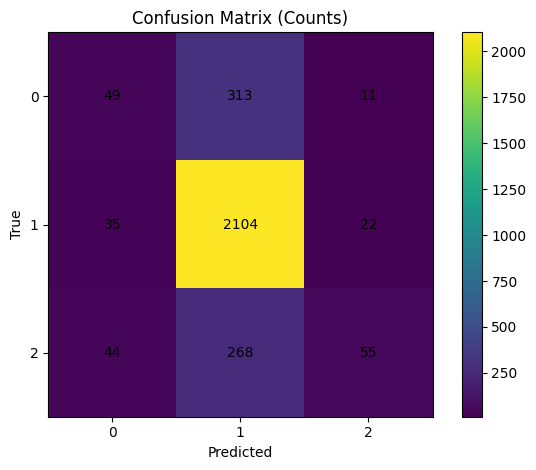

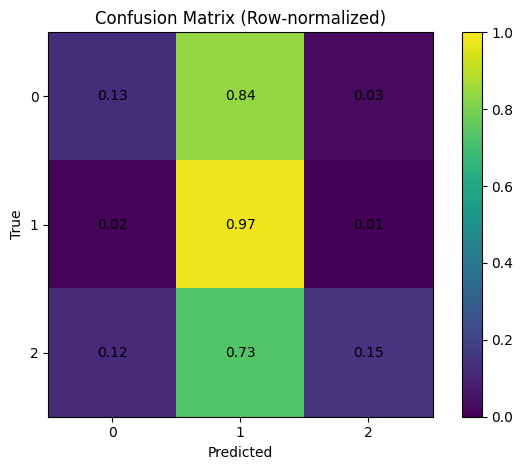

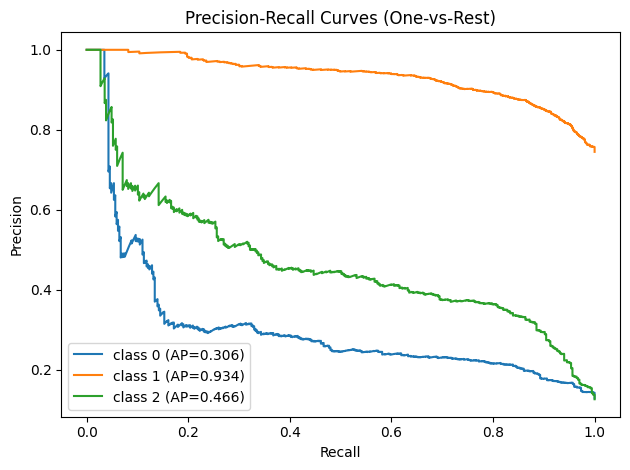

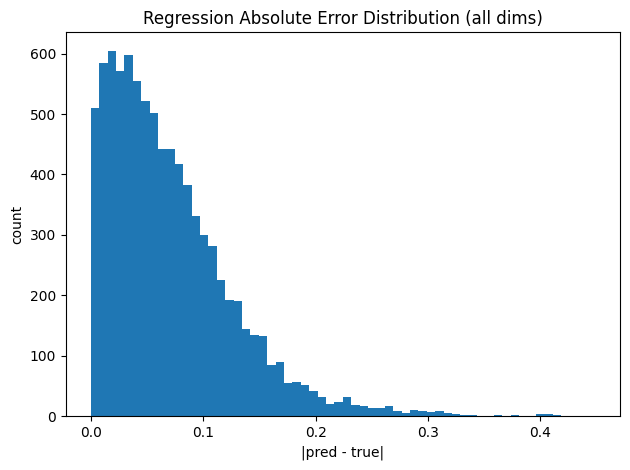

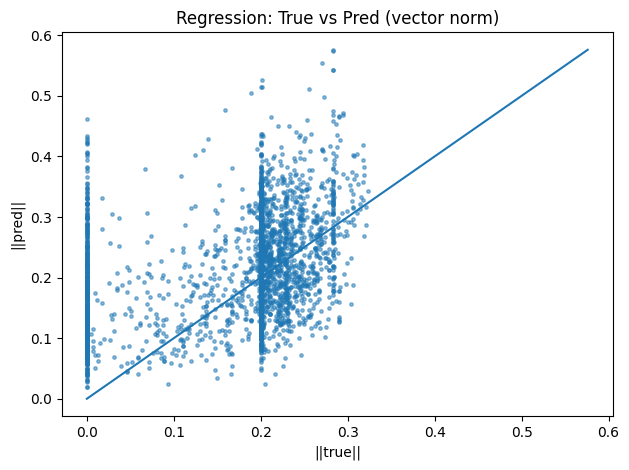


===== Regression (pos) =====
MAE_all:  0.070767
RMSE_all: 0.090508
CosSim:   0.609632
SignAgr:  0.423762

===== Classification (grp) =====
Accuracy:     0.761117
F1_macro:     0.435237
F1_weighted:  0.702579
PR_AUC_macro: 0.568720

Classification report:
               precision    recall  f1-score   support

           0     0.3828    0.1314    0.1956       373
           1     0.7836    0.9736    0.8683      2161
           2     0.6250    0.1499    0.2418       367

    accuracy                         0.7611      2901
   macro avg     0.5971    0.4183    0.4352      2901
weighted avg     0.7120    0.7611    0.7026      2901


Saved all results to: ./results/q1c/epoch_3


In [16]:
import pandas as pd
metrics = evaluate_checkpoint(
    model=model,
    val_dataloader=val_dataloader,
    ckpt_path="./models/mdl_chkpnt_epoch_3.pt",
    result_dir="./results/q1c/epoch_3",
    show_plots=True  # 训练时建议 False，加速；最后再 True
)

In [17]:
import os, json, math
from glob import glob

import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt


def run_q1bii_systematic_failure_analysis(
    model,
    val_dataloader,
    ckpt_path: str,
    out_dir: str = "./results/q1bii/failure_analysis",
    epoch: int | None = None,
    topk: int = 12,
    quantile_tail: float = 0.90,
    use_autocast_if_cuda: bool = True,
    show_plots: bool = True,
):
    """
    Q1.b.ii.iii Systematic Failure Analysis (FULL)
    - fixes wandb hook crash (wandb.run None) by init disabled
    - strips leftover forward hooks
    - supports 2ch (front=1ch, mount=1ch) and 6ch (RGB+RGB), else splits halves
    - saves:
        * all_val_predictions.csv
        * failure_summary.json
        * prevalence bar plot
        * per-mode example panels
        * per-mode montages
        * basic hist compare plots
    Returns a dict with paths + dataframe.
    """

    # =========================
    # 0) Prepare dirs + device
    # =========================
    fig_dir = os.path.join(out_dir, "figures")
    ex_dir  = os.path.join(out_dir, "examples")
    os.makedirs(out_dir, exist_ok=True)
    os.makedirs(fig_dir, exist_ok=True)
    os.makedirs(ex_dir, exist_ok=True)

    device = "cuda" if torch.cuda.is_available() else "cpu"

    # =========================
    # 1) Fix wandb hook crash
    # =========================
    try:
        import wandb
        try:
            if wandb.run is None:
                wandb.init(mode="disabled")
        except Exception as e:
            print("[Warn] wandb.init(mode='disabled') failed:", e)
    except Exception:
        wandb = None  # wandb not installed / not available

    def strip_all_forward_hooks(m):
        """Remove forward hooks that may be left by wandb.watch or other loggers."""
        try:
            if hasattr(m, "_forward_hooks"):
                m._forward_hooks.clear()
            if hasattr(m, "_forward_pre_hooks"):
                m._forward_pre_hooks.clear()
            if hasattr(m, "_backward_hooks"):
                m._backward_hooks.clear()
            if hasattr(m, "_wandb_hook_names"):
                m._wandb_hook_names = []
        except Exception:
            pass

    # =========================
    # 2) Load checkpoint
    # =========================
# Note
    ckpt = torch.load(ckpt_path, map_location=device, weights_only=False)
    state_dict = ckpt["model_state_dict"] if isinstance(ckpt, dict) and "model_state_dict" in ckpt else ckpt
    if any(k.startswith("module.") for k in state_dict.keys()):
        state_dict = {k.replace("module.", "", 1): v for k, v in state_dict.items()}

    model = model.to(device)
    model.load_state_dict(state_dict, strict=True)
    model.eval()

    # strip hooks AFTER loading
    for m in model.modules():
        strip_all_forward_hooks(m)

    param_dtype = next(model.parameters()).dtype
    use_fp16 = (param_dtype == torch.float16)

    print(f"[Info] Failure analysis using checkpoint: {ckpt_path}")
    if epoch is not None:
        print(f"[Info] Epoch={epoch}")
    print(f"[Info] Device={device}, model dtype={param_dtype}, use_fp16={use_fp16}")
    print(f"[Info] Output dir: {out_dir}")

    # =========================
    # 3) Helpers
    # =========================
    def split_front_mount(images_bchw: torch.Tensor):
        """
        images_bchw: (B,C,H,W)
        - C==2: front=ch0, mount=ch1 (both 1ch)
        - C==6: front=0:3, mount=3:6 (RGB+RGB)
        - else: split halves (first half / second half)
        """
        C = images_bchw.shape[1]
        if C == 2:
            front = images_bchw[:, 0:1]
            mount = images_bchw[:, 1:2]
        elif C == 6:
            front = images_bchw[:, 0:3]
            mount = images_bchw[:, 3:6]
        else:
            half = C // 2
            front = images_bchw[:, :half]
            mount = images_bchw[:, half:half + half]
        return front, mount

    def to_hwc_uint8(img_chw: torch.Tensor):
        x = img_chw.detach().float().cpu().numpy()
        x = np.clip(x, 0, 1)
        C = x.shape[0]
        if C == 1:
            x3 = np.repeat(x, 3, axis=0)
        elif C == 2:
            mean = (x[0] + x[1]) / 2.0
            x3 = np.stack([x[0], x[1], mean], axis=0)
        else:
            x3 = x[:3]
        x3 = (x3 * 255.0).astype(np.uint8)
        return np.transpose(x3, (1, 2, 0))

    def img_stats(img_chw: torch.Tensor):
        x = img_chw.detach().float().cpu().numpy()
        x = np.clip(x, 0, 1)
        C = x.shape[0]
        if C == 1:
            gray = x[0]
        elif C == 2:
            gray = 0.5 * x[0] + 0.5 * x[1]
        else:
            gray = 0.2989 * x[0] + 0.5870 * x[1] + 0.1140 * x[2]

        brightness = float(gray.mean())
        contrast   = float(gray.std())

        gx = np.diff(gray, axis=1)
        gy = np.diff(gray, axis=0)
        gm = np.sqrt(gx[:-1, :] ** 2 + gy[:, :-1] ** 2)
        sharpness = float(gm.var())

        sat0 = float((gray < 0.02).mean())
        sat1 = float((gray > 0.98).mean())
        return brightness, contrast, sharpness, sat0, sat1

    def save_example_panel(save_path, front_chw, mount_chw, suptitle):
        front = to_hwc_uint8(front_chw)
        mount = to_hwc_uint8(mount_chw)

        plt.figure(figsize=(10, 4))
        plt.suptitle(suptitle, fontsize=11)

        ax1 = plt.subplot(1, 2, 1)
        ax1.imshow(front)
        ax1.set_title("front_cam", fontsize=10)
        ax1.axis("off")

        ax2 = plt.subplot(1, 2, 2)
        ax2.imshow(mount)
        ax2.set_title("mount_cam", fontsize=10)
        ax2.axis("off")

        plt.tight_layout()
        plt.savefig(save_path, dpi=200)
        plt.close()

    def sanitize_filename(s: str):
        return "".join([ch if ch.isalnum() else "_" for ch in s])

    def montage_from_saved(mode_name, max_imgs=12, ncols=4):
        files = sorted(glob(os.path.join(ex_dir, mode_name, "*.png")))[:max_imgs]
        if len(files) == 0:
            print(f"[Info] No example images for mode: {mode_name}")
            return None

        nrows = math.ceil(len(files) / ncols)
        plt.figure(figsize=(ncols * 4.2, nrows * 2.4))
        for i, fp in enumerate(files):
            img = plt.imread(fp)
            ax = plt.subplot(nrows, ncols, i + 1)
            ax.imshow(img)
            ax.axis("off")
            ax.set_title(os.path.basename(fp).replace(".png", ""), fontsize=8)

        plt.suptitle(f"{mode_name} (top {len(files)} examples)", fontsize=14)
        plt.tight_layout(rect=[0, 0, 1, 0.95])

        outp = os.path.join(fig_dir, f"montage_{sanitize_filename(mode_name)}.png")
        plt.savefig(outp, dpi=200)
        if show_plots:
            plt.show()
        plt.close()
        print("[Saved montage]", outp)
        return outp

    # =========================
    # 4) Inference + per-sample record
    # =========================
    rows = []
    idx_global = 0

    with torch.no_grad():
        for batch in val_dataloader:
            images = batch.input["images"].to(device)  # (B,C,H,W)
            obs    = batch.input["obs"].to(device)

            if use_fp16:
                images = images.half()
                obs = obs.half()

            pos_true = batch.output["pos"].to(device)        # (B,3)
            grp_true_oh = batch.output["grp"].to(device)     # (B,3)
            y_true = torch.argmax(grp_true_oh, dim=1)        # (B,)

            # forward
            if device == "cuda" and use_autocast_if_cuda:
                with torch.autocast(device_type="cuda"):
                    out = model(images=images, obs=obs)
            else:
                out = model(images=images, obs=obs)

            if isinstance(out, dict):
                pos_pred = out["pos"]
                logits = out["grp"]
            else:
                pos_pred = out.pos
                logits = out.grp

            probs = torch.softmax(logits.float(), dim=1)
            y_pred = torch.argmax(probs, dim=1)

            err = (pos_pred.float() - pos_true.float())
            err_norm = torch.linalg.norm(err, dim=1)
            mae_vec = torch.mean(torch.abs(err), dim=1)

            front, mount = split_front_mount(images.float())

            B = images.shape[0]
            for i in range(B):
                f_b, f_c, f_s, f_sat0, f_sat1 = img_stats(front[i])
                m_b, m_c, m_s, m_sat0, m_sat1 = img_stats(mount[i])

                rows.append({
                    "idx": idx_global,
                    "true_grp": int(y_true[i].item()),
                    "pred_grp": int(y_pred[i].item()),
                    "pred_conf": float(probs[i, y_pred[i]].item()),
                    "prob_c0": float(probs[i, 0].item()),
                    "prob_c1": float(probs[i, 1].item()),
                    "prob_c2": float(probs[i, 2].item()),
                    "pos_err_norm": float(err_norm[i].item()),
                    "pos_mae_vec": float(mae_vec[i].item()),
                    "true_pos_norm": float(torch.linalg.norm(pos_true[i].float()).item()),
                    "front_brightness": f_b,
                    "front_contrast": f_c,
                    "front_sharpness": f_s,
                    "mount_brightness": m_b,
                    "mount_contrast": m_c,
                    "mount_sharpness": m_s,
                })
                idx_global += 1

    df = pd.DataFrame(rows)
    pred_csv = os.path.join(out_dir, "all_val_predictions.csv")
    df.to_csv(pred_csv, index=False)
    print("[Saved]", pred_csv)

    # =========================
    # 5) Failure modes + prevalence
    # =========================
    N = len(df)
    miscls = (df["true_grp"] != df["pred_grp"])

    fm_minority_to_major = ((df["true_grp"].isin([0, 2])) & (df["pred_grp"] == 1))
    fm_0_to_1 = ((df["true_grp"] == 0) & (df["pred_grp"] == 1))
    fm_2_to_1 = ((df["true_grp"] == 2) & (df["pred_grp"] == 1))
    fm_0_to_2 = ((df["true_grp"] == 0) & (df["pred_grp"] == 2))
    fm_2_to_0 = ((df["true_grp"] == 2) & (df["pred_grp"] == 0))

    thr = float(df["pos_err_norm"].quantile(quantile_tail))  # tail threshold
    fm_reg_high = (df["pos_err_norm"] >= thr)
    fm_joint = (miscls & fm_reg_high)

    failure_modes = {
        "FM1_minority_0_2_to_major_1": fm_minority_to_major,  # ✅ 使用下划线代替
        "FM1a_true0_to_pred1": fm_0_to_1,
        "FM1b_true2_to_pred1": fm_2_to_1,
        "FM2_true0_true2_confusion": (fm_0_to_2 | fm_2_to_0), # ✅ 使用下划线代替
        f"FM3_regression_high_error_top{int((1-quantile_tail)*100)}pct": fm_reg_high,
        "FM4_joint_miscls_and_high_reg_error": fm_joint,
    }

    summary = {
        "checkpoint": ckpt_path,
        "epoch": epoch,
        "N_val": int(N),
        "reg_high_error_threshold_pos_err_norm_quantile": quantile_tail,
        "reg_high_error_threshold_pos_err_norm_value": thr,
        "modes": {}
    }
    for name, mask in failure_modes.items():
        cnt = int(mask.sum())
        summary["modes"][name] = {"count": cnt, "pct_of_all": float(cnt / N * 100.0)}

    summary_path = os.path.join(out_dir, "failure_summary.json")
    with open(summary_path, "w") as f:
        json.dump(summary, f, indent=2)

    print("[Saved]", summary_path)
    print(json.dumps(summary["modes"], indent=2))

    # prevalence plot
    labels = list(summary["modes"].keys())
    vals = [summary["modes"][k]["pct_of_all"] for k in labels]
    plt.figure(figsize=(10, 4))
    plt.bar(range(len(labels)), vals)
    plt.xticks(range(len(labels)), labels, rotation=25, ha="right")
    plt.ylabel("% of validation samples")
    plt.title("Prevalence of Systematic Failure Modes (Validation)")
    plt.tight_layout()
    prev_fig = os.path.join(fig_dir, "failure_mode_prevalence.png")
    plt.savefig(prev_fig, dpi=200)
    if show_plots:
        plt.show()
    plt.close()
    print("[Saved]", prev_fig)

    # =========================
    # 6) Save top-k example panels per failure mode
    # =========================
    mode_to_indices = {}
    for name, mask in failure_modes.items():
        sub = df[mask].copy()
        if len(sub) == 0:
            mode_to_indices[name] = []
            continue

        if ("FM3" in name) or ("FM4" in name) or ("regression" in name):
            sub = sub.sort_values("pos_err_norm", ascending=False)
        else:
            sub = sub.sort_values("pred_conf", ascending=False)

        mode_to_indices[name] = sub["idx"].head(topk).tolist()

    for name in mode_to_indices:
        os.makedirs(os.path.join(ex_dir, name), exist_ok=True)

    need = set([i for v in mode_to_indices.values() for i in v])
    print("[Info] Saving example images for", len(need), "samples...")

    idx_global = 0
    with torch.no_grad():
        for batch in val_dataloader:
            images_cpu = batch.input["images"]  # CPU tensor
            B = images_cpu.shape[0]
            for i in range(B):
                if idx_global in need:
                    r = df.loc[df["idx"] == idx_global].iloc[0]
                    front_i, mount_i = split_front_mount(images_cpu[i:i+1])
                    front_i = front_i[0]
                    mount_i = mount_i[0]

                    suptitle = (
                        f"idx={idx_global} | true_grp={int(r.true_grp)} pred_grp={int(r.pred_grp)} "
                        f"conf={r.pred_conf:.3f} | pos_err_norm={r.pos_err_norm:.3f}"
                    )

                    for mode_name, idx_list in mode_to_indices.items():
                        if idx_global in idx_list:
                            save_path = os.path.join(ex_dir, mode_name, f"idx_{idx_global}.png")
                            save_example_panel(save_path, front_i, mount_i, suptitle)

                idx_global += 1

    print("[Saved examples under]", ex_dir)

    # =========================
    # 7) Montages
    # =========================
    print("\n[Info] Creating montages ...")
    montage_paths = []
    for mode_name in mode_to_indices.keys():
        outp = montage_from_saved(mode_name, max_imgs=topk, ncols=4)
        if outp is not None:
            montage_paths.append(outp)

    # =========================
    # 8) Basic "why" plots
    # =========================
    df["is_miscls"] = miscls
    df["is_fm3"] = fm_reg_high

    def hist_compare(col, mask_a, mask_b, label_a, label_b, fname):
        plt.figure(figsize=(6, 4))
        plt.hist(df.loc[mask_a, col], bins=40, alpha=0.7, label=label_a)
        plt.hist(df.loc[mask_b, col], bins=40, alpha=0.7, label=label_b)
        plt.xlabel(col)
        plt.ylabel("count")
        plt.title(f"{col}: {label_a} vs {label_b}")
        plt.legend()
        plt.tight_layout()
        outp = os.path.join(fig_dir, fname)
        plt.savefig(outp, dpi=200)
        if show_plots:
            plt.show()
        plt.close()
        print("[Saved]", outp)
        return outp

    extra_figs = []
    extra_figs.append(hist_compare("front_brightness", df["is_miscls"], ~df["is_miscls"],
                                   "misclassified", "correct",
                                   "brightness_front_mis_vs_correct.png"))
    extra_figs.append(hist_compare("mount_brightness", df["is_miscls"], ~df["is_miscls"],
                                   "misclassified", "correct",
                                   "brightness_mount_mis_vs_correct.png"))
    extra_figs.append(hist_compare("front_sharpness", df["is_miscls"], ~df["is_miscls"],
                                   "misclassified", "correct",
                                   "sharpness_front_mis_vs_correct.png"))
    extra_figs.append(hist_compare("mount_sharpness", df["is_miscls"], ~df["is_miscls"],
                                   "misclassified", "correct",
                                   "sharpness_mount_mis_vs_correct.png"))
    extra_figs.append(hist_compare("true_pos_norm", df["is_fm3"], ~df["is_fm3"],
                                   f"high reg error (top{int((1-quantile_tail)*100)}%)", "rest",
                                   "true_pos_norm_higherr_vs_rest.png"))

    print("\n[Done] All outputs saved to:", out_dir)
    print(" - CSV:", pred_csv)
    print(" - Summary:", summary_path)
    print(" - Figures:", fig_dir)
    print(" - Example images:", ex_dir)
    print(" - Montage images:", montage_paths)

    return {
        "df": df,
        "pred_csv": pred_csv,
        "summary_path": summary_path,
        "prevalence_fig": prev_fig,
        "fig_dir": fig_dir,
        "ex_dir": ex_dir,
        "montage_paths": montage_paths,
        "extra_figs": extra_figs,
        "summary": summary,
    }

[Info] Failure analysis using checkpoint: ./models/mdl_chkpnt_epoch_3.pt
[Info] Epoch=3
[Info] Device=cuda, model dtype=torch.float16, use_fp16=True
[Info] Output dir: ./results/q1bii/failure_analysis_epoch3
[Saved] ./results/q1bii/failure_analysis_epoch3\all_val_predictions.csv
[Saved] ./results/q1bii/failure_analysis_epoch3\failure_summary.json
{
  "FM1_minority_0_2_to_major_1": {
    "count": 581,
    "pct_of_all": 20.027576697690453
  },
  "FM1a_true0_to_pred1": {
    "count": 313,
    "pct_of_all": 10.789382971389177
  },
  "FM1b_true2_to_pred1": {
    "count": 268,
    "pct_of_all": 9.238193726301274
  },
  "FM2_true0_true2_confusion": {
    "count": 55,
    "pct_of_all": 1.8958979662185453
  },
  "FM3_regression_high_error_top9pct": {
    "count": 291,
    "pct_of_all": 10.031023784901757
  },
  "FM4_joint_miscls_and_high_reg_error": {
    "count": 81,
    "pct_of_all": 2.792140641158221
  }
}


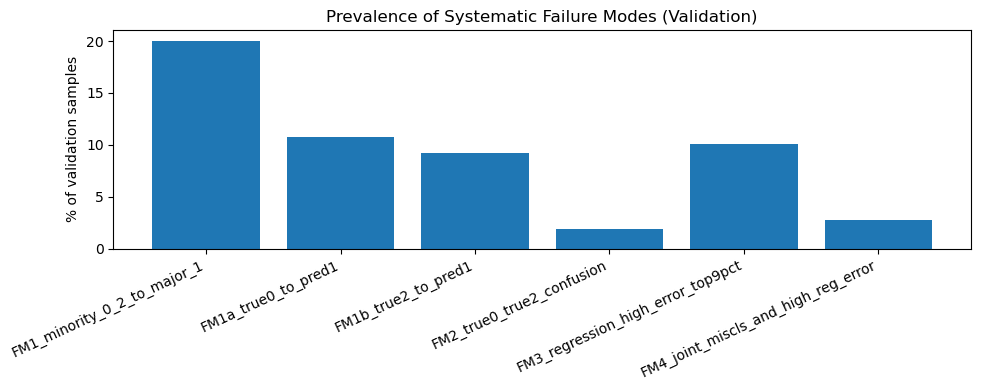

[Saved] ./results/q1bii/failure_analysis_epoch3\figures\failure_mode_prevalence.png
[Info] Saving example images for 49 samples...
[Saved examples under] ./results/q1bii/failure_analysis_epoch3\examples

[Info] Creating montages ...


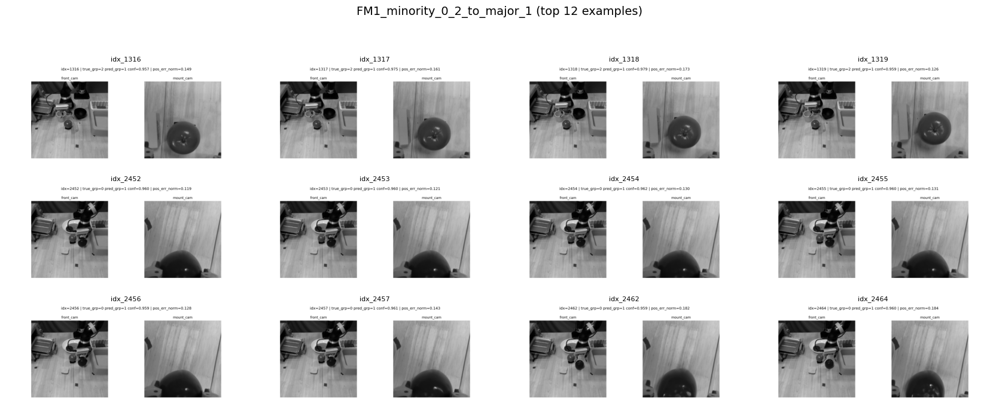

[Saved montage] ./results/q1bii/failure_analysis_epoch3\figures\montage_FM1_minority_0_2_to_major_1.png


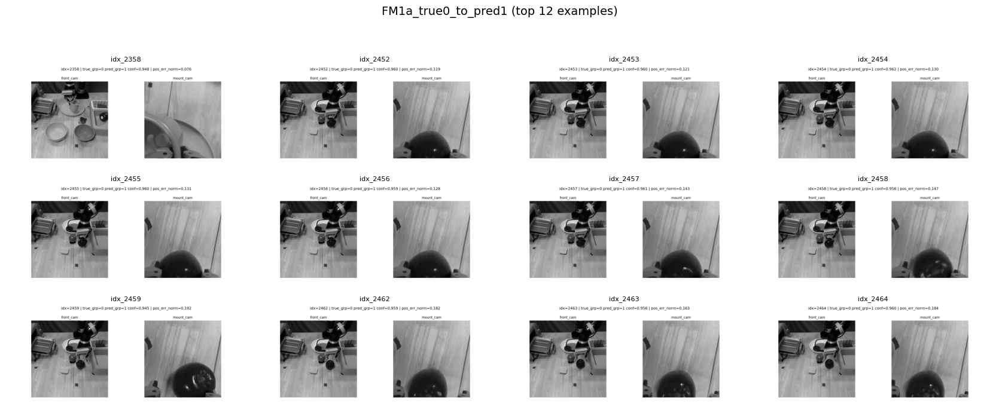

[Saved montage] ./results/q1bii/failure_analysis_epoch3\figures\montage_FM1a_true0_to_pred1.png


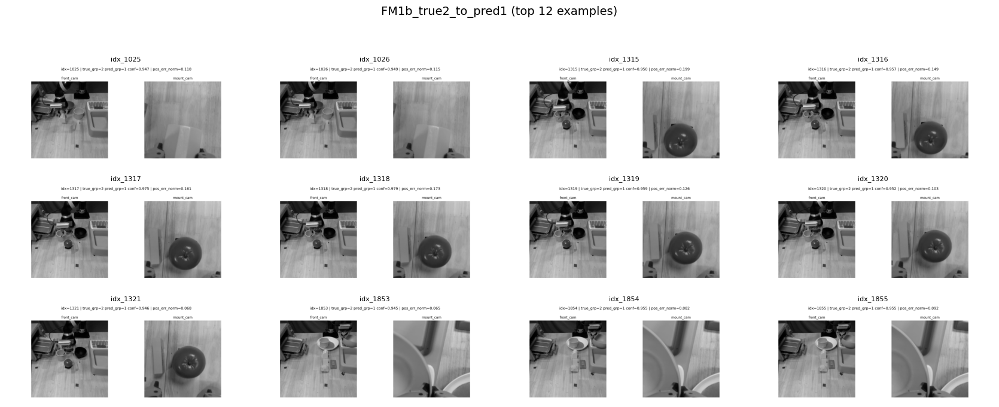

[Saved montage] ./results/q1bii/failure_analysis_epoch3\figures\montage_FM1b_true2_to_pred1.png


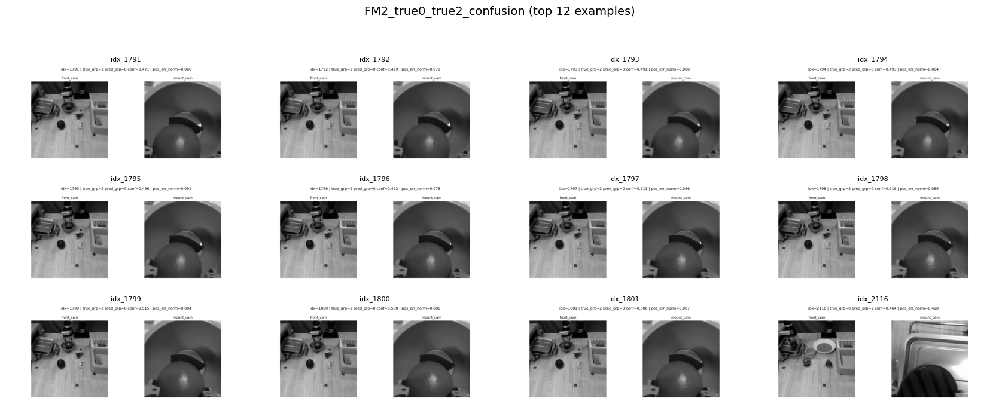

[Saved montage] ./results/q1bii/failure_analysis_epoch3\figures\montage_FM2_true0_true2_confusion.png


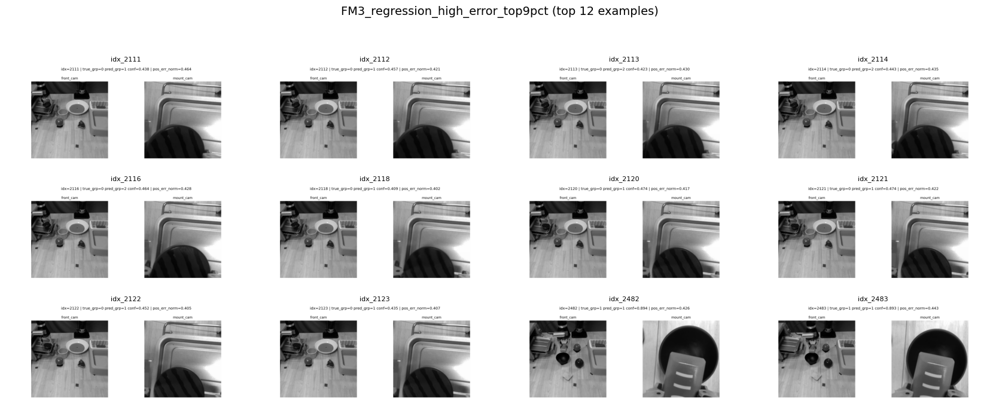

[Saved montage] ./results/q1bii/failure_analysis_epoch3\figures\montage_FM3_regression_high_error_top9pct.png


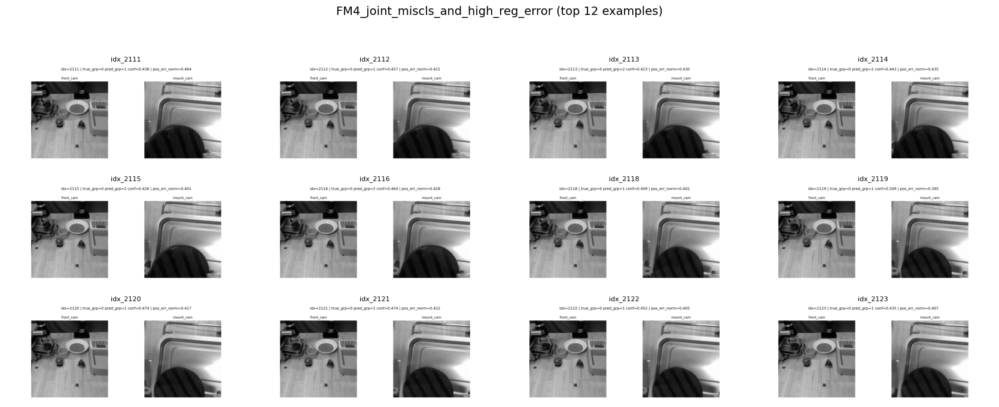

[Saved montage] ./results/q1bii/failure_analysis_epoch3\figures\montage_FM4_joint_miscls_and_high_reg_error.png


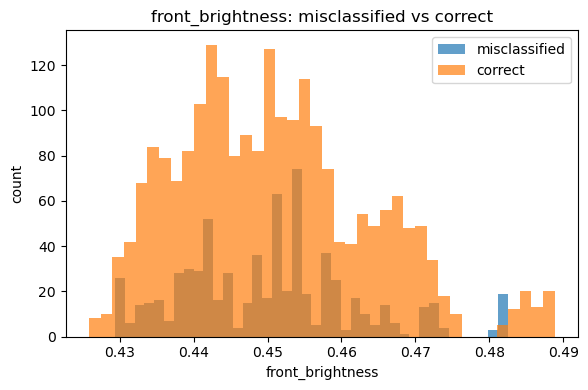

[Saved] ./results/q1bii/failure_analysis_epoch3\figures\brightness_front_mis_vs_correct.png


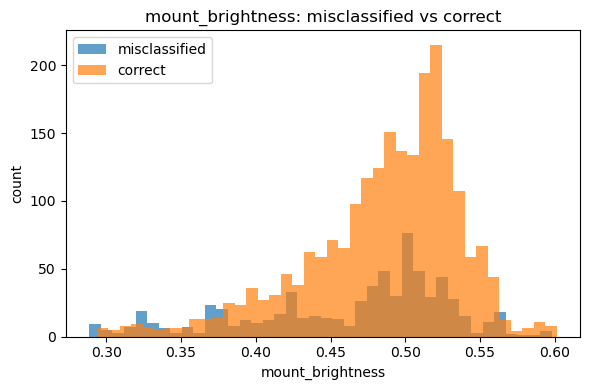

[Saved] ./results/q1bii/failure_analysis_epoch3\figures\brightness_mount_mis_vs_correct.png


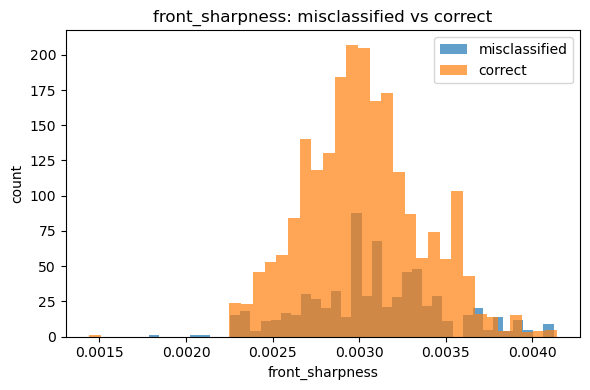

[Saved] ./results/q1bii/failure_analysis_epoch3\figures\sharpness_front_mis_vs_correct.png


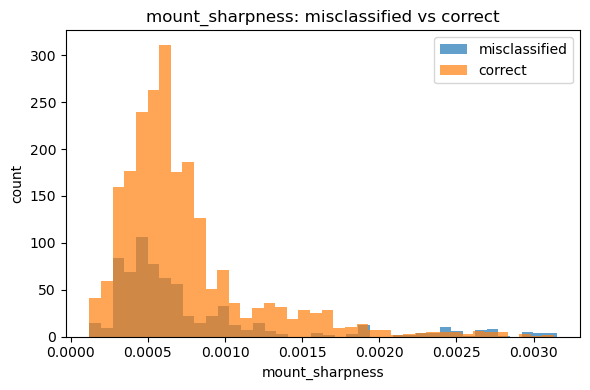

[Saved] ./results/q1bii/failure_analysis_epoch3\figures\sharpness_mount_mis_vs_correct.png


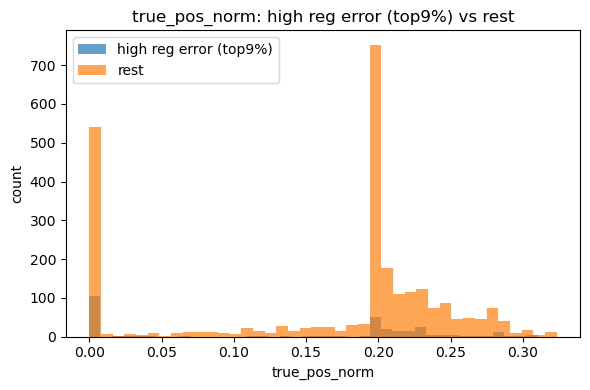

[Saved] ./results/q1bii/failure_analysis_epoch3\figures\true_pos_norm_higherr_vs_rest.png

[Done] All outputs saved to: ./results/q1bii/failure_analysis_epoch3
 - CSV: ./results/q1bii/failure_analysis_epoch3\all_val_predictions.csv
 - Summary: ./results/q1bii/failure_analysis_epoch3\failure_summary.json
 - Figures: ./results/q1bii/failure_analysis_epoch3\figures
 - Example images: ./results/q1bii/failure_analysis_epoch3\examples
 - Montage images: ['./results/q1bii/failure_analysis_epoch3\\figures\\montage_FM1_minority_0_2_to_major_1.png', './results/q1bii/failure_analysis_epoch3\\figures\\montage_FM1a_true0_to_pred1.png', './results/q1bii/failure_analysis_epoch3\\figures\\montage_FM1b_true2_to_pred1.png', './results/q1bii/failure_analysis_epoch3\\figures\\montage_FM2_true0_true2_confusion.png', './results/q1bii/failure_analysis_epoch3\\figures\\montage_FM3_regression_high_error_top9pct.png', './results/q1bii/failure_analysis_epoch3\\figures\\montage_FM4_joint_miscls_and_high_reg_error

,idx,true_grp,pred_grp,pred_conf,prob_c0,prob_c1,prob_c2,pos_err_norm,pos_mae_vec,true_pos_norm,front_brightness,front_contrast,front_sharpness,mount_brightness,mount_contrast,mount_sharpness,is_miscls,is_fm3
0,0,1,1,0.833253,0.085205,0.833253,0.081542,0.111313,0.057943,0.169678,0.433568,0.220904,0.003756,0.527252,0.135525,0.001349,False,False
1,1,1,1,0.836476,0.083758,0.836476,0.079766,0.112482,0.057373,0.197876,0.433683,0.220906,0.003757,0.527108,0.135407,0.001346,False,False
2,2,1,1,0.801324,0.101084,0.801324,0.097592,0.108575,0.052266,0.195679,0.433577,0.220787,0.003761,0.520178,0.134217,0.001306,False,False
3,3,1,1,0.793872,0.105001,0.793872,0.101127,0.106904,0.049672,0.189209,0.433578,0.220958,0.003769,0.520402,0.134165,0.001307,False,False
4,4,1,1,0.823710,0.092961,0.823710,0.083329,0.103358,0.053121,0.197876,0.433553,0.220922,0.003767,0.520190,0.134527,0.001311,False,False


In [ ]:
res = run_q1bii_systematic_failure_analysis(
    model=model,
    val_dataloader=val_dataloader,
    ckpt_path="./models/mdl_chkpnt_epoch_3.pt",
    out_dir="./results/q1bii/failure_analysis_epoch3",
    epoch=3,
    topk=12,
    show_plots=True,
)

# Note
df = res["df"]
df.head()

===== FM1 Prevalence / Bias =====

Row-normalised confusion (P(pred | true)):
 pred_grp       0       1       2
true_grp                        
0         0.1314  0.8391  0.0295
1         0.0162  0.9736  0.0102
2         0.1199  0.7302  0.1499

Counts:
 pred_grp   0     1   2
true_grp              
0         49   313  11
1         35  2104  22
2         44   268  55

FM1a (true=0 -> pred=1) rate: 0.8391
FM1b (true=2 -> pred=1) rate: 0.7302

Overall class distribution:
  true: {0: 0.12857635298173042, 1: 0.744915546363323, 2: 0.12650810065494658}
  pred: {0: 0.04412271630472251, 1: 0.9255429162357808, 2: 0.030334367459496726}


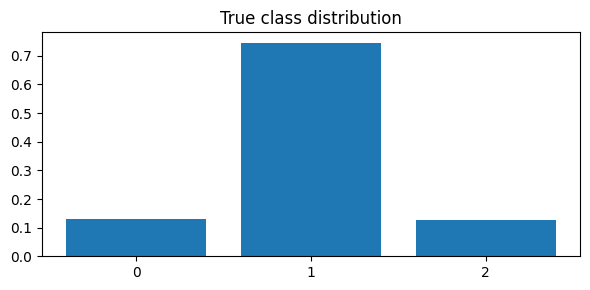

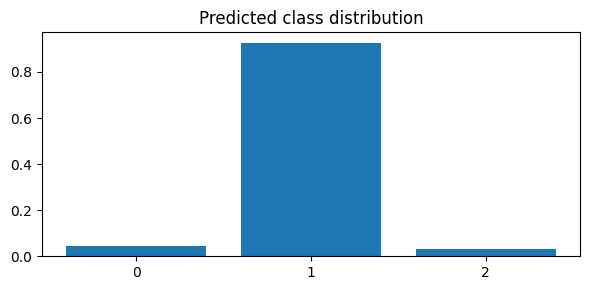


===== Margin / Confidence Summary =====
FM1a true0->pred1: n=313 | mean(prob1)=0.683 | mean(margin 1-vs-true)=1.577 | mean(margin 1-vs-bestNon1)=1.484
Correct true0->pred0: n=49 | mean(prob1)=0.278 | mean(margin 1-vs-true)=-0.670 | mean(margin 1-vs-bestNon1)=-0.670
FM1b true2->pred1: n=268 | mean(prob1)=0.633 | mean(margin 1-vs-true)=1.332 | mean(margin 1-vs-bestNon1)=1.191
Correct true2->pred2: n=55 | mean(prob1)=0.245 | mean(margin 1-vs-true)=-0.592 | mean(margin 1-vs-bestNon1)=-0.592
Correct true1->pred1: n=2104 | mean(prob1)=0.853 | mean(margin 1-vs-true)=0.000 | mean(margin 1-vs-bestNon1)=2.667


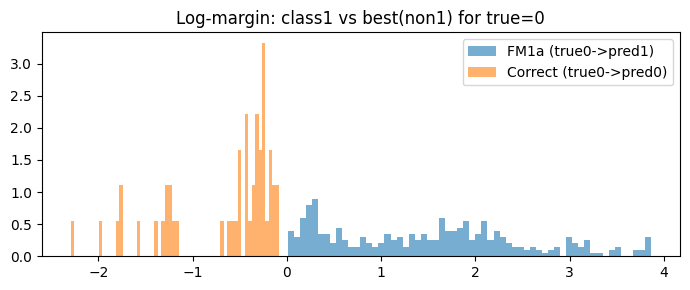

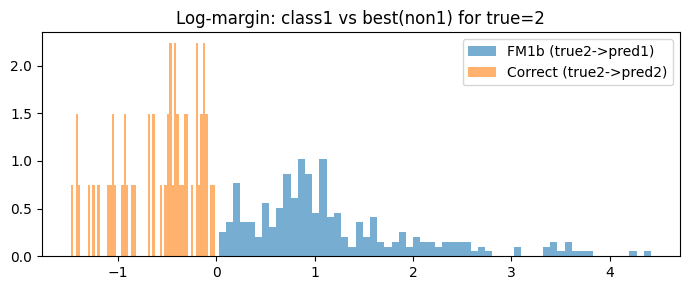


===== Statistical Tests (FM1 vs correct) =====
true0: prob_c1 FM1a vs correct0: KS D=0.9649, p=5.27e-50 | MW U=15285.0, p=5.03e-29
true0: margin FM1a vs correct0: KS D=1.0000, p=1.54e-61 | MW U=15337.0, p=2.12e-29
true2: prob_c1 FM1b vs correct2: KS D=0.9963, p=1.85e-61 | MW U=14739.0, p=1.61e-31
true2: margin FM1b vs correct2: KS D=1.0000, p=3.30e-63 | MW U=14740.0, p=1.58e-31

===== Calibration (class-1 one-vs-rest) =====
ECE(15 bins) = 0.0381


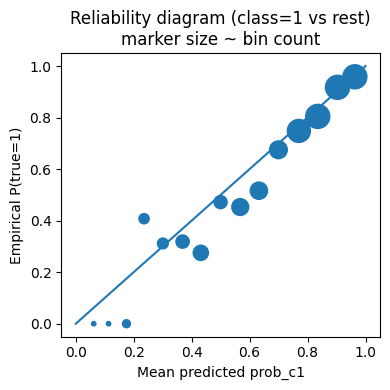

Overconfident wrong-to-1 (prob_c1>=0.5): 0.781  (n=581)
Overconfident wrong-to-1 (prob_c1>=0.7): 0.423  (n=581)
Overconfident wrong-to-1 (prob_c1>=0.9): 0.096  (n=581)

===== Threshold Sweep (reroute low-confidence class-1) =====


,tau,acc,macro_f1,rec0,rec2,rate0->1,rate2->1,f1_0,f1_1,f1_2
0,0.10,0.7611,0.4352,0.1314,0.1499,0.8391,0.7302,0.1956,0.8683,0.2418
1,0.15,0.7611,0.4352,0.1314,0.1499,0.8391,0.7302,0.1956,0.8683,0.2418
2,0.20,0.7611,0.4352,0.1314,0.1499,0.8391,0.7302,0.1956,0.8683,0.2418
3,0.25,0.7611,0.4352,0.1314,0.1499,0.8391,0.7302,0.1956,0.8683,0.2418
4,0.30,0.7611,0.4352,0.1314,0.1499,0.8391,0.7302,0.1956,0.8683,0.2418
5,0.35,0.7611,0.4352,0.1314,0.1499,0.8391,0.7302,0.1956,0.8683,0.2418
6,0.40,0.7608,0.4458,0.1582,0.1553,0.7855,0.7193,0.2278,0.8696,0.2400
7,0.45,0.7670,0.4886,0.2225,0.2098,0.6863,0.6403,0.2907,0.8756,0.2996
8,0.50,0.7628,0.4980,0.2466,0.2343,0.6381,0.5886,0.3026,0.8753,0.3162
9,0.55,0.7635,0.5193,0.2815,0.2807,0.5925,0.5095,0.3226,0.8772,0.3583


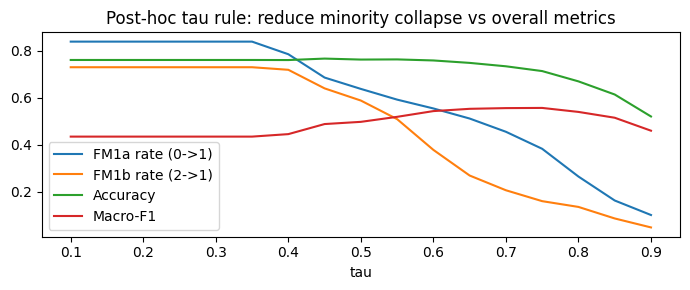


Best tau by (macro_f1, acc):


,tau,acc,macro_f1,rec0,rec2,rate0->1,rate2->1,f1_0,f1_1,f1_2
13,0.75,0.7139,0.5572,0.445,0.5068,0.3834,0.1608,0.3543,0.8422,0.4751



===== Optional: Representation separability (hook -> PCA2D) =====
Could not auto-find the last nn.Linear(out_features=3). Skipping hook analysis.

[Done] FM1 evidence generated.


In [18]:
# ============================================================
# FM1 Evidence Pack (minority collapse: true {0,2} -> pred 1)
# - Works without changing preprocessing/dataloader.
# - Uses existing failure-analysis df if available; otherwise loads CSV.
# - Adds "harder" evidence: bias/margins, calibration+ECE, threshold sweep,
#   statistical tests, and (optional) representation separability via hooks.
# ============================================================

import os, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

# ----------------------------
# 0) Load df (from res or CSV)
# ----------------------------
df = None
if "res" in globals() and isinstance(res, dict) and "df" in res:
    df = res["df"].copy()
elif "df" in globals() and isinstance(df, pd.DataFrame):
    df = df.copy()
else:
    # Try common default path
    cand = "./results/q1bii/failure_analysis/all_val_predictions.csv"
    if os.path.exists(cand):
        df = pd.read_csv(cand)
    else:
        raise FileNotFoundError(
            "Cannot find df/res['df'] and cannot find ./results/q1bii/failure_analysis/all_val_predictions.csv.\n"
            "Please run run_q1bii_systematic_failure_analysis(...) first (so res['df'] exists), or point to the saved CSV."
        )

# Sanity
req_cols = {"true_grp","pred_grp","prob_c0","prob_c1","prob_c2","pred_conf"}
missing = req_cols - set(df.columns)
if missing:
    raise ValueError(f"df missing required columns: {missing}")

eps = 1e-12
df["is_correct"] = (df["true_grp"] == df["pred_grp"]).astype(int)

# ============================
# 1) FM1 prevalence + bias view
# ============================
print("===== FM1 Prevalence / Bias =====")
ct = pd.crosstab(df["true_grp"], df["pred_grp"], normalize="index")  # row-normalised
ct_counts = pd.crosstab(df["true_grp"], df["pred_grp"])
print("\nRow-normalised confusion (P(pred | true)):\n", ct.round(4))
print("\nCounts:\n", ct_counts)

# Collapse rate: for minority classes (0 and 2), how often predicted as 1?
fm1_rate0 = ct.loc[0,1] if 0 in ct.index and 1 in ct.columns else np.nan
fm1_rate2 = ct.loc[2,1] if 2 in ct.index and 1 in ct.columns else np.nan
print(f"\nFM1a (true=0 -> pred=1) rate: {fm1_rate0:.4f}")
print(f"FM1b (true=2 -> pred=1) rate: {fm1_rate2:.4f}")

# Pred distribution overall
pred_dist = df["pred_grp"].value_counts(normalize=True).sort_index()
true_dist = df["true_grp"].value_counts(normalize=True).sort_index()
print("\nOverall class distribution:")
print("  true:", true_dist.to_dict())
print("  pred:", pred_dist.to_dict())

plt.figure(figsize=(6,3))
plt.bar([0,1,2], [true_dist.get(i,0) for i in [0,1,2]])
plt.title("True class distribution")
plt.xticks([0,1,2])
plt.tight_layout()
plt.show()

plt.figure(figsize=(6,3))
plt.bar([0,1,2], [pred_dist.get(i,0) for i in [0,1,2]])
plt.title("Predicted class distribution")
plt.xticks([0,1,2])
plt.tight_layout()
plt.show()

# ============================
# 2) Margin evidence (log-odds / confidence separation)
# ============================
# Key idea:
#  - If minority collapse is systematic, then for true=0/2 samples, prob_c1 (and log-odds to 1)
#    is consistently high, especially in misclassified subset.
def safe_log(x): 
    return np.log(np.clip(x, eps, 1.0))

df["logp0"] = safe_log(df["prob_c0"].values)
df["logp1"] = safe_log(df["prob_c1"].values)
df["logp2"] = safe_log(df["prob_c2"].values)

# For each sample: how strongly class-1 dominates the true class?
df["log_margin_1_vs_true"] = np.nan
for t in [0,1,2]:
    m = (df["true_grp"] == t)
    df.loc[m, "log_margin_1_vs_true"] = df.loc[m, "logp1"] - df.loc[m, f"logp{t}"]

# Another useful margin: 1 vs "best non-1"
df["log_margin_1_vs_best_non1"] = df["logp1"] - np.maximum(df["logp0"], df["logp2"])

# Define key subsets
S_true0 = df[df["true_grp"] == 0]
S_true2 = df[df["true_grp"] == 2]
S_true1 = df[df["true_grp"] == 1]

S_fm1a = df[(df["true_grp"] == 0) & (df["pred_grp"] == 1)]
S_fm1b = df[(df["true_grp"] == 2) & (df["pred_grp"] == 1)]
S_correct0 = df[(df["true_grp"] == 0) & (df["pred_grp"] == 0)]
S_correct2 = df[(df["true_grp"] == 2) & (df["pred_grp"] == 2)]
S_correct1 = df[(df["true_grp"] == 1) & (df["pred_grp"] == 1)]

print("\n===== Margin / Confidence Summary =====")
def summ(name, s):
    if len(s) == 0:
        return f"{name}: n=0"
    return (f"{name}: n={len(s)} | "
            f"mean(prob1)={s['prob_c1'].mean():.3f} | "
            f"mean(margin 1-vs-true)={s['log_margin_1_vs_true'].mean():.3f} | "
            f"mean(margin 1-vs-bestNon1)={s['log_margin_1_vs_best_non1'].mean():.3f}")

print(summ("FM1a true0->pred1", S_fm1a))
print(summ("Correct true0->pred0", S_correct0))
print(summ("FM1b true2->pred1", S_fm1b))
print(summ("Correct true2->pred2", S_correct2))
print(summ("Correct true1->pred1", S_correct1))

# Plot margin distributions (FM1 vs correct)
def hist_overlay(a, b, label_a, label_b, title, bins=60):
    plt.figure(figsize=(7,3))
    plt.hist(a, bins=bins, alpha=0.6, density=True, label=label_a)
    plt.hist(b, bins=bins, alpha=0.6, density=True, label=label_b)
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

hist_overlay(
    S_fm1a["log_margin_1_vs_best_non1"].values,
    S_correct0["log_margin_1_vs_best_non1"].values,
    "FM1a (true0->pred1)",
    "Correct (true0->pred0)",
    "Log-margin: class1 vs best(non1) for true=0"
)
hist_overlay(
    S_fm1b["log_margin_1_vs_best_non1"].values,
    S_correct2["log_margin_1_vs_best_non1"].values,
    "FM1b (true2->pred1)",
    "Correct (true2->pred2)",
    "Log-margin: class1 vs best(non1) for true=2"
)

# ============================
# 3) Statistical test evidence (KS + Mann–Whitney) on prob_c1 / margins
# ============================
print("\n===== Statistical Tests (FM1 vs correct) =====")
try:
    from scipy.stats import ks_2samp, mannwhitneyu
    def report_tests(a, b, name):
        a = np.asarray(a); b = np.asarray(b)
        if len(a) < 10 or len(b) < 10:
            print(f"{name}: too few samples for reliable tests (n={len(a)},{len(b)})")
            return
        ks = ks_2samp(a, b, alternative="two-sided", mode="auto")
        mw = mannwhitneyu(a, b, alternative="two-sided")
        print(f"{name}: KS D={ks.statistic:.4f}, p={ks.pvalue:.2e} | MW U={mw.statistic:.1f}, p={mw.pvalue:.2e}")
    report_tests(S_fm1a["prob_c1"], S_correct0["prob_c1"], "true0: prob_c1 FM1a vs correct0")
    report_tests(S_fm1a["log_margin_1_vs_best_non1"], S_correct0["log_margin_1_vs_best_non1"], "true0: margin FM1a vs correct0")
    report_tests(S_fm1b["prob_c1"], S_correct2["prob_c1"], "true2: prob_c1 FM1b vs correct2")
    report_tests(S_fm1b["log_margin_1_vs_best_non1"], S_correct2["log_margin_1_vs_best_non1"], "true2: margin FM1b vs correct2")
except Exception as e:
    print("scipy not available (skipping KS/MW tests). Error:", str(e))

# ============================
# 4) Calibration evidence (One-vs-Rest for class=1) + ECE
# ============================
# Treat "is class-1" as binary label; use prob_c1 as confidence.
def ece_binary(y_true, p, n_bins=15):
    y_true = np.asarray(y_true).astype(int)
    p = np.asarray(p)
    bins = np.linspace(0, 1, n_bins+1)
    ece = 0.0
    bin_acc, bin_conf, bin_cnt = [], [], []
    for i in range(n_bins):
        lo, hi = bins[i], bins[i+1]
        m = (p >= lo) & (p < hi) if i < n_bins-1 else (p >= lo) & (p <= hi)
        cnt = m.sum()
        if cnt == 0:
            bin_acc.append(np.nan); bin_conf.append(np.nan); bin_cnt.append(0)
            continue
        acc = y_true[m].mean()
        conf = p[m].mean()
        ece += (cnt/len(p)) * abs(acc - conf)
        bin_acc.append(acc); bin_conf.append(conf); bin_cnt.append(cnt)
    return ece, np.array(bin_acc), np.array(bin_conf), np.array(bin_cnt), bins

y1 = (df["true_grp"].values == 1).astype(int)
p1 = df["prob_c1"].values
ece, bin_acc, bin_conf, bin_cnt, bins = ece_binary(y1, p1, n_bins=15)
print(f"\n===== Calibration (class-1 one-vs-rest) =====\nECE(15 bins) = {ece:.4f}")

# Reliability diagram
plt.figure(figsize=(4,4))
m = ~np.isnan(bin_acc)
plt.plot([0,1],[0,1])
plt.scatter(bin_conf[m], bin_acc[m], s=np.clip(bin_cnt[m], 10, 300))
plt.title("Reliability diagram (class=1 vs rest)\nmarker size ~ bin count")
plt.xlabel("Mean predicted prob_c1")
plt.ylabel("Empirical P(true=1)")
plt.tight_layout()
plt.show()

# Overconfident wrong-to-1 rate: among pred=1 but true!=1, what fraction has high prob_c1?
wrong_to_1 = df[(df["pred_grp"]==1) & (df["true_grp"]!=1)]
for thr in [0.5, 0.7, 0.9]:
    rate = (wrong_to_1["prob_c1"] >= thr).mean() if len(wrong_to_1) else np.nan
    print(f"Overconfident wrong-to-1 (prob_c1>={thr}): {rate:.3f}  (n={len(wrong_to_1)})")

# ============================
# 5) Threshold sweep (post-hoc decision rule) for FM1 mitigation evidence
# ============================
# Rule: if argmax=1 but prob_c1 < tau, then choose best among {0,2}.
# This shows whether FM1 is partly "decision/calibration" rather than "no information".
def apply_tau_rule(prob0, prob1, prob2, tau):
    prob0 = np.asarray(prob0); prob1 = np.asarray(prob1); prob2 = np.asarray(prob2)
    probs = np.stack([prob0, prob1, prob2], axis=1)
    pred = probs.argmax(axis=1)
    mask = (pred == 1) & (prob1 < tau)
    # reroute to best non-1
    reroute = np.where(prob0 >= prob2, 0, 2)
    pred[mask] = reroute[mask]
    return pred

def macro_f1(y_true, y_pred, n_classes=3):
    y_true = np.asarray(y_true); y_pred = np.asarray(y_pred)
    f1s = []
    for c in range(n_classes):
        tp = np.sum((y_true==c) & (y_pred==c))
        fp = np.sum((y_true!=c) & (y_pred==c))
        fn = np.sum((y_true==c) & (y_pred!=c))
        prec = tp / (tp + fp + eps)
        rec  = tp / (tp + fn + eps)
        f1 = 2*prec*rec/(prec+rec+eps)
        f1s.append(f1)
    return float(np.mean(f1s)), f1s

y_true = df["true_grp"].values
base_pred = df["pred_grp"].values

taus = np.linspace(0.1, 0.9, 17)
rows = []
for tau in taus:
    pred_tau = apply_tau_rule(df["prob_c0"], df["prob_c1"], df["prob_c2"], tau)
    acc = (pred_tau == y_true).mean()
    mf1, f1s = macro_f1(y_true, pred_tau, 3)
    # minority recalls
    rec0 = np.sum((y_true==0) & (pred_tau==0)) / (np.sum(y_true==0) + eps)
    rec2 = np.sum((y_true==2) & (pred_tau==2)) / (np.sum(y_true==2) + eps)
    # collapse rates
    r01 = np.sum((y_true==0) & (pred_tau==1)) / (np.sum(y_true==0) + eps)
    r21 = np.sum((y_true==2) & (pred_tau==1)) / (np.sum(y_true==2) + eps)
    rows.append([tau, acc, mf1, rec0, rec2, r01, r21, f1s[0], f1s[1], f1s[2]])

sweep = pd.DataFrame(rows, columns=[
    "tau", "acc", "macro_f1", "rec0", "rec2", "rate0->1", "rate2->1", "f1_0", "f1_1", "f1_2"
])
print("\n===== Threshold Sweep (reroute low-confidence class-1) =====")
display(sweep.round(4).head(10))

plt.figure(figsize=(7,3))
plt.plot(sweep["tau"], sweep["rate0->1"], label="FM1a rate (0->1)")
plt.plot(sweep["tau"], sweep["rate2->1"], label="FM1b rate (2->1)")
plt.plot(sweep["tau"], sweep["acc"], label="Accuracy")
plt.plot(sweep["tau"], sweep["macro_f1"], label="Macro-F1")
plt.xlabel("tau")
plt.title("Post-hoc tau rule: reduce minority collapse vs overall metrics")
plt.legend()
plt.tight_layout()
plt.show()

best = sweep.sort_values(["macro_f1","acc"], ascending=False).head(1)
print("\nBest tau by (macro_f1, acc):")
display(best.round(4))

# ============================
# 6) (Optional, advanced) Representation separability via forward hook
# ============================
# We try to capture the input features to the last Linear(out_features=3),
# then visualise PCA2D and compute silhouette score.
print("\n===== Optional: Representation separability (hook -> PCA2D) =====")
try:
    import torch
    import torch.nn as nn
    from sklearn.decomposition import PCA
    from sklearn.metrics import silhouette_score

    def find_last_linear_out_features(model, out_features=3):
        last = None
        for name, m in model.named_modules():
            if isinstance(m, nn.Linear) and getattr(m, "out_features", None) == out_features:
                last = (name, m)
        return last

    if "model" not in globals() or "val_dataloader" not in globals():
        print("Skip: 'model' or 'val_dataloader' not found in globals.")
    else:
        model_device = next(model.parameters()).device
        model.eval()

        found = find_last_linear_out_features(model, out_features=3)
        if found is None:
            print("Could not auto-find the last nn.Linear(out_features=3). Skipping hook analysis.")
        else:
            last_name, last_linear = found
            print(f"Hooking features at: {last_name} ({last_linear})")

            feats = []
            labels = []

            def hook_fn(mod, inp, out):
                # inp is a tuple; take first tensor as features
                x = inp[0]
                # flatten if needed
                if x.dim() > 2:
                    x = x.view(x.size(0), -1)
                feats.append(x.detach().float().cpu().numpy())

            h = last_linear.register_forward_hook(hook_fn)

            max_samples = 5000  # keep reasonable
            seen = 0
            with torch.no_grad():
                for batch in val_dataloader:
                    # same forward style as your failure analysis
                    images = batch.input["images"].to(model_device)
                    obs = batch.input["obs"].to(model_device)
                    out = model(images=images, obs=obs)

                    if isinstance(out, dict):
                        logits = out["grp"]
                    else:
                        logits = out.grp

                    # labels
                    y = batch.output["grp"] if isinstance(batch.output, dict) else batch.output.grp
                    labels.append(y.detach().cpu().numpy())

                    seen += images.shape[0]
                    if seen >= max_samples:
                        break

            h.remove()

            X = np.concatenate(feats, axis=0)[:max_samples]
            y = np.concatenate(labels, axis=0)[:max_samples].astype(int)

            # PCA to 2D
            X2 = PCA(n_components=2, random_state=0).fit_transform(X)

            plt.figure(figsize=(6,5))
            for c in [0,1,2]:
                m = (y==c)
                plt.scatter(X2[m,0], X2[m,1], s=6, alpha=0.6, label=f"class {c}")
            plt.title("PCA2D of penultimate features (hooked from last Linear input)")
            plt.legend()
            plt.tight_layout()
            plt.show()

            # Silhouette (higher => better separability). If it is low, supports "collapse due to inseparable rep".
            if len(np.unique(y)) >= 2 and X.shape[0] >= 50:
                sil = silhouette_score(X, y, metric="cosine")
                print(f"Silhouette score (cosine, penultimate features): {sil:.4f}")
            else:
                print("Not enough samples/classes for silhouette.")
except Exception as e:
    print("Hook/PCA/silhouette skipped due to error:", str(e))

print("\n[Done] FM1 evidence generated.")

[FM2] device=cuda | ckpt_path=./models/mdl_chkpnt_epoch_3.pt
[FM2][Embedding] could not find Linear(out_features=3), skip embedding evidence.
[FM2] model dtype=torch.float16
[Saved] ./results/q1bii/fm2_evidence_pack/fm2_all_predictions.csv | N=2901


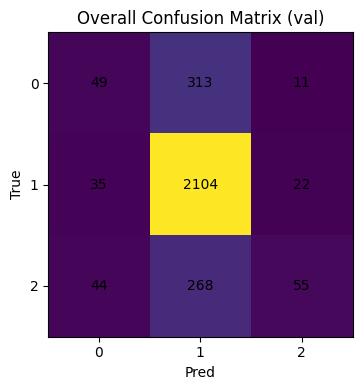

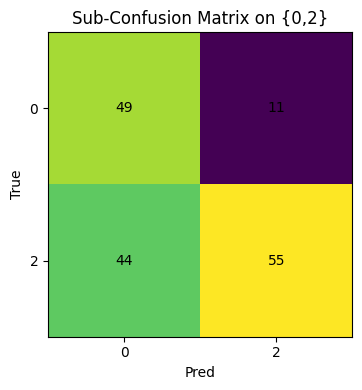

[FM2] count=55 | pct_of_all=1.90%


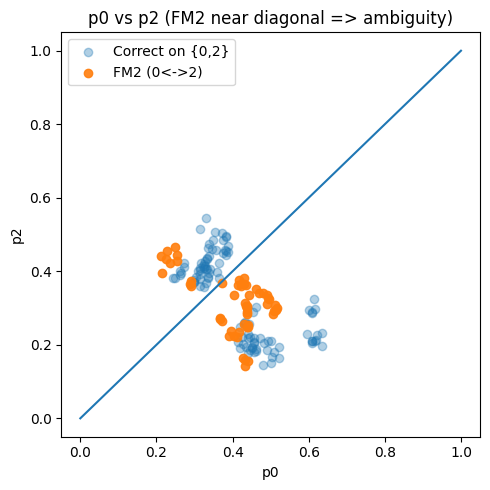

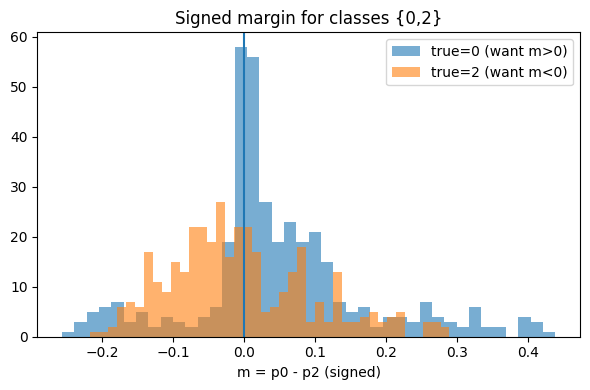

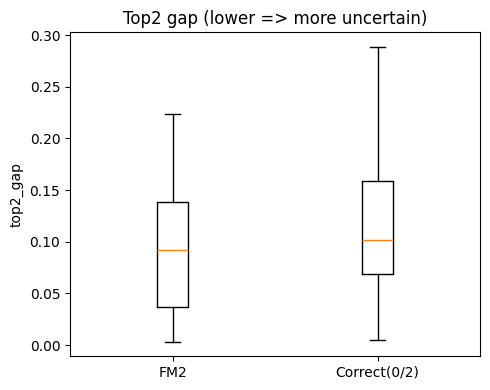

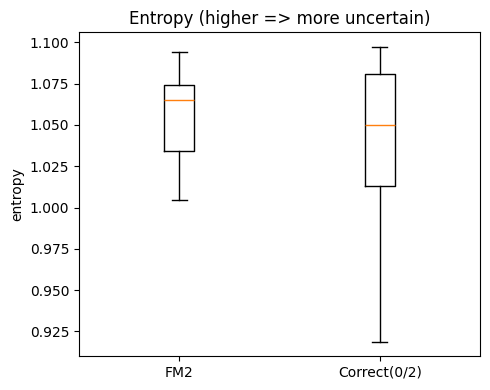

[MWU] top2_gap: U=2368.0, p=7.512e-02 (FM2 vs Correct0/2)
[MWU] entropy: U=3241.0, p=1.683e-01 (FM2 vs Correct0/2)
[MWU] abs(m_prob_02): U=2544.0, p=2.533e-01 (FM2 vs Correct0/2)
[FM2] confident-wrong (pmax>=0.8): 0 / 55 = 0.00%


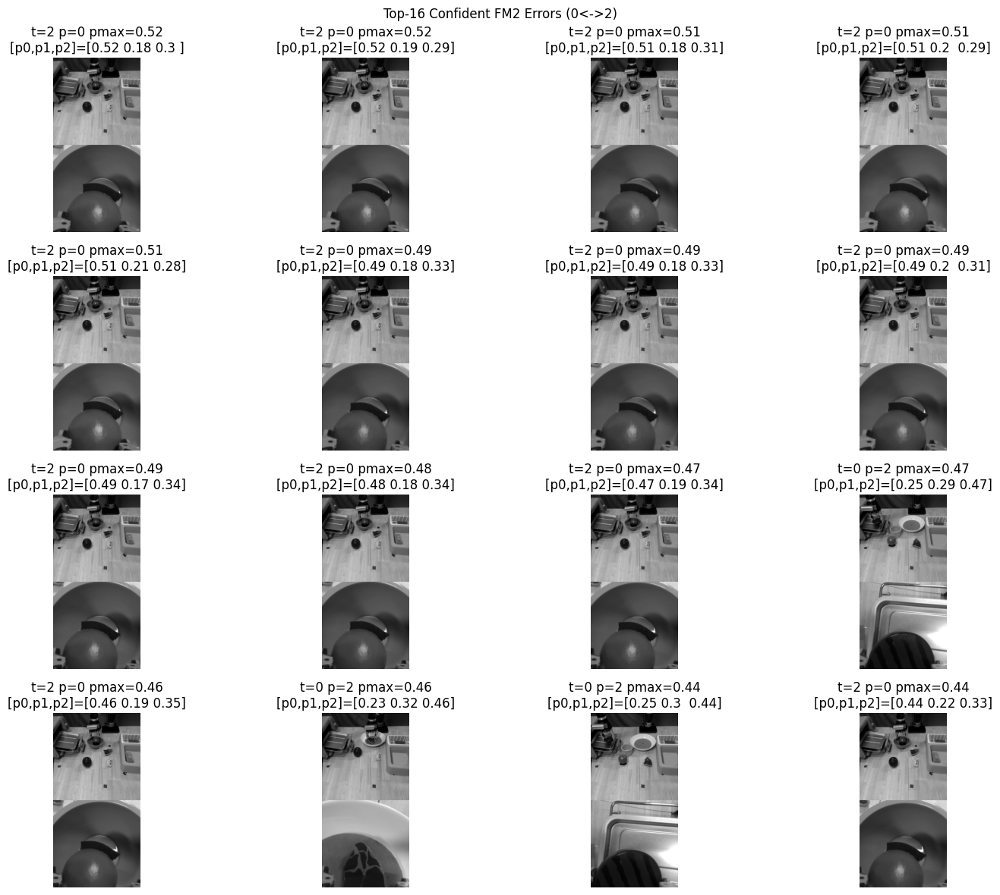

[FM2][Calib 0vs2] ECE=0.0722 (on subset true in {0,2})


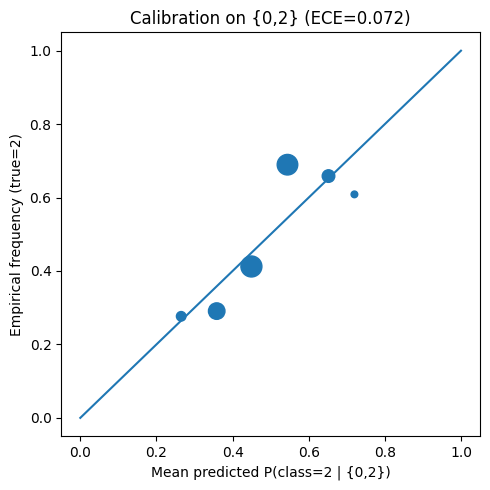

[FM2][Embedding] skip feature separability (no hook or empty cache).
[Saved] ./results/q1bii/fm2_evidence_pack/fm2_summary.json
[FM2] Done. 


In [19]:
# ============================================================
# FM2 Evidence Pack (One-cell, heavy, robust)  [UPDATED: prettier & stronger plots]
# FM2: confusion between class 0 and class 2 (true0->pred2 OR true2->pred0)
#
# Note
# Note
# Note
# Note
# Note
# Note
# Note
#
# Note
# Note
# Note
# ============================================================

import os, json, math, warnings
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

# -----------------------
# Note
# -----------------------
out_dir = globals().get("out_dir", "./results/q1bii/fm2_evidence_pack")
os.makedirs(out_dir, exist_ok=True)

MAX_BATCHES = None   # None=全量val；想加速可设成比如 200
TOPK_SHOW  = 16      # 可视化Top-K“自信FM2错误”样本数（网格图）
SEED = 7
np.random.seed(SEED)
torch.manual_seed(SEED)

device = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------
# Note
# -----------------------
def _first_existing(paths):
    for p in paths:
        if p and isinstance(p, str) and os.path.exists(p):
            return p
    return None

cand_ckpts = []
for k in ["ckpt_path", "best_ckpt_path", "best_model_path", "model_ckpt", "CKPT_PATH"]:
    if k in globals():
        cand_ckpts.append(globals()[k])

cand_ckpts += [
    "./models/mdl_chkpnt_epoch_3.pt",
]
ckpt_path = _first_existing(cand_ckpts)

if ckpt_path is None:
    raise FileNotFoundError(
        "找不到 ckpt_path。请你在本单元格最上面手动设置 ckpt_path=... "
        "例如 ckpt_path='./models/mdl_chkpnt_epoch_4.pt'"
    )

print(f"[FM2] device={device} | ckpt_path={ckpt_path}")
model = model.to(device)
model.eval()

# -----------------------
# Note
# -----------------------
def fm2_load_ckpt_into_model(model, ckpt_path, device):  # <-- rename to avoid polluting other cells
    ckpt = torch.load(ckpt_path, map_location=device)
    state_dict = ckpt["model_state_dict"] if isinstance(ckpt, dict) and "model_state_dict" in ckpt else ckpt
    if any(k.startswith("module.") for k in state_dict.keys()):
        state_dict = {k.replace("module.", "", 1): v for k, v in state_dict.items()}
    model.load_state_dict(state_dict, strict=False)
    return ckpt

_ = fm2_load_ckpt_into_model(model, ckpt_path, device)  # <-- updated call

# -----------------------
# Note
# -----------------------
def get_field(obj, key, default=None):
    if obj is None:
        return default
    if isinstance(obj, dict):
        return obj.get(key, default)
    return getattr(obj, key, default)

def ensure_class_index(y):
    if torch.is_tensor(y):
        if y.ndim == 2 and y.shape[-1] == 3:
            y = torch.argmax(y, dim=1)
        if y.ndim != 1:
            y = y.view(-1)
        if y.dtype not in (torch.int64, torch.int32, torch.int16, torch.int8):
            y = y.long()
    return y

def entropy_from_prob(p, eps=1e-12):
    p = np.clip(p, eps, 1.0)
    return (-p * np.log(p)).sum(axis=1)

# -----------------------
# Note
# -----------------------
def forward_grp_logits(m, images, obs):
    try:
        out = m(images=images, obs=obs) if obs is not None else m(images=images)
    except TypeError:
        out = m(images, obs) if obs is not None else m(images)

    if torch.is_tensor(out):
        return out

    if isinstance(out, dict):
        for k in ["grp", "grp_logits", "logits_grp", "logits", "cls"]:
            if k in out and torch.is_tensor(out[k]):
                return out[k]
        tensors = [v for v in out.values() if torch.is_tensor(v)]
        if len(tensors) == 1:
            return tensors[0]

    for attr in ["output", "pred", "logits", "grp", "grp_logits", "logits_grp"]:
        v = getattr(out, attr, None)
        if torch.is_tensor(v):
            return v
        if isinstance(v, dict):
            for k in ["grp", "grp_logits", "logits_grp", "logits", "cls"]:
                if k in v and torch.is_tensor(v[k]):
                    return v[k]

    raise RuntimeError("无法从 model forward 输出里解析 grp logits（期望 [B,3]）。")

# -----------------------
# Note
# -----------------------
feat_cache = []
hook_handle = None
hook_name = None

def try_register_penultimate_hook(m):
    global hook_handle, hook_name
    last_linear = None
    last_name = None
    for name, mod in m.named_modules():
        if isinstance(mod, torch.nn.Linear) and getattr(mod, "out_features", None) == 3:
            last_linear = mod
            last_name = name
    if last_linear is None:
        return False

    def hook_fn(module, inp, out):
        x = inp[0]
        if torch.is_tensor(x):
            feat_cache.append(x.detach().float().cpu())
    hook_handle = last_linear.register_forward_hook(hook_fn)
    hook_name = last_name
    return True

hook_ok = try_register_penultimate_hook(model)
if hook_ok:
    print(f"[FM2][Embedding] hook at penultimate input of Linear(out=3): {hook_name}")
else:
    print("[FM2][Embedding] could not find Linear(out_features=3), skip embedding evidence.")

# -----------------------
# 6) Inference loop
# -----------------------
model_dtype = next(model.parameters()).dtype
print(f"[FM2] model dtype={model_dtype}")

all_rows = []
cache_conf_fm2 = []  # (img_cpu, true, pred, prob_vec)

global_i = 0
with torch.no_grad():
    for b_i, batch in enumerate(val_dataloader):
        if MAX_BATCHES is not None and b_i >= MAX_BATCHES:
            break

        x_in  = batch.input
        y_out = batch.output

        x_img = get_field(x_in, "images")
        x_obs = get_field(x_in, "obs", None)
        y_true = get_field(y_out, "grp")

        if x_img is None or y_true is None:
            raise RuntimeError("Batch missing images or grp labels. Check batch.input/batch.output keys.")

        x_img = x_img.to(device, dtype=model_dtype)
        if x_obs is not None:
            x_obs = x_obs.to(device, dtype=model_dtype)

        y_true = ensure_class_index(y_true).to(device)

        logits = forward_grp_logits(model, x_img, x_obs)  # [B,3]
        if logits.ndim == 1:
            logits = logits.view(-1, 3)
        prob = torch.softmax(logits.float(), dim=1)

        pred = torch.argmax(prob, dim=1)

        fm2_mask_t = ((y_true == 0) & (pred == 2)) | ((y_true == 2) & (pred == 0))
        ok_02_mask_t = ((y_true == 0) & (pred == 0)) | ((y_true == 2) & (pred == 2))

        # top2 gap
        top2 = torch.topk(prob, k=2, dim=1).values
        top2_gap = (top2[:,0] - top2[:,1]).float()

# Note
        pmax = torch.max(prob, dim=1).values
        if fm2_mask_t.any():
            idxs = fm2_mask_t.nonzero(as_tuple=False).squeeze(1)
            conf_order = torch.argsort(pmax[idxs], descending=True)
            for j in idxs[conf_order].tolist():
                if len(cache_conf_fm2) >= max(4*TOPK_SHOW, 64):
                    break
                cache_conf_fm2.append((
                    x_img[j].detach().cpu(),
                    int(y_true[j].item()),
                    int(pred[j].item()),
                    prob[j].detach().cpu().numpy()
                ))

# Note
        B = x_img.shape[0]
        for i in range(B):
            all_rows.append({
                "idx": global_i + i,
                "true": int(y_true[i].item()),
                "pred": int(pred[i].item()),
                "p0": float(prob[i,0].item()),
                "p1": float(prob[i,1].item()),
                "p2": float(prob[i,2].item()),
                "pmax": float(pmax[i].item()),
                "top2_gap": float(top2_gap[i].item()),
                "is_fm2": bool(fm2_mask_t[i].item()),
                "is_ok02": bool(ok_02_mask_t[i].item()),
            })
        global_i += B

if hook_handle is not None:
    hook_handle.remove()

df = pd.DataFrame(all_rows)
csv_path = os.path.join(out_dir, "fm2_all_predictions.csv")
df.to_csv(csv_path, index=False)
print(f"[Saved] {csv_path} | N={len(df)}")

# -----------------------
# Note
# -----------------------
def confusion_counts(y_t, y_p, labels=(0,1,2)):
    lab2i = {lab:i for i,lab in enumerate(labels)}
    cm = np.zeros((len(labels), len(labels)), dtype=int)
    for a,b in zip(y_t, y_p):
        if a in lab2i and b in lab2i:
            cm[lab2i[a], lab2i[b]] += 1
    return cm

def plot_cm(cm, labels, title, save_path):
    cm = np.array(cm)
    plt.figure(figsize=(5,4))
    plt.imshow(cm)
    plt.title(title)
    plt.xticks(range(len(labels)), labels)
    plt.yticks(range(len(labels)), labels)
    for i in range(len(labels)):
        for j in range(len(labels)):
            plt.text(j, i, str(cm[i,j]), ha="center", va="center")
    plt.xlabel("Pred")
    plt.ylabel("True")
    plt.tight_layout()
    plt.savefig(save_path, dpi=200)
    plt.show()

y_true_all = df["true"].values
y_pred_all = df["pred"].values

cm_all = confusion_counts(y_true_all, y_pred_all, labels=(0,1,2))
plot_cm(cm_all, [0,1,2], "Overall Confusion Matrix (val)", os.path.join(out_dir, "cm_overall.png"))

mask_02 = np.isin(y_true_all, [0,2])
cm_02 = confusion_counts(y_true_all[mask_02], y_pred_all[mask_02], labels=(0,2))
plot_cm(cm_02, [0,2], "Sub-Confusion Matrix on {0,2}", os.path.join(out_dir, "cm_02.png"))

fm2_cnt = int((((df.true==0) & (df.pred==2)) | ((df.true==2) & (df.pred==0))).sum())
fm2_pct = fm2_cnt / len(df) * 100.0
print(f"[FM2] count={fm2_cnt} | pct_of_all={fm2_pct:.2f}%")

# -----------------------
# Note
# -----------------------
fm2_mask = df["is_fm2"].values
ok02_mask = df["is_ok02"].values

fm2 = df[df["is_fm2"]==True].copy()
ok02 = df[df["is_ok02"]==True].copy()

# Plot A: p0 vs p2 scatter
if len(fm2) > 0 and len(ok02) > 0:
    plt.figure(figsize=(5,5))
    plt.plot([0,1],[0,1])
    plt.scatter(ok02["p0"], ok02["p2"], alpha=0.35, label="Correct on {0,2}")
    plt.scatter(fm2["p0"], fm2["p2"], alpha=0.90, label="FM2 (0<->2)")
    plt.xlabel("p0"); plt.ylabel("p2")
    plt.title("p0 vs p2 (FM2 near diagonal => ambiguity)")
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, "p0_vs_p2_scatter.png"), dpi=200)
    plt.show()

# Plot B: signed margin m = p0 - p2
df["m_prob_02"] = df["p0"] - df["p2"]

plt.figure(figsize=(6,4))
m0 = df[df["true"]==0]["m_prob_02"].values
m2 = df[df["true"]==2]["m_prob_02"].values
plt.hist(m0, bins=40, alpha=0.6, label="true=0 (want m>0)")
plt.hist(m2, bins=40, alpha=0.6, label="true=2 (want m<0)")
plt.axvline(0.0)
plt.xlabel("m = p0 - p2 (signed)")
plt.title("Signed margin for classes {0,2}")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(out_dir, "signed_margin_prob_02.png"), dpi=200)
plt.show()

# -----------------------
# Note
# -----------------------
if "entropy" not in df.columns:
    prob_mat = df[["p0","p1","p2"]].values
    df["entropy"] = entropy_from_prob(prob_mat)

df.to_csv(csv_path, index=False)

def boxplot_two(a, b, title, ylabel, save):
    plt.figure(figsize=(5,4))
    plt.boxplot([a, b], labels=["FM2", "Correct(0/2)"], showfliers=False)
    plt.title(title)
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.savefig(save, dpi=200)
    plt.show()

if fm2_mask.sum() >= 5 and ok02_mask.sum() >= 5:
    boxplot_two(df.loc[fm2_mask, "top2_gap"].values, df.loc[ok02_mask, "top2_gap"].values,
                "Top2 gap (lower => more uncertain)", "top2_gap",
                os.path.join(out_dir, "box_top2_gap.png"))

    boxplot_two(df.loc[fm2_mask, "entropy"].values, df.loc[ok02_mask, "entropy"].values,
                "Entropy (higher => more uncertain)", "entropy",
                os.path.join(out_dir, "box_entropy.png"))

try:
    from scipy.stats import mannwhitneyu
    if fm2_mask.sum() >= 10 and ok02_mask.sum() >= 10:
        for col in ["top2_gap", "entropy"]:
            a = df.loc[fm2_mask, col].values
            b = df.loc[ok02_mask, col].values
            stat, p = mannwhitneyu(a, b, alternative="two-sided")
            print(f"[MWU] {col}: U={stat:.1f}, p={p:.3e} (FM2 vs Correct0/2)")

        a = np.abs(df.loc[fm2_mask, "m_prob_02"].values)
        b = np.abs(df.loc[ok02_mask, "m_prob_02"].values)
        stat, p = mannwhitneyu(a, b, alternative="two-sided")
        print(f"[MWU] abs(m_prob_02): U={stat:.1f}, p={p:.3e} (FM2 vs Correct0/2)")
except Exception as e:
    print("[Warn] scipy not available, skip Mann-Whitney U test:", str(e))

# -----------------------
# Note
# -----------------------
CONF_THR = 0.80
conf_fm2 = df.loc[fm2_mask & (df.pmax >= CONF_THR)]
print(f"[FM2] confident-wrong (pmax>={CONF_THR}): {len(conf_fm2)} / {fm2_mask.sum()} = {len(conf_fm2)/max(1,fm2_mask.sum()):.2%}")

def show_fm2_grid(cache_list, topk, save_path, title):
    if len(cache_list) == 0:
        print("[FM2] no cached FM2 examples to show.")
        return
    cache_list = sorted(cache_list, key=lambda x: float(np.max(x[3])), reverse=True)[:topk]
    n = len(cache_list)
    cols = 4
    rows = math.ceil(n / cols)
    plt.figure(figsize=(cols*4, rows*3))
    for i,(img, yt, yp, pv) in enumerate(cache_list):
        img2 = img.squeeze(0) if img.ndim == 4 else img
        front = img2[0]; mount = img2[1]
        both = torch.cat([front, mount], dim=0)  # [2H,W]
        ax = plt.subplot(rows, cols, i+1)
        ax.imshow(both.numpy(), cmap="gray")
        ax.set_title(f"t={yt} p={yp} pmax={np.max(pv):.2f}\n[p0,p1,p2]={pv.round(2)}")
        ax.axis("off")
    plt.suptitle(title)
    plt.tight_layout()
    plt.savefig(save_path, dpi=200)
    plt.show()

show_fm2_grid(cache_conf_fm2, TOPK_SHOW, os.path.join(out_dir, "fm2_confident_examples.png"),
              f"Top-{TOPK_SHOW} Confident FM2 Errors (0<->2)")

# -----------------------
# Note
# -----------------------
mask02 = np.isin(df["true"].values, [0,2])
if mask02.sum() >= 50:
    p0 = df.loc[mask02, "p0"].values
    p2 = df.loc[mask02, "p2"].values
    score = p2 / np.clip((p0+p2), 1e-12, None)         # P(class=2 | {0,2})
    y_bin = (df.loc[mask02, "true"].values == 2).astype(int)

    n_bins = 10
    bins = np.linspace(0, 1, n_bins+1)
    bin_ids = np.digitize(score, bins) - 1
    bin_ids = np.clip(bin_ids, 0, n_bins-1)

    accs, confs, counts = [], [], []
    ece = 0.0
    for b in range(n_bins):
        m = bin_ids == b
        if m.sum() == 0:
            accs.append(np.nan); confs.append(np.nan); counts.append(0)
            continue
        acc = y_bin[m].mean()
        conf = score[m].mean()
        accs.append(acc); confs.append(conf); counts.append(int(m.sum()))
        ece += (m.sum()/len(score)) * abs(acc-conf)

    print(f"[FM2][Calib 0vs2] ECE={ece:.4f} (on subset true in {{0,2}})")

    plt.figure(figsize=(5,5))
    xs = np.array(confs); ys = np.array(accs)
    ok = ~np.isnan(xs) & ~np.isnan(ys)
    plt.plot([0,1],[0,1])
    plt.scatter(xs[ok], ys[ok], s=np.array(counts)[ok])
    plt.title(f"Calibration on {{0,2}} (ECE={ece:.3f})")
    plt.xlabel("Mean predicted P(class=2 | {0,2})")
    plt.ylabel("Empirical frequency (true=2)")
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, "calibration_0vs2.png"), dpi=200)
    plt.show()

# -----------------------
# Note
# -----------------------
if hook_ok and len(feat_cache) > 0:
    feats = torch.cat(feat_cache, dim=0).numpy()  # [N,D]
    y = df["true"].values[:feats.shape[0]]
    m02 = np.isin(y, [0,2])
    feats02 = feats[m02]
    y02 = y[m02]

    feats02 = feats02 - feats02.mean(axis=0, keepdims=True)
    U,S,Vt = np.linalg.svd(feats02, full_matrices=False)
    pc2 = U[:, :2] * S[:2]

    plt.figure(figsize=(6,5))
    plt.scatter(pc2[y02==0,0], pc2[y02==0,1], alpha=0.6, label="true=0")
    plt.scatter(pc2[y02==2,0], pc2[y02==2,1], alpha=0.6, label="true=2")
    plt.title("PCA2D of Penultimate Features (true in {0,2})")
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, "pca_features_02.png"), dpi=200)
    plt.show()

    try:
        from sklearn.metrics import silhouette_score
        sil = silhouette_score(pc2, (y02==2).astype(int))
        print(f"[FM2][Embedding] silhouette (PCA2D, 0vs2) = {sil:.4f} (higher=>more separable)")
    except Exception as e:
        print("[Warn] sklearn not available, skip silhouette:", str(e))
else:
    print("[FM2][Embedding] skip feature separability (no hook or empty cache).")

# -----------------------
# Note
# -----------------------
summary = {
    "ckpt_path": ckpt_path,
    "N_val": int(len(df)),
    "FM2_count": int(fm2_cnt),
    "FM2_pct_of_all": float(fm2_pct),
    "confident_wrong_thr": float(CONF_THR),
    "confident_FM2_count": int(len(conf_fm2)),
    "confident_FM2_pct_of_FM2": float(len(conf_fm2)/max(1, fm2_mask.sum())),
    "cm_overall": cm_all.tolist(),
    "cm_02": cm_02.tolist(),
}
with open(os.path.join(out_dir, "fm2_summary.json"), "w", encoding="utf-8") as f:
    json.dump(summary, f, indent=2, ensure_ascii=False)

print(f"[Saved] {os.path.join(out_dir, 'fm2_summary.json')}")
print("[FM2] Done. ")

[Load] Using CSV: ./results/q1bii/failure_analysis_epoch3/all_val_predictions.csv
[Info] df shape: (2901, 16)
[Info] columns: ['idx', 'true_grp', 'pred_grp', 'pred_conf', 'prob_c0', 'prob_c1', 'prob_c2', 'pos_err_norm', 'pos_mae_vec', 'true_pos_norm', 'front_brightness', 'front_contrast', 'front_sharpness', 'mount_brightness', 'mount_contrast', 'mount_sharpness']

================ FM3 SUMMARY ================
FM3 definition: pos_err_norm >= q(0.950) threshold
FM3 threshold: thr=0.275259
FM3 count: 146/2901 = 5.03%



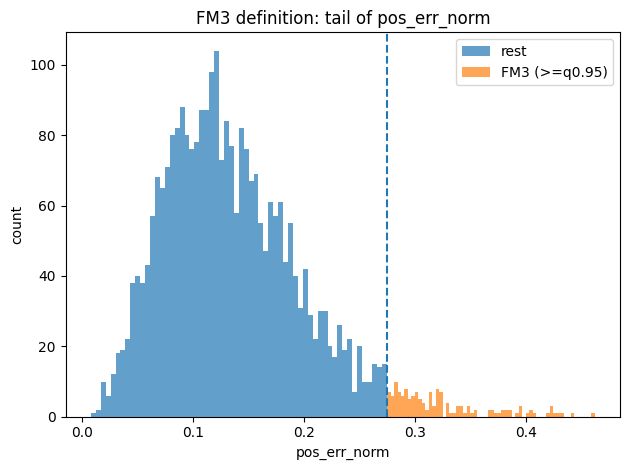

[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/fm3_pos_err_norm_tail_definition.png


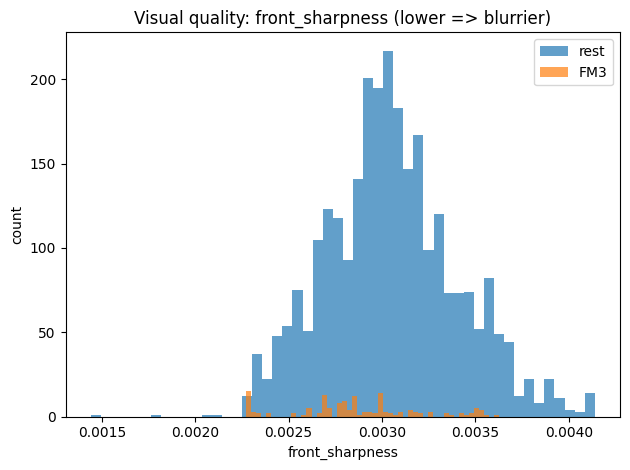

[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/claimA_hist_FM3_vs_rest_front_sharpness.png


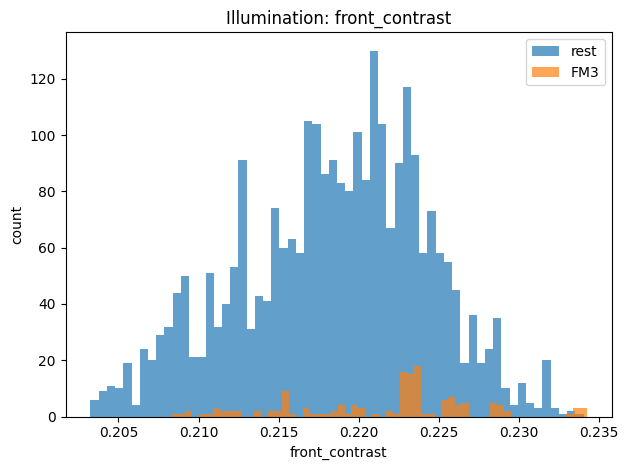

[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/claimA_hist_FM3_vs_rest_front_contrast.png


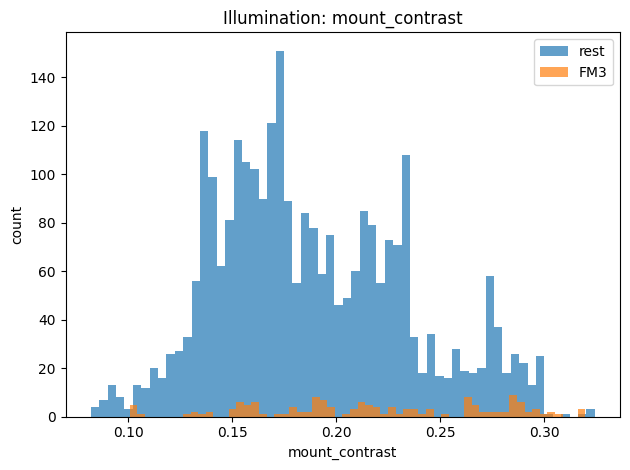

[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/claimA_hist_FM3_vs_rest_mount_contrast.png


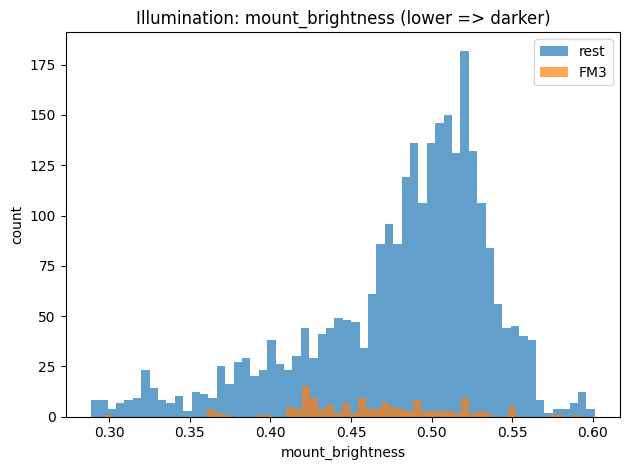

[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/claimA_hist_FM3_vs_rest_mount_brightness.png

[Claim A] numeric shift evidence table:


,feature,fm3_n,rest_n,fm3_mean,rest_mean,fm3_median,rest_median,delta_mean(fm3-rest),cliffs_delta,mwu_p,ks_p
0,front_sharpness,146,2755,0.002865,0.003048,0.002845,0.003028,-0.000183,-0.292206,2.546155e-09,7.804042e-10
1,front_contrast,146,2755,0.221749,0.218439,0.223078,0.218931,0.003309,0.325175,3.339903e-11,1.268165e-16
2,mount_contrast,146,2755,0.218061,0.188643,0.214301,0.179557,0.029419,0.316302,1.119879e-10,2.082545e-09
3,mount_brightness,146,2755,0.463015,0.481048,0.458362,0.494759,-0.018033,-0.262337,8.824458e-08,8.172260e-10


[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/claimA_visual_shift_stats.csv

[Claim B] prevalence by true_grp:


,true_grp,total,fm3_count,fm3_rate
0,0,373,51,0.136729
1,1,2161,79,0.036557
2,2,367,16,0.043597


[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/claimB_prevalence_by_true_grp.csv


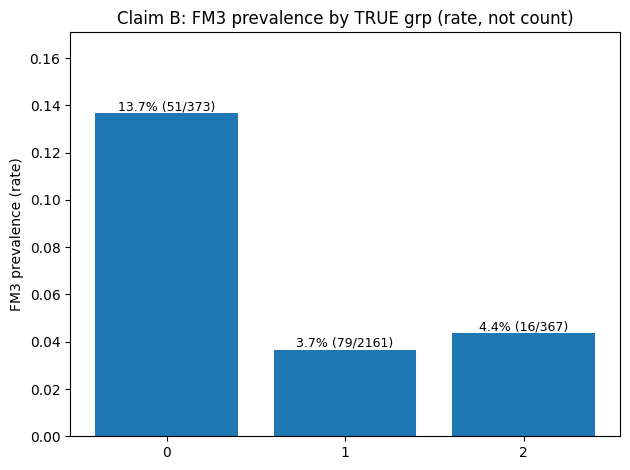

[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/claimB_prevalence_by_true_grp.png

[Claim B] prevalence by pred_grp:


,pred_grp,total,fm3_count,fm3_rate
0,0,128,23,0.179688
1,1,2685,106,0.039479
2,2,88,17,0.193182


[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/claimB_prevalence_by_pred_grp.csv


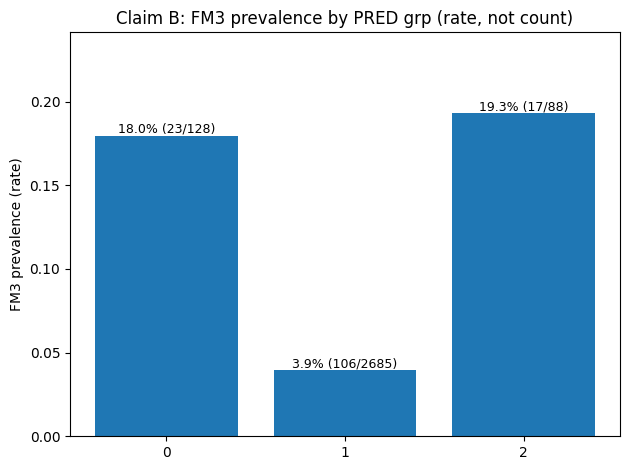

[Saved] ./results/q1c/fm3_evidence_pack_v2_two_claims/claimB_prevalence_by_pred_grp.png

[Done] FM3 evidence pack (two claims) saved to: ./results/q1c/fm3_evidence_pack_v2_two_claims


In [20]:
# ============================================================
# FM3 Evidence Pack (supports ONLY 2 claims, with strong visuals)
# Claim A) Visual quality / illumination shift:
#   - front_sharpness MUST
#   - optionally: front_contrast, mount_contrast, mount_brightness (if columns exist)
#   - plus numeric shift evidence table (Cliff's delta + MWU/KS + mean/median)
#
# Claim B) FM3 is state-conditional:
#   - prevalence by true_grp (RATE, not raw count)
#   - prevalence by pred_grp (RATE, not raw count)
#   - annotate bars with rate and (fm3/total)
#   - export group summary tables for report
# ============================================================

import os, glob, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
warnings.filterwarnings("ignore")

# ----------------------------
# 0) Load df (from res or CSV)
# ----------------------------
df = None
if "res" in globals() and isinstance(res, dict) and "df" in res:
    df = res["df"].copy()
elif "df" in globals() and isinstance(df, pd.DataFrame):
    df = df.copy()
else:
    cand = sorted(
        glob.glob("./results/**/all_val_predictions.csv", recursive=True),
        key=lambda p: os.path.getmtime(p)
    )
    if len(cand) == 0:
        raise FileNotFoundError("找不到 all_val_predictions.csv。请先跑 systematic failure analysis，或把 CSV 路径改成你自己的。")
    pred_csv = cand[-1]
    print("[Load] Using CSV:", pred_csv)
    df = pd.read_csv(pred_csv)

print("[Info] df shape:", df.shape)
print("[Info] columns:", list(df.columns))

# ----------------------------
# 1) Define FM3 (tail of pos_err_norm)
# ----------------------------
out_dir = "./results/q1c/fm3_evidence_pack_v2_two_claims"
os.makedirs(out_dir, exist_ok=True)

quantile_tail = 0.95
assert "pos_err_norm" in df.columns, "df里没有 pos_err_norm，确认 failure analysis 输出包含该列。"

thr = float(pd.Series(df["pos_err_norm"]).quantile(quantile_tail))
fm3_mask  = (df["pos_err_norm"] >= thr).fillna(False)
rest_mask = ~fm3_mask
df["is_fm3"] = fm3_mask

N = len(df)
fm3_n = int(fm3_mask.sum())
print("\n================ FM3 SUMMARY ================")
print(f"FM3 definition: pos_err_norm >= q({quantile_tail:.3f}) threshold")
print(f"FM3 threshold: thr={thr:.6f}")
print(f"FM3 count: {fm3_n}/{N} = {fm3_n/max(N,1)*100:.2f}%")
print("=============================================\n")

with open(os.path.join(out_dir, "fm3_summary.txt"), "w", encoding="utf-8") as f:
    f.write(f"quantile_tail={quantile_tail}\n")
    f.write(f"thr={thr}\n")
    f.write(f"fm3_n={fm3_n}\n")
    f.write(f"N={N}\n")
    f.write(f"fm3_rate={fm3_n/max(N,1)}\n")

# ----------------------------
# 2) Helpers
# ----------------------------
def show_and_save(name):
    path = os.path.join(out_dir, name)
    plt.tight_layout()
    plt.savefig(path, dpi=180)
    plt.show()
    plt.close()
    print("[Saved]", path)

def _safe_np(x):
    return pd.Series(x).dropna().to_numpy(dtype=np.float64)

def try_mwu_ks(a, b):
    out = {"mwu_p": None, "ks_p": None}
    try:
        from scipy.stats import mannwhitneyu, ks_2samp
        a = _safe_np(a); b = _safe_np(b)
        if len(a) > 0 and len(b) > 0:
            out["mwu_p"] = float(mannwhitneyu(a, b, alternative="two-sided").pvalue)
            out["ks_p"]  = float(ks_2samp(a, b).pvalue)
    except Exception:
        pass
    return out

def cliffs_delta(a, b):
    a = _safe_np(a); b = _safe_np(b)
    if len(a)==0 or len(b)==0:
        return np.nan
    n, m = len(a), len(b)
    if n*m > 3_000_000:
        rng = np.random.default_rng(0)
        a = rng.choice(a, size=min(n, 2000), replace=False)
        b = rng.choice(b, size=min(m, 2000), replace=False)
    gt = (a[:, None] > b[None, :]).sum()
    lt = (a[:, None] < b[None, :]).sum()
    return (gt - lt) / (a.size * b.size)

def numeric_shift_table(feature):
    """Return one-row dict with mean/median + effect size + MWU/KS (FM3 vs rest)."""
    a = df.loc[fm3_mask, feature]
    b = df.loc[rest_mask, feature]
    stats = {
        "feature": feature,
        "fm3_n": int(pd.Series(a).notna().sum()),
        "rest_n": int(pd.Series(b).notna().sum()),
        "fm3_mean": float(pd.Series(a).mean()),
        "rest_mean": float(pd.Series(b).mean()),
        "fm3_median": float(pd.Series(a).median()),
        "rest_median": float(pd.Series(b).median()),
        "delta_mean(fm3-rest)": float(pd.Series(a).mean() - pd.Series(b).mean()),
        "cliffs_delta": float(cliffs_delta(a, b)),
    }
    stats.update(try_mwu_ks(a, b))
    return stats

def plot_hist_compare(feature, bins=50, title=None, xlabel=None, filename=None):
    plt.figure()
    plt.hist(df.loc[rest_mask, feature].dropna(), bins=bins, alpha=0.7, label="rest")
    plt.hist(df.loc[fm3_mask,  feature].dropna(), bins=bins, alpha=0.7, label="FM3")
    plt.xlabel(xlabel or feature); plt.ylabel("count")
    plt.legend()
    plt.title(title or f"FM3 vs rest: {feature}")
    show_and_save(filename or f"fm3_hist_compare_{feature}.png")

# ============================================================
# Evidence 0: FM3 definition visualization (tail)
# ============================================================
plt.figure()
plt.hist(df.loc[rest_mask, "pos_err_norm"].dropna(), bins=60, alpha=0.7, label="rest")
plt.hist(df.loc[fm3_mask,  "pos_err_norm"].dropna(), bins=60, alpha=0.7, label=f"FM3 (>=q{quantile_tail:.2f})")
plt.axvline(thr, linestyle="--")
plt.xlabel("pos_err_norm"); plt.ylabel("count")
plt.legend()
plt.title("FM3 definition: tail of pos_err_norm")
show_and_save("fm3_pos_err_norm_tail_definition.png")

# ============================================================
# Claim A: Visual quality / illumination shift
#   MUST: front_sharpness
#   OPTIONAL (if exists): front_contrast, mount_contrast, mount_brightness
#   Output: plots + one CSV table summarizing shift stats
# ============================================================

# --- feature candidates (auto-detect only those present) ---
cand_features = [
    ("front_sharpness", 50, "Visual quality: front_sharpness (lower => blurrier)"),
    ("front_contrast",  60, "Illumination: front_contrast"),
    ("mount_contrast",  60, "Illumination: mount_contrast"),
    ("mount_brightness",60, "Illumination: mount_brightness (lower => darker)"),
]
present = [(f,b,t) for (f,b,t) in cand_features if f in df.columns]

if len(present) == 0:
    print("[Warn] None of the visual/illumination features exist in df. Available cols:", list(df.columns))
else:
    shift_rows = []
    for (feat, bins, title) in present:
        plot_hist_compare(
            feat,
            bins=bins,
            title=title,
            xlabel=feat,
            filename=f"claimA_hist_FM3_vs_rest_{feat}.png"
        )
        shift_rows.append(numeric_shift_table(feat))

    shift_df = pd.DataFrame(shift_rows)
    shift_csv = os.path.join(out_dir, "claimA_visual_shift_stats.csv")
    shift_df.to_csv(shift_csv, index=False)
    print("\n[Claim A] numeric shift evidence table:")
    display(shift_df)
    print("[Saved]", shift_csv)

# ============================================================
# Claim B: FM3 is state-conditional (prevalence by grp)
#   - prevalence = P(FM3 | grp = k) = fm3_count / total_in_grp
#   - bar annotated with rate and (fm3/total)
#   - export tables
# ============================================================

def prevalence_table(colname):
    if colname not in df.columns:
        return None
    tmp = df[[colname, "is_fm3"]].dropna(subset=[colname]).copy()
    # ensure int-ish grouping if possible
    try:
        tmp[colname] = tmp[colname].astype(int)
    except Exception:
        pass

    g = tmp.groupby(colname)["is_fm3"]
    total = g.size().rename("total")
    fm3c  = g.sum().rename("fm3_count")
    rate  = (fm3c / total).rename("fm3_rate")
    out = pd.concat([total, fm3c, rate], axis=1).reset_index()

    # sort by grp if numeric
    try:
        out = out.sort_values(colname).reset_index(drop=True)
    except Exception:
        pass
    return out

def plot_prevalence_bar(tbl, colname, title, filename):
    # x labels
    x = tbl[colname].astype(str).tolist()
    y = tbl["fm3_rate"].to_numpy()

    plt.figure()
    bars = plt.bar(range(len(x)), y)
    plt.xticks(range(len(x)), x)
    plt.ylim(0, max(0.001, float(y.max())*1.25))
    plt.ylabel("FM3 prevalence (rate)")
    plt.title(title)

    # annotate: "xx.x% (fm3/total)"
    for i, b in enumerate(bars):
        rate = tbl.loc[i, "fm3_rate"]
        fm3c = int(tbl.loc[i, "fm3_count"])
        tot  = int(tbl.loc[i, "total"])
        txt = f"{rate*100:.1f}% ({fm3c}/{tot})"
        plt.text(b.get_x() + b.get_width()/2, b.get_height(), txt, ha="center", va="bottom", fontsize=9)

    show_and_save(filename)

# --- true_grp prevalence ---
true_tbl = prevalence_table("true_grp")
if true_tbl is not None:
    true_csv = os.path.join(out_dir, "claimB_prevalence_by_true_grp.csv")
    true_tbl.to_csv(true_csv, index=False)
    print("\n[Claim B] prevalence by true_grp:")
    display(true_tbl)
    print("[Saved]", true_csv)

    plot_prevalence_bar(
        true_tbl,
        "true_grp",
        title="Claim B: FM3 prevalence by TRUE grp (rate, not count)",
        filename="claimB_prevalence_by_true_grp.png"
    )
else:
    print("[Skip] true_grp not in df columns")

# --- pred_grp prevalence ---
pred_tbl = prevalence_table("pred_grp")
if pred_tbl is not None:
    pred_csv = os.path.join(out_dir, "claimB_prevalence_by_pred_grp.csv")
    pred_tbl.to_csv(pred_csv, index=False)
    print("\n[Claim B] prevalence by pred_grp:")
    display(pred_tbl)
    print("[Saved]", pred_csv)

    plot_prevalence_bar(
        pred_tbl,
        "pred_grp",
        title="Claim B: FM3 prevalence by PRED grp (rate, not count)",
        filename="claimB_prevalence_by_pred_grp.png"
    )
else:
    print("[Skip] pred_grp not in df columns")

print("\n[Done] FM3 evidence pack (two claims) saved to:", out_dir)

=== Gripper class counts === {0: 3061, 1: 19147, 2: 3261}
=== Gripper class freq === {0: 0.12018532333424949, 1: 0.7517766696768621, 2: 0.12803800698888845}
=== Class weights === {0: 1.266525610925444, 1: 0.5064018369740593, 2: 1.2270725520991794}
cnn out dim: 7.0 cnn out ch: 256 mlp in: 12544


100%|██████████| 398/398 [00:39<00:00,  9.98it/s]


epoch_train_loss,█▆▄▃▂▂▁▁▁▁
epoch_val_loss,▁▂▂▄▅▅███▆
grp_train_loss,█▇▇▇▄▄▆▄▄▄▃▃▃▃▃▂▂▂▃▁▂▁▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▂
grp_val_loss,▂▂▂▂▂▁▁▂▃▁▂▂▂▄▂▁▂▁▂▃▂▁▂▁▃█▅▃▆▅▂▁▃▄▁▄▄▂▁▃
pos_train_loss,█▄▆▂▄▄▅▃▂▄▄▃▄▅▂▅▂▄▇▆▁▄▁▂▂▂▃▁▃▂▃▂▁▂▂▂▁▃▂▂
pos_val_loss,▃▃▅▃▂▂▃▂▃▁▃▁▃█▂▁▂▃▃▁▄▃▃▄▄▂▃▂▄▃▂▄▄▃▄▄▂▂▃▂
epoch_train_loss,0.07819
epoch_val_loss,1.25781
grp_train_loss,0.03005
grp_val_loss,0.06536
pos_train_loss,0.00488


[Eval] ckpt_path = /workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/Final_enhanced/final.pt
cnn out dim: 7.0 cnn out ch: 256 mlp in: 12544
[Debug] eval model conv0: torch.Size([16, 2, 3, 3])
[Info] Evaluating checkpoint: /workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/Final_enhanced/final.pt
[Info] Device=cuda, model dtype=torch.float32, use_fp16=False


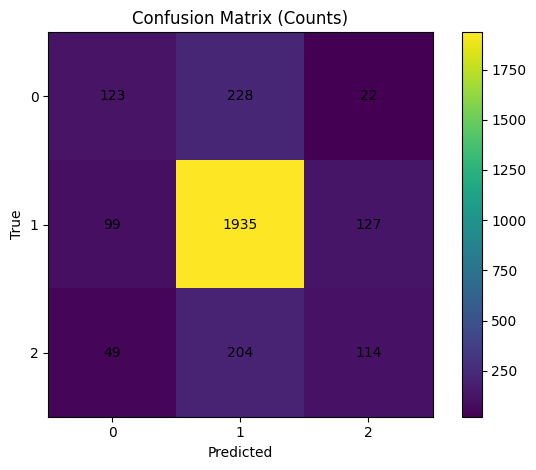

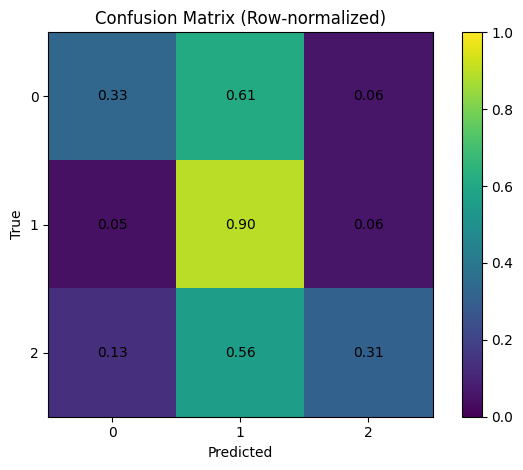

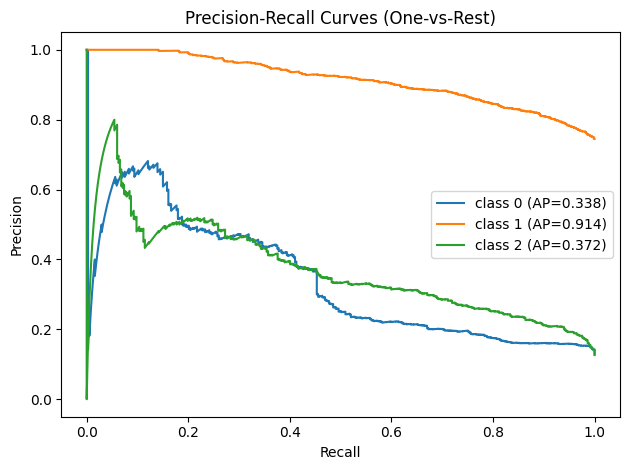

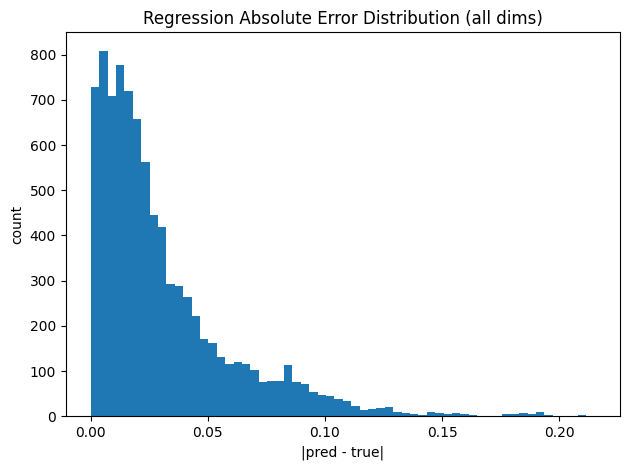

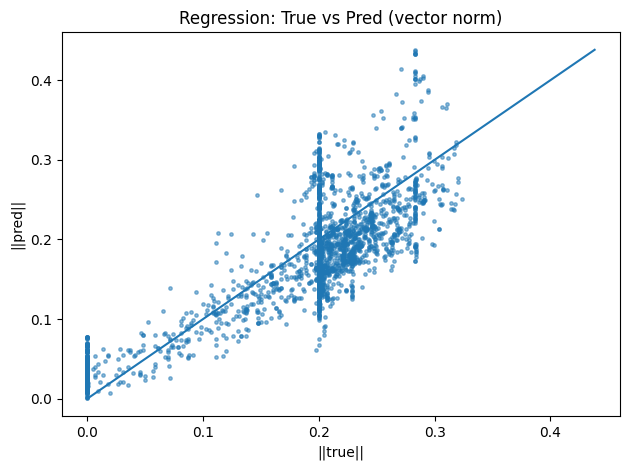


===== Regression (pos) =====
MAE_all:  0.030732
RMSE_all: 0.042680
CosSim:   0.729835
SignAgr:  0.456279

===== Classification (grp) =====
Accuracy:     0.748707
F1_macro:     0.532858
F1_weighted:  0.731564
PR_AUC_macro: 0.541170

Classification report:
               precision    recall  f1-score   support

           0     0.4539    0.3298    0.3820       373
           1     0.8175    0.8954    0.8547      2161
           2     0.4335    0.3106    0.3619       367

    accuracy                         0.7487      2901
   macro avg     0.5683    0.5119    0.5329      2901
weighted avg     0.7222    0.7487    0.7316      2901


Saved all results to: /workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/Final_enhanced/


{'regression': {'MAE_all': 0.03073224239051342,
  'RMSE_all': 0.04267964884638786,
  'MAE_dim': [0.030974825844168663, 0.03371502459049225, 0.02750687301158905],
  'RMSE_dim': [0.04382283240556717, 0.04682328924536705, 0.036766860634088516],
  'SignAgree_all': 0.456279456615448,
  'SignAgree_dim': [0.47845569252967834,
   0.3864184617996216,
   0.5039641261100769],
  'CosineSim_mean': 0.7298348546028137},
 'classification': {'Accuracy': 0.7487073422957601,
  'F1_macro': 0.5328581061143667,
  'F1_weighted': 0.7315643468674321,
  'PR_AUC_macro': 0.5411702764415711,
  'PR_AUC_per_class': [0.33799283163962257,
   0.9137388829476566,
   0.3717791147374343],
  'ConfusionMatrix_counts': [[123, 228, 22], [99, 1935, 127], [49, 204, 114]],
  'ConfusionMatrix_normalized': [[0.3297587131278885,
    0.6112600536029152,
    0.05898123324238656],
   [0.045812124016446965, 0.8954187875941906, 0.05876908838473499],
   [0.1335149863723838, 0.555858310611557, 0.31062670298881123]],
  'Classification_repo

In [15]:
# Full evaluation pipeline (runnable)
import os
import glob
import numpy as np
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

from comp0188_cw2 import logger
from comp0188_cw2.Loss.BalancedLoss import TrackerBalancedLoss
from comp0188_cw2.training.TrainingLoop import TorchTrainingLoop

from comp0188_cw2.models.CNNConfig import ConvolutionLayersConfig
from comp0188_cw2.models.CNN import CNN
from comp0188_cw2.models.JointCNNEncoder import JointCNNEncoder
from comp0188_cw2.models.MLP import MLP
from comp0188_cw2.models.base import BaseModel
import pandas as pd

# ------------------------------
# 0) basic
# ------------------------------
result_dir = "/workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/Final_enhanced/"
os.makedirs(result_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# ------------------------------
# 1) FM3 collate wrapper: add near_zero_mask + pos_norm
# ------------------------------
FM3_NEARZERO_EPS = 1e-3

def make_collate_with_nearzero(base_collate_func, eps=1e-3):
    def collate_with_nearzero(batch_list):
        batch = base_collate_func(batch_list)

        y = batch.output["pos"]
        y_f = y.float()
        pos_norm = torch.norm(y_f, dim=-1)    # (B,)
        near_zero_mask = (pos_norm < eps)     # (B,) bool

        batch.output["pos_norm"] = pos_norm.to(dtype=y.dtype)
        batch.output["near_zero_mask"] = near_zero_mask
        return batch
    return collate_with_nearzero

collate_func_fm3 = make_collate_with_nearzero(collate_func, eps=FM3_NEARZERO_EPS)

train_dataloader = DataLoader(
    train_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=True,
    collate_fn=collate_func_fm3,
)
val_dataloader = DataLoader(
    val_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func_fm3,
)


# ------------------------------
# 2) grp class weights (sqrt invfreq, norm, clip)
# ------------------------------
gripper_labels = train_nps["actions"][:, 3].astype(int)
class_counts = np.bincount(gripper_labels, minlength=3).astype(np.float64)
total = class_counts.sum()

_eps = 1e-12
freq = class_counts / (total + _eps)

weights = (1.0 / (freq + _eps)) ** 0.5
weights = weights / (weights.mean() + _eps)
weights = np.clip(weights, 0.5, 5.0)

class_weights = torch.tensor(weights, dtype=torch.float32, device=device)

print("=== Gripper class counts ===", {i: int(c) for i, c in enumerate(class_counts)})
print("=== Gripper class freq ===",   {i: float(f) for i, f in enumerate(freq)})
print("=== Class weights ===",        {i: float(w) for i, w in enumerate(weights)})


# ------------------------------
# 3) FM3 pos loss: near-zero weighted MSE (stable)
# ------------------------------
class NearZeroWeightedMSEStable(nn.Module):
    def __init__(self, eps=1e-3, alpha=1.0, max_w=10.0, clamp_y=20.0):
        super().__init__()
        self.eps = eps
        self.alpha = alpha
        self.max_w = max_w
        self.clamp_y = clamp_y

    def forward(self, pred, target):
        pred_f = pred.float()
        target_f = target.float()

        y_norm = torch.norm(target_f, dim=-1)  # (B,)
        y_norm = torch.clamp(y_norm, 0.0, self.clamp_y)

        w = (1.0 / (y_norm + self.eps)) ** self.alpha
        w = torch.clamp(w, 1.0, self.max_w)

        mse = (pred_f - target_f).pow(2).mean(dim=-1)  # (B,)
        loss_fp32 = (w * mse).mean()
        return loss_fp32.to(dtype=pred.dtype)

POS_ALPHA = 1.0
POS_MAX_W = 10.0
pos_criterion = NearZeroWeightedMSEStable(
    eps=FM3_NEARZERO_EPS, alpha=POS_ALPHA, max_w=POS_MAX_W
)


# ------------------------------
# 4) grp loss: Weighted CE + class-1 logit penalty (stable)
# ------------------------------
class CrossEntropyWithLogitPenaltyStable(nn.Module):
    def __init__(self, weight=None, lam=0.005, class_idx=1, margin=2.0, clamp_val=20.0):
        super().__init__()
        self.ce = nn.CrossEntropyLoss(weight=weight)
        self.lam = lam
        self.class_idx = class_idx
        self.margin = margin
        self.clamp_val = clamp_val

    def forward(self, logits, target):
        ce_loss = self.ce(logits, target)

        z1 = logits[:, self.class_idx].float()
        z1 = torch.clamp(z1, -self.clamp_val, self.clamp_val)

        penalty_fp32 = F.softplus(z1 - self.margin).mean()
        penalty = penalty_fp32.to(dtype=ce_loss.dtype)

        return ce_loss + self.lam * penalty

LAM = 0.005
MARGIN = 2.0
CLAMP_VAL = 20.0

grp_criterion = CrossEntropyWithLogitPenaltyStable(
    weight=class_weights,
    lam=LAM,
    class_idx=1,
    margin=MARGIN,
    clamp_val=CLAMP_VAL
)


# ------------------------------
# 5) TrackerBalancedLoss (interface unchanged)
# ------------------------------
train_criterion = TrackerBalancedLoss(
    loss_lkp={"pos": pos_criterion, "grp": grp_criterion},
    name="train",
    mo=mo
)
val_criterion = TrackerBalancedLoss(
    loss_lkp={"pos": pos_criterion, "grp": grp_criterion},
    name="val",
    mo=mo
)


# ============================================================
# 6) MODEL (baseline interface) + deeper/wider CNN backbone
# ============================================================
class Baseline1(BaseModel):
    """
    Keep baseline interface:
      forward(images, obs) -> {"pos":(B,3), "grp":(B,3)}
      reset(image_encoder_kwargs, obs_encoder_kwargs, dense_kwargs)
    """
    def __init__(self, image_encoder, obs_encoder, dense):
        super().__init__()
        self.image_encoder = image_encoder
        self.obs_encoder = obs_encoder
        self.dense = dense

    def forward(self, images, obs):
        _img_enc = self.image_encoder(images)         # (B,128)
        _obs_enc = self.obs_encoder(obs)              # (B,128)
        _dense_enc = self.dense(_img_enc + _obs_enc)  # (B,6)
        return {"pos": _dense_enc[:, 0:3], "grp": _dense_enc[:, 3:]}

    def reset(self, image_encoder_kwargs, obs_encoder_kwargs, dense_kwargs):
        self.image_encoder.reset(**image_encoder_kwargs)
        self.obs_encoder.reset(**obs_encoder_kwargs)
        self.dense.reset(**dense_kwargs)


def build_final_enhanced_model(device):
    # IMPORTANT: MaxPool2d kernel_size/stride must be tuples for get_output_dims()
    cnn2_config = ConvolutionLayersConfig(
        input_dim=224,
        input_channels=2,
        layers=[
            # stage1: 224 -> 112
            nn.Conv2d(2, 16, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.Conv2d(16, 16, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),

            # stage2: 112 -> 56
            nn.Conv2d(16, 32, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),

            # stage3: 56 -> 28
            nn.Conv2d(32, 64, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),

            # stage4: 28 -> 14
            nn.Conv2d(64, 128, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),

            # stage5: 14 -> 7
            nn.Conv2d(128, 256, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=(3,3), stride=(1,1), padding=(1,1)),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),
        ]
    )

    out_dims = cnn2_config.get_output_dims()
    out_ch = cnn2_config.get_output_channels()
    mlp_in = int((out_dims[-1] * out_dims[-1]) * out_ch[-1])

    print("cnn out dim:", out_dims[-1], "cnn out ch:", out_ch[-1], "mlp in:", mlp_in)

    image_encoder = JointCNNEncoder(
        cnn=CNN(cnn2_config),
        dense=MLP(input_dim=mlp_in, hidden_dims=[512, 256], output_dim=128)
    )
    obs_encoder = MLP(input_dim=15, hidden_dims=[256, 256], output_dim=128)
    dense = MLP(input_dim=128, hidden_dims=[256, 128], output_dim=6)

    model = Baseline1(image_encoder=image_encoder, obs_encoder=obs_encoder, dense=dense).to(device)
    return model


# ------------------------------
# 7) Train
# ------------------------------
torch.manual_seed(1)
model = build_final_enhanced_model(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

trainer = TorchTrainingLoop(
    model=model,
    gpu=True,
    optimizer=optimizer,
    criterion=train_criterion,
    val_criterion=val_criterion,
    epochs=10,
    logger=logger,
    mo=mo,
    half_precision=exp_kwargs["half_precision"],  # keep original behavior
    preds_save_type=None,
)

trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp="Final_enhanced",
    wandb_config={
        **exp_kwargs,
        "nearzero_eps": FM3_NEARZERO_EPS,
        "pos_weight_alpha": POS_ALPHA,
        "pos_weight_max": POS_MAX_W,
        "logit_penalty_lambda": LAM,
        "logit_penalty_margin": MARGIN,
        "logit_penalty_clamp": CLAMP_VAL,
        "grp_weighting": "sqrt_invfreq_norm_clip(0.5,5.0)",
        "backbone": "deeper_wider_conv_stack_tuple_safe",
    },
    wandb_name="Final_enhanced_backbone_deeper",
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
)

# ------------------------------
# 8) Evaluate (safe: rebuild model to match ckpt)
# ------------------------------
def pick_ckpt(result_dir):
    # prefer final.pt if exists; else pick newest *.pt
    cand = os.path.join(result_dir, "final.pt")
    if os.path.exists(cand):
        return cand
    pts = glob.glob(os.path.join(result_dir, "*.pt"))
    if not pts:
        raise FileNotFoundError(f"No .pt found in {result_dir}")
    pts.sort(key=lambda p: os.path.getmtime(p), reverse=True)
    return pts[0]

ckpt_path = pick_ckpt(result_dir)
print("[Eval] ckpt_path =", ckpt_path)

# IMPORTANT: do NOT reuse possibly contaminated `model` variable elsewhere
model_eval = build_final_enhanced_model(device)
print("[Debug] eval model conv0:", model_eval.state_dict()["image_encoder._cnn.module_list.0.weight"].shape)

evaluate_checkpoint(
    model=model_eval,
    val_dataloader=val_dataloader,
    ckpt_path=ckpt_path,
    result_dir=result_dir,
    show_plots=True,
)
# ====== END ======

In [ ]:
# Experiment 1 configuration

# ====== EXP2 (SAFE, KEEP ORIGINAL HALF PRECISION): Weighted CE + class-1 logit penalty ======
# - DO NOT change TrainingLoop half_precision behavior (keep exp_kwargs["half_precision"])
# - Compute penalty in FP32, then cast back to logits dtype
# - This avoids NaN + avoids dtype/cast issues inside the provided TrainingLoop

import torch
import numpy as np
import os
from torch import nn
import torch.nn.functional as F
from comp0188_cw2.Loss.BalancedLoss import TrackerBalancedLoss
from comp0188_cw2.training.TrainingLoop import TorchTrainingLoop

result_dir = "results/q1c/experiment1/"
os.makedirs(result_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ------------------------------
# Stable class weights (same as EXP1)
# ------------------------------
gripper_labels = train_nps["actions"][:, 3].astype(int)
class_counts = np.bincount(gripper_labels, minlength=3).astype(np.float64)
total = class_counts.sum()

eps = 1e-12
freq = class_counts / (total + eps)

weights = (1.0 / (freq + eps)) ** 0.5
weights = weights / (weights.mean() + eps)
weights = np.clip(weights, 0.5, 5.0)

class_weights = torch.tensor(weights, dtype=torch.float32, device=device)

print("=== Gripper class counts ===", {i: int(c) for i, c in enumerate(class_counts)})
print("=== Gripper class freq ===",   {i: float(f) for i, f in enumerate(freq)})
print("=== Class weights ===",        {i: float(w) for i, w in enumerate(weights)})

# ------------------------------
# SAFE criterion: CE + penalty
# penalty computed in FP32, then cast back to logits.dtype
# ------------------------------
class CrossEntropyWithLogitPenaltyStable(nn.Module):
    def __init__(self, weight=None, lam=0.005, class_idx=1, margin=2.0, clamp_val=20.0):
        super().__init__()
        self.ce = nn.CrossEntropyLoss(weight=weight)
        self.lam = lam
        self.class_idx = class_idx
        self.margin = margin
        self.clamp_val = clamp_val

    def forward(self, logits, target):
        # CE (uses logits dtype as-is; your loop expects this)
        ce_loss = self.ce(logits, target)

        # penalty in FP32 (stable), then cast back
        z1 = logits[:, self.class_idx].float()
        z1 = torch.clamp(z1, -self.clamp_val, self.clamp_val)

        # only penalize overly-high logit_1
        penalty_fp32 = F.softplus(z1 - self.margin).mean()

        # cast penalty back to same dtype as ce_loss/logits to avoid dtype surprises in loop
        penalty = penalty_fp32.to(dtype=ce_loss.dtype)

        return ce_loss + self.lam * penalty

# ------------------------------
# Loss objects (NO interface change)
# ------------------------------
pos_criterion = nn.MSELoss()

LAM = 0.005     # start small to avoid instability
MARGIN = 2.0
CLAMP_VAL = 20.0

grp_criterion = CrossEntropyWithLogitPenaltyStable(
    weight=class_weights,
    lam=LAM,
    class_idx=1,
    margin=MARGIN,
    clamp_val=CLAMP_VAL
)

train_criterion = TrackerBalancedLoss(loss_lkp={"pos": pos_criterion, "grp": grp_criterion}, name="train", mo=mo)
val_criterion   = TrackerBalancedLoss(loss_lkp={"pos": pos_criterion, "grp": grp_criterion}, name="val", mo=mo)

# ------------------------------
# Model / Optimizer (keep as your baseline flow)
# IMPORTANT: do NOT force model.float() / do NOT flip precision modes here
# ------------------------------
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# ------------------------------
# Training Loop (KEEP original half_precision flag)
# ------------------------------
trainer = TorchTrainingLoop(
    model=model,
    gpu=True,
    optimizer=optimizer,
    criterion=train_criterion,
    val_criterion=val_criterion,
    epochs=10,
    logger=logger,
    mo=mo,
    half_precision=exp_kwargs["half_precision"],  # <-- keep original, don't flip
    preds_save_type=None,
)

trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp="EXP2_safe_keep_halfprecision_logitpen",
    wandb_config={
        **exp_kwargs,
        "logit_penalty_lambda": LAM,
        "logit_penalty_margin": MARGIN,
        "logit_penalty_clamp": CLAMP_VAL,
        "grp_weighting": "sqrt_invfreq_norm_clip(0.5,5.0)",
    },
    wandb_name=f"exp2_safe_keep_hp_lam{LAM}_m{MARGIN}",
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
)

# ====== END EXP2 ======

=== Gripper class counts === {0: 3061, 1: 19147, 2: 3261}
=== Gripper class freq === {0: 0.12018532333424949, 1: 0.7517766696768621, 2: 0.12803800698888845}
=== Class weights === {0: 1.266525610925444, 1: 0.5064018369740593, 2: 1.2270725520991794}


100%|██████████| 398/398 [00:38<00:00, 10.33it/s]


epoch_train_loss,█▆▄▃▂▂▁▁▁▁
epoch_val_loss,▁▂▂▄▆▄▆▇█▆
grp_train_loss,▇███▆█▆▄▆▅▇▄▃▅▄▇▆▆▂▃▂▃▅▂▁▃▃▂▂▂▁▁▁▂▃▃▂▁▂▃
grp_val_loss,▁▁▂▂▂▂▂▁▂▂▂▃▁▂▂▂▁▃▄▂▃▁▂▆▁▃▃▂▁▂▃▃█▂▄▃▁▅▄▃
pos_train_loss,█▄▃▃▂▂▂▂▁▃▂▂▂▂▂▂▂▂▂▁▂▂▁▂▃▁▂▁▂▁▁▁▁▂▂▂▂▂▂▁
pos_val_loss,▂▅▂▁▄█▂▂▁▃▃▁▃▁▁▃▃▁▁▃▃▂▂▃▄▂▂▂▂▁▁▂▄▂▃▂▄▂▂▂
epoch_train_loss,0.07898
epoch_val_loss,1.21094
grp_train_loss,0.02294
grp_val_loss,0.02309
pos_train_loss,0.00115


/workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/EXPERIMENT1/mdl_chkpnt_epoch_1_old.pt
[Info] Evaluating checkpoint: /workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/EXPERIMENT1/mdl_chkpnt_epoch_1_old.pt
[Info] Device=cuda, model dtype=torch.float16, use_fp16=True


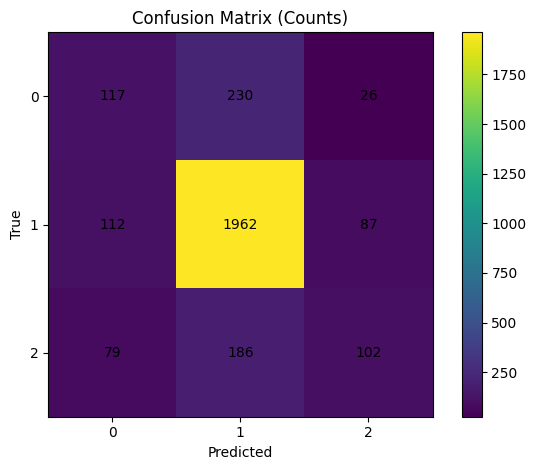

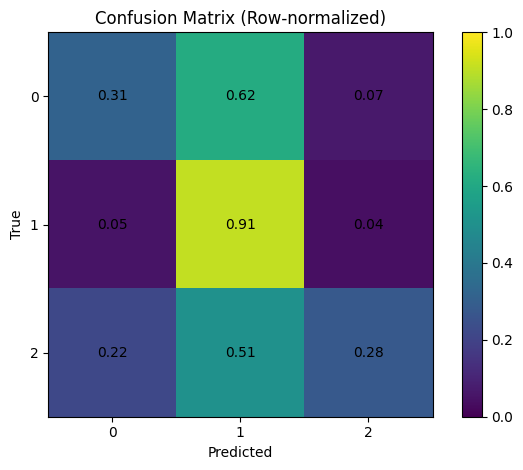

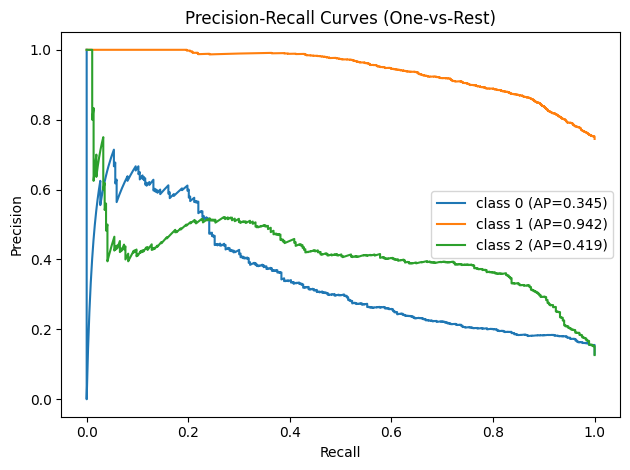

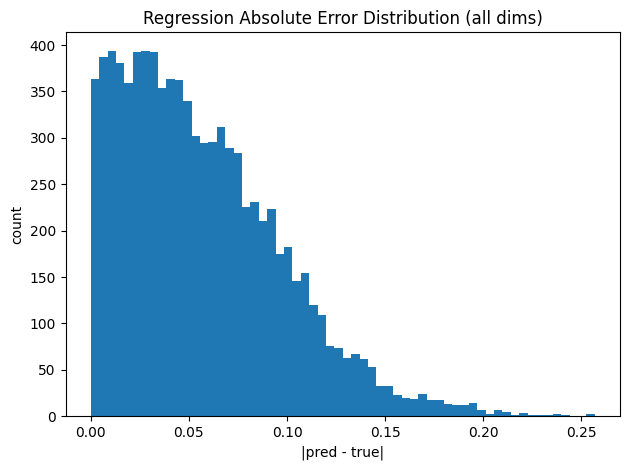

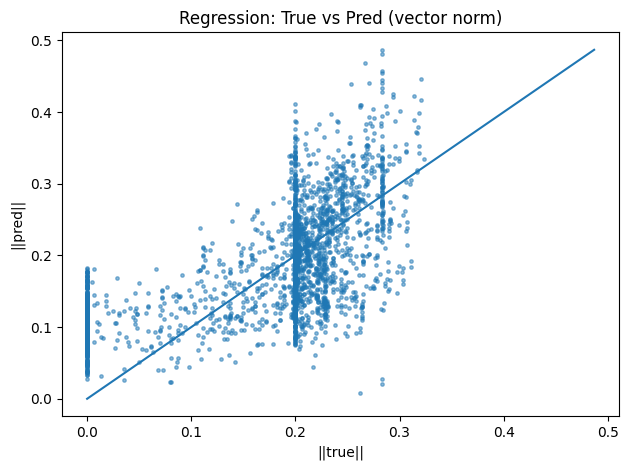


===== Regression (pos) =====
MAE_all:  0.057042
RMSE_all: 0.070174
CosSim:   0.634341
SignAgr:  0.443410

===== Classification (grp) =====
Accuracy:     0.751810
F1_macro:     0.519545
F1_weighted:  0.732509
PR_AUC_macro: 0.568539

Classification report:
               precision    recall  f1-score   support

           0     0.3799    0.3137    0.3436       373
           1     0.8251    0.9079    0.8645      2161
           2     0.4744    0.2779    0.3505       367

    accuracy                         0.7518      2901
   macro avg     0.5598    0.4998    0.5195      2901
weighted avg     0.7235    0.7518    0.7325      2901


Saved all results to: /workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/EXPERIMENT1/


{'regression': {'MAE_all': 0.057041775435209274,
  'RMSE_all': 0.07017422467470169,
  'MAE_dim': [0.06664396822452545, 0.04934603348374367, 0.05513527989387512],
  'RMSE_dim': [0.07823572307825089, 0.06344186514616013, 0.06802654266357422],
  'SignAgree_all': 0.44341030716896057,
  'SignAgree_dim': [0.4450189471244812,
   0.3864184617996216,
   0.49879351258277893],
  'CosineSim_mean': 0.6343408823013306},
 'classification': {'Accuracy': 0.7518097207859359,
  'F1_macro': 0.5195451331708046,
  'F1_weighted': 0.7325086182187988,
  'PR_AUC_macro': 0.5685391585422714,
  'PR_AUC_per_class': [0.3450649988565293,
   0.9419707419598868,
   0.41858173481039823],
  'ConfusionMatrix_counts': [[117, 230, 26], [112, 1962, 87], [79, 186, 102]],
  'ConfusionMatrix_normalized': [[0.31367292224360127,
    0.6166219838976776,
    0.0697050938319114],
   [0.05182785747315212, 0.9079130032350398, 0.04025913928718066],
   [0.21525885557996569, 0.5068119890870079, 0.2779291553057785]],
  'Classification_rep

In [22]:
result_dir="results/q1c/experiment1/"

ckpt_path = os.path.join(result_dir, "mdl_chkpnt_epoch_1_old.pt")
print(ckpt_path)

# Note
import os
os.environ["WANDB_MODE"] = "disabled"   # 不让 wandb 尝试 log

# Note
for m in model.modules():
    if hasattr(m, "_forward_hooks"):
        m._forward_hooks.clear()
    if hasattr(m, "_forward_pre_hooks"):
        m._forward_pre_hooks.clear()
# ===============================================

evaluate_checkpoint(
    model=model,
    val_dataloader=val_dataloader,
    ckpt_path=ckpt_path,
    result_dir=result_dir,
    show_plots=True,
)

In [ ]:
# Experiment 2 configuration (part 1)


# --------- FM3: wrap existing collate_func to add near-zero mask ----------
def make_collate_with_nearzero(base_collate_func, eps=1e-3):
    """
    base_collate_func: 你们原来的 collate_func（老师提供的）
    eps: near-zero threshold in action space
    """
    def collate_with_nearzero(batch_list):
        batch = base_collate_func(batch_list)

# Note
# Note
        y = batch.output["pos"]

# Note
        y_f = y.float()
        pos_norm = torch.norm(y_f, dim=-1)                 # (B,)
        near_zero_mask = (pos_norm < eps)                  # (B,) bool

# Note
        batch.output["pos_norm"] = pos_norm.to(dtype=y.dtype)
        batch.output["near_zero_mask"] = near_zero_mask

        return batch

    return collate_with_nearzero


# Note
FM3_NEARZERO_EPS = 1e-3
collate_func_fm3 = make_collate_with_nearzero(collate_func, eps=FM3_NEARZERO_EPS)

# Note
train_dataloader = DataLoader(
    train_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=True,
    collate_fn=collate_func_fm3,
)
val_dataloader = DataLoader(
    val_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func_fm3,
)

In [18]:
# Experiment 2 configuration (part 2)

# ====== FM3 EXP (SAFE, KEEP ORIGINAL HALF PRECISION):
#  - collate: add near_zero_mask + pos_norm
#  - pos loss: Near-zero weighted MSE (FM3 core)
#  - grp loss: Weighted CE + class-1 logit penalty (keep your EXP2)
#  - DO NOT change TrainingLoop half_precision behavior

import torch
import numpy as np
import os
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from comp0188_cw2.Loss.BalancedLoss import TrackerBalancedLoss
from comp0188_cw2.training.TrainingLoop import TorchTrainingLoop

result_dir = "results/q1c/experiment2/"
os.makedirs(result_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# ------------------------------
# 1) collate wrapper: add near_zero_mask + pos_norm (for analysis)
# ------------------------------
FM3_NEARZERO_EPS = 1e-3

def make_collate_with_nearzero(base_collate_func, eps=1e-3):
    def collate_with_nearzero(batch_list):
        batch = base_collate_func(batch_list)

        y = batch.output["pos"]
        y_f = y.float()
        pos_norm = torch.norm(y_f, dim=-1)          # (B,)
        near_zero_mask = (pos_norm < eps)           # (B,) bool

        batch.output["pos_norm"] = pos_norm.to(dtype=y.dtype)
        batch.output["near_zero_mask"] = near_zero_mask
        return batch
    return collate_with_nearzero

collate_func_fm3 = make_collate_with_nearzero(collate_func, eps=FM3_NEARZERO_EPS)

# rebuild dataloaders to use new collate
train_dataloader = DataLoader(
    train_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=True,
    collate_fn=collate_func_fm3,
)
val_dataloader = DataLoader(
    val_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func_fm3,
)


# ------------------------------
# 2) grp class weights (same as your EXP2)
# ------------------------------
gripper_labels = train_nps["actions"][:, 3].astype(int)
class_counts = np.bincount(gripper_labels, minlength=3).astype(np.float64)
total = class_counts.sum()

eps = 1e-12
freq = class_counts / (total + eps)

weights = (1.0 / (freq + eps)) ** 0.5
weights = weights / (weights.mean() + eps)
weights = np.clip(weights, 0.5, 5.0)

class_weights = torch.tensor(weights, dtype=torch.float32, device=device)

print("=== Gripper class counts ===", {i: int(c) for i, c in enumerate(class_counts)})
print("=== Gripper class freq ===",   {i: float(f) for i, f in enumerate(freq)})
print("=== Class weights ===",        {i: float(w) for i, w in enumerate(weights)})


# ------------------------------
# 3) FM3 core: near-zero weighted MSE (stable under half precision)
# ------------------------------
class NearZeroWeightedMSEStable(nn.Module):
    def __init__(self, eps=1e-3, alpha=1.0, max_w=10.0, clamp_y=20.0):
        super().__init__()
        self.eps = eps
        self.alpha = alpha
        self.max_w = max_w
        self.clamp_y = clamp_y

    def forward(self, pred, target):
        pred_f = pred.float()
        target_f = target.float()

        y_norm = torch.norm(target_f, dim=-1)  # (B,)
        y_norm = torch.clamp(y_norm, 0.0, self.clamp_y)

        w = (1.0 / (y_norm + self.eps)) ** self.alpha
        w = torch.clamp(w, 1.0, self.max_w)

        mse = (pred_f - target_f).pow(2).mean(dim=-1)  # (B,)
        loss_fp32 = (w * mse).mean()
        return loss_fp32.to(dtype=pred.dtype)

POS_ALPHA = 1.0
POS_MAX_W = 10.0
pos_criterion = NearZeroWeightedMSEStable(eps=FM3_NEARZERO_EPS, alpha=POS_ALPHA, max_w=POS_MAX_W)


# ------------------------------
# 4) grp loss: Weighted CE + class-1 logit penalty (stable)
# ------------------------------
class CrossEntropyWithLogitPenaltyStable(nn.Module):
    def __init__(self, weight=None, lam=0.005, class_idx=1, margin=2.0, clamp_val=20.0):
        super().__init__()
        self.ce = nn.CrossEntropyLoss(weight=weight)
        self.lam = lam
        self.class_idx = class_idx
        self.margin = margin
        self.clamp_val = clamp_val

    def forward(self, logits, target):
        ce_loss = self.ce(logits, target)

        z1 = logits[:, self.class_idx].float()
        z1 = torch.clamp(z1, -self.clamp_val, self.clamp_val)

        penalty_fp32 = F.softplus(z1 - self.margin).mean()
        penalty = penalty_fp32.to(dtype=ce_loss.dtype)

        return ce_loss + self.lam * penalty

LAM = 0.005
MARGIN = 2.0
CLAMP_VAL = 20.0

grp_criterion = CrossEntropyWithLogitPenaltyStable(
    weight=class_weights,
    lam=LAM,
    class_idx=1,
    margin=MARGIN,
    clamp_val=CLAMP_VAL
)


# ------------------------------
# 5) TrackerBalancedLoss (interface unchanged)
# ------------------------------
train_criterion = TrackerBalancedLoss(loss_lkp={"pos": pos_criterion, "grp": grp_criterion}, name="train", mo=mo)
val_criterion   = TrackerBalancedLoss(loss_lkp={"pos": pos_criterion, "grp": grp_criterion}, name="val", mo=mo)


# ------------------------------
# 6) Model / Optimizer (keep baseline flow)
# ------------------------------
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


# ------------------------------
# 7) Training loop (keep original half_precision)
# ------------------------------
trainer = TorchTrainingLoop(
    model=model,
    gpu=True,
    optimizer=optimizer,
    criterion=train_criterion,
    val_criterion=val_criterion,
    epochs=10,
    logger=logger,
    mo=mo,
    half_precision=exp_kwargs["half_precision"],
    preds_save_type=None,
)

trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp="FM3_nearzero_posWeightedMSE_plus_grpRegularisation",
    wandb_config={
        **exp_kwargs,
        "nearzero_eps": FM3_NEARZERO_EPS,
        "pos_weight_alpha": POS_ALPHA,
        "pos_weight_max": POS_MAX_W,
        "logit_penalty_lambda": LAM,
        "logit_penalty_margin": MARGIN,
        "logit_penalty_clamp": CLAMP_VAL,
        "grp_weighting": "sqrt_invfreq_norm_clip(0.5,5.0)",
    },
    wandb_name=f"FM3_posWmse_eps{FM3_NEARZERO_EPS}_a{POS_ALPHA}_mw{POS_MAX_W}_lam{LAM}",
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
)

# ====== END FM3 EXP ======

=== Gripper class counts === {0: 3061, 1: 19147, 2: 3261}
=== Gripper class freq === {0: 0.12018532333424949, 1: 0.7517766696768621, 2: 0.12803800698888845}
=== Class weights === {0: 1.266525610925444, 1: 0.5064018369740593, 2: 1.2270725520991794}


100%|██████████| 398/398 [00:40<00:00,  9.82it/s]


epoch_train_loss,█▆▄▃▂▂▁▁▁▁
epoch_val_loss,▁▂▂▄▅▅███▆
grp_train_loss,▇▆▅█▆▄█▅▄▄▄▃▄▂▃▃▂▂▂▃▂▂▁▃▁▃▂▁▂▂▂▁▁▁▁▁▁▂▁▂
grp_val_loss,▂▂▂▂▂▂▂▄▁▅▂▆▄▃▁▆▁▃▃▃▄▁▂▁▂▃█▁▂▂▁▃▂▅▄▂▃▃▄▅
pos_train_loss,█▅▄▃▂▃▂▂▂▂▂▂▂▃▂▃▂▁▂▂▂▂▁▂▁▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁
pos_val_loss,▅▄▂▁▁▃▁▁▃▄▃▇▂▃▁▃▁▅▂▃▅▂▁▃▅▄▂▁▂▁▃▃▁█▁▂▆▂▂▃
epoch_train_loss,0.07819
epoch_val_loss,1.25781
grp_train_loss,0.03005
grp_val_loss,0.06536
pos_train_loss,0.00488


/workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/EXPERIMENT2/mdl_chkpnt_epoch_2.pt
[Info] Evaluating checkpoint: /workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/EXPERIMENT2/mdl_chkpnt_epoch_2.pt
[Info] Device=cuda, model dtype=torch.float16, use_fp16=True


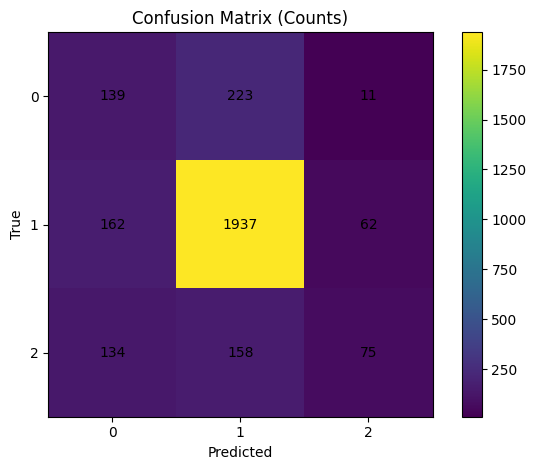

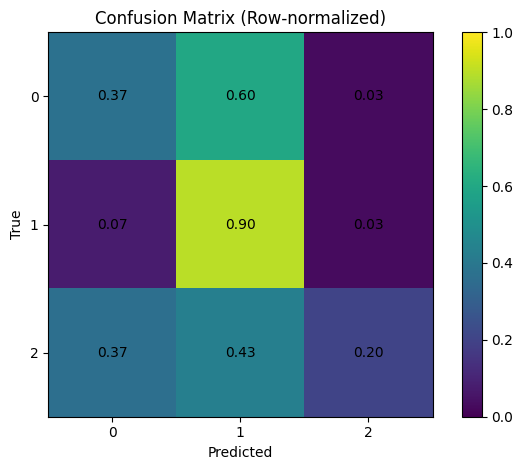

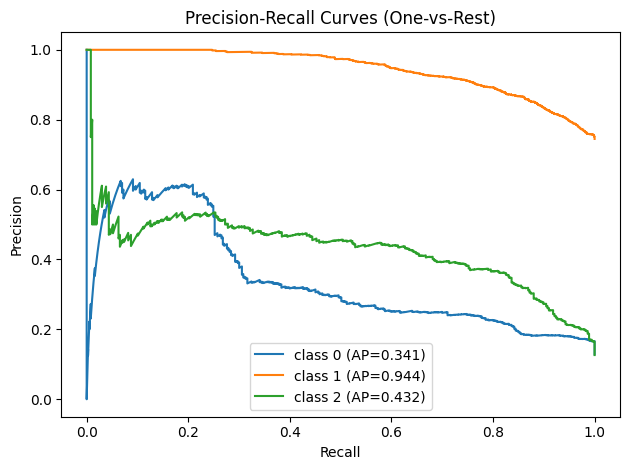

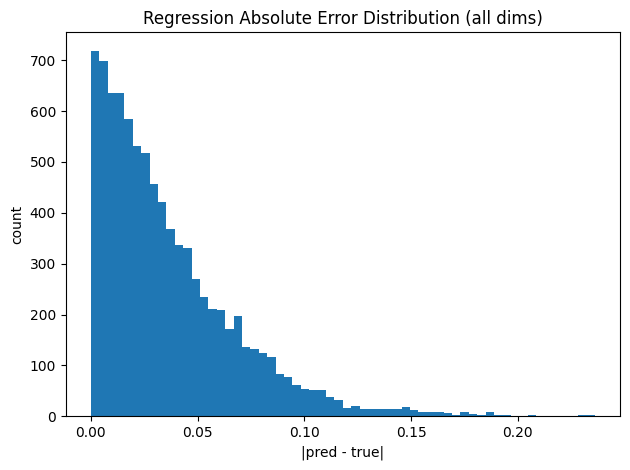

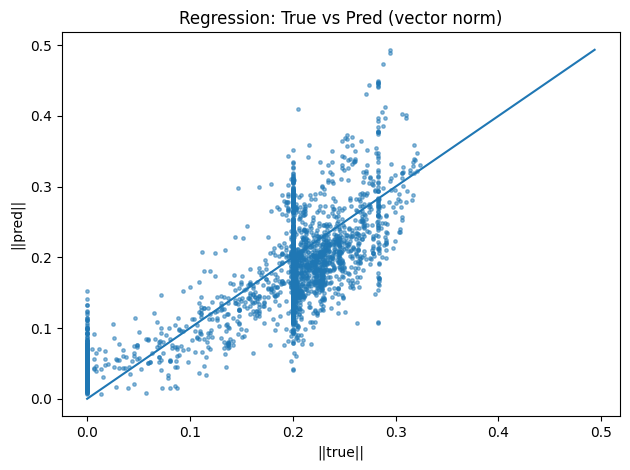


===== Regression (pos) =====
MAE_all:  0.036513
RMSE_all: 0.048689
CosSim:   0.710296
SignAgr:  0.450190

===== Classification (grp) =====
Accuracy:     0.741468
F1_macro:     0.500082
F1_weighted:  0.725381
PR_AUC_macro: 0.572188

Classification report:
               precision    recall  f1-score   support

           0     0.3195    0.3727    0.3441       373
           1     0.8356    0.8963    0.8649      2161
           2     0.5068    0.2044    0.2913       367

    accuracy                         0.7415      2901
   macro avg     0.5540    0.4911    0.5001      2901
weighted avg     0.7277    0.7415    0.7254      2901


Saved all results to: /workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/EXPERIMENT2/


{'regression': {'MAE_all': 0.036513205617666245,
  'RMSE_all': 0.04868929088115692,
  'MAE_dim': [0.03847690299153328, 0.03645294904708862, 0.03460977226495743],
  'RMSE_dim': [0.05098714306950569, 0.04868002608418465, 0.04628729075193405],
  'SignAgree_all': 0.45018959045410156,
  'SignAgree_dim': [0.4653567671775818,
   0.3933126628398895,
   0.4918993413448334],
  'CosineSim_mean': 0.7102957367897034},
 'classification': {'Accuracy': 0.7414684591520165,
  'F1_macro': 0.5000822494607454,
  'F1_weighted': 0.7253811560108827,
  'PR_AUC_macro': 0.5721881979141851,
  'PR_AUC_per_class': [0.34085511646374866,
   0.9438028910796588,
   0.43190658619914774],
  'ConfusionMatrix_counts': [[139, 223, 11], [162, 1937, 62], [134, 158, 75]],
  'ConfusionMatrix_normalized': [[0.3726541554859878,
    0.5978552278660092,
    0.02949061662119328],
   [0.07496529384509502, 0.8963442850490684, 0.02869042110120921],
   [0.36512261579386585, 0.43051771115993137, 0.20435967301895477]],
  'Classification_r

In [23]:
result_dir="results/q1c/experiment2/"


# Note
ckpt_path = os.path.join(result_dir, "mdl_chkpnt_epoch_2.pt")

print(ckpt_path)

evaluate_checkpoint(
    model=model,
    val_dataloader=val_dataloader,
    ckpt_path=ckpt_path,
    result_dir=result_dir,
    show_plots=True,
)

In [19]:
# Run this cell to generate empirical evaluation evidence.

# Implementation section
# ====== FM3B EXP (SAFE, KEEP ORIGINAL HALF PRECISION):
#  - collate: add near_zero_mask + pos_norm + mount_cam per-image z-score normalisation
#  - pos loss: Near-zero weighted MSE (FM3 core)
#  - grp loss: Weighted CE + class-1 logit penalty (keep EXP2 style)
#  - DO NOT change TrainingLoop half_precision behavior

import torch
import numpy as np
import os
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
from comp0188_cw2.Loss.BalancedLoss import TrackerBalancedLoss
from comp0188_cw2.training.TrainingLoop import TorchTrainingLoop

# ---------- naming ----------
result_dir = "results/q1c/experiment3/"
os.makedirs(result_dir, exist_ok=True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# ------------------------------
# 1) collate wrapper: near-zero stats + mount z-score (BOOST)
# ------------------------------
FM3_NEARZERO_EPS = 1e-3

# mount z-score hyperparams (safe defaults)
MOUNT_IDX = 1          # assumes images shape (B, 2, H, W): 0=front, 1=mount
VIS_EPS = 1e-6
VIS_CLAMP = 5.0

def make_collate_fm3B(base_collate_func,
                      near_eps=1e-3,
                      mount_idx=1,
                      vis_eps=1e-6,
                      clamp=5.0):
    def collate_fn(batch_list):
        batch = base_collate_func(batch_list)

        # ---- (A) near-zero mask + pos_norm (analysis + can be used later) ----
        y = batch.output["pos"]                 # (B, D)
        y_f = y.float()
        pos_norm = torch.norm(y_f, dim=-1)      # (B,)
        near_zero_mask = (pos_norm < near_eps)  # (B,) bool
        batch.output["pos_norm"] = pos_norm.to(dtype=y.dtype)
        batch.output["near_zero_mask"] = near_zero_mask

        # ---- (B) mount_cam per-image z-score normalisation (input-side boost) ----
        imgs = batch.input["images"]            # expected (B, 2, H, W)
        imgs_f = imgs.float()

        # mount channel: (B, H, W)
        m = imgs_f[:, mount_idx, :, :]
        mean = m.mean(dim=(1, 2), keepdim=True)
        std  = m.std(dim=(1, 2), keepdim=True).clamp_min(vis_eps)

        m_norm = (m - mean) / std
        if clamp is not None:
            m_norm = torch.clamp(m_norm, -clamp, clamp)

        imgs_f[:, mount_idx, :, :] = m_norm
        batch.input["images"] = imgs_f.to(dtype=imgs.dtype)

        return batch

    return collate_fn

collate_func_fm3 = make_collate_fm3B(
    collate_func,
    near_eps=FM3_NEARZERO_EPS,
    mount_idx=MOUNT_IDX,
    vis_eps=VIS_EPS,
    clamp=VIS_CLAMP
)

# rebuild dataloaders to use new collate
train_dataloader = DataLoader(
    train_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=True,
    collate_fn=collate_func_fm3,
)
val_dataloader = DataLoader(
    val_dataset,
    batch_size=exp_kwargs["batch_size"],
    shuffle=False,
    collate_fn=collate_func_fm3,
)


# ------------------------------
# 2) grp class weights (same as your EXP2)
# ------------------------------
gripper_labels = train_nps["actions"][:, 3].astype(int)
class_counts = np.bincount(gripper_labels, minlength=3).astype(np.float64)
total = class_counts.sum()

eps = 1e-12
freq = class_counts / (total + eps)

weights = (1.0 / (freq + eps)) ** 0.5
weights = weights / (weights.mean() + eps)
weights = np.clip(weights, 0.5, 5.0)

class_weights = torch.tensor(weights, dtype=torch.float32, device=device)

print("=== Gripper class counts ===", {i: int(c) for i, c in enumerate(class_counts)})
print("=== Gripper class freq ===",   {i: float(f) for i, f in enumerate(freq)})
print("=== Class weights ===",        {i: float(w) for i, w in enumerate(weights)})


# ------------------------------
# 3) FM3 core: near-zero weighted MSE (stable under half precision)
# ------------------------------
class NearZeroWeightedMSEStable(nn.Module):
    def __init__(self, eps=1e-3, alpha=1.0, max_w=10.0, clamp_y=20.0):
        super().__init__()
        self.eps = eps
        self.alpha = alpha
        self.max_w = max_w
        self.clamp_y = clamp_y

    def forward(self, pred, target):
        pred_f = pred.float()
        target_f = target.float()

        y_norm = torch.norm(target_f, dim=-1)  # (B,)
        y_norm = torch.clamp(y_norm, 0.0, self.clamp_y)

        w = (1.0 / (y_norm + self.eps)) ** self.alpha
        w = torch.clamp(w, 1.0, self.max_w)

        mse = (pred_f - target_f).pow(2).mean(dim=-1)  # (B,)
        loss_fp32 = (w * mse).mean()
        return loss_fp32.to(dtype=pred.dtype)

POS_ALPHA = 1.0
POS_MAX_W = 10.0
pos_criterion = NearZeroWeightedMSEStable(eps=FM3_NEARZERO_EPS, alpha=POS_ALPHA, max_w=POS_MAX_W)


# ------------------------------
# 4) grp loss: Weighted CE + class-1 logit penalty (stable)
# ------------------------------
class CrossEntropyWithLogitPenaltyStable(nn.Module):
    def __init__(self, weight=None, lam=0.005, class_idx=1, margin=2.0, clamp_val=20.0):
        super().__init__()
        self.ce = nn.CrossEntropyLoss(weight=weight)
        self.lam = lam
        self.class_idx = class_idx
        self.margin = margin
        self.clamp_val = clamp_val

    def forward(self, logits, target):
        ce_loss = self.ce(logits, target)

        z1 = logits[:, self.class_idx].float()
        z1 = torch.clamp(z1, -self.clamp_val, self.clamp_val)

        penalty_fp32 = F.softplus(z1 - self.margin).mean()
        penalty = penalty_fp32.to(dtype=ce_loss.dtype)

        return ce_loss + self.lam * penalty

LAM = 0.005
MARGIN = 2.0
CLAMP_VAL = 20.0

grp_criterion = CrossEntropyWithLogitPenaltyStable(
    weight=class_weights,
    lam=LAM,
    class_idx=1,
    margin=MARGIN,
    clamp_val=CLAMP_VAL
)


# ------------------------------
# 5) TrackerBalancedLoss (interface unchanged)
# ------------------------------
train_criterion = TrackerBalancedLoss(loss_lkp={"pos": pos_criterion, "grp": grp_criterion}, name="train", mo=mo)
val_criterion   = TrackerBalancedLoss(loss_lkp={"pos": pos_criterion, "grp": grp_criterion}, name="val", mo=mo)


# ------------------------------
# 6) Model / Optimizer (keep baseline flow)
# ------------------------------
model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)


# ------------------------------
# 7) Training loop (keep original half_precision)
# ------------------------------
trainer = TorchTrainingLoop(
    model=model,
    gpu=True,
    optimizer=optimizer,
    criterion=train_criterion,
    val_criterion=val_criterion,
    epochs=10,
    logger=logger,
    mo=mo,
    half_precision=exp_kwargs["half_precision"],
    preds_save_type=None,
)

trainer.training_loop(
    train_loader=train_dataloader,
    val_loader=val_dataloader,
    wandb_proj=WANDB_PROJECT,
    wandb_grp="FM3B_nearzero_plus_mountZscore",
    wandb_config={
        **exp_kwargs,
        "nearzero_eps": FM3_NEARZERO_EPS,
        "pos_weight_alpha": POS_ALPHA,
        "pos_weight_max": POS_MAX_W,
        "logit_penalty_lambda": LAM,
        "logit_penalty_margin": MARGIN,
        "logit_penalty_clamp": CLAMP_VAL,
        "grp_weighting": "sqrt_invfreq_norm_clip(0.5,5.0)",
        # FM3B add-on
        "mount_zscore": True,
        "mount_idx": MOUNT_IDX,
        "vis_eps": VIS_EPS,
        "vis_clamp": VIS_CLAMP,
    },
    wandb_name=f"FM3B_eps{FM3_NEARZERO_EPS}_mw{POS_MAX_W}_lam{LAM}_mountZ{VIS_CLAMP}",
    reset_kwargs={
        "image_encoder_kwargs": {},
        "obs_encoder_kwargs": {},
        "dense_kwargs": {}
    }
)

# ====== END FM3B EXP ======

# ******* Implementation HERE - END *******

=== Gripper class counts === {0: 3061, 1: 19147, 2: 3261}
=== Gripper class freq === {0: 0.12018532333424949, 1: 0.7517766696768621, 2: 0.12803800698888845}
=== Class weights === {0: 1.266525610925444, 1: 0.5064018369740593, 2: 1.2270725520991794}


100%|██████████| 398/398 [00:39<00:00, 10.06it/s]


epoch_train_loss,█▅▃▂▂▁▁▁▁▁
epoch_val_loss,▁▂▄▅▆▅▆▅█▆
grp_train_loss,█▆▇▆█▅▆▅▇▇▄▃▄▃▂▁▂▂▃▂▂▂▂▁▂▁▄▁▁▂▁▁▂▂▂▁▁▂▂▁
grp_val_loss,▂▂▃▃▂▃▆▄▂▃▂▂▇▂▁▃▅▁▂▇▂▂▂▅▄▁▄▅▅▆▃▁▂█▂▄▂▂▂▅
pos_train_loss,█▄▃▂▃▂▂▂▁▂▂▁▁▂▂▁▂▁▂▂▂▁▁▂▁▁▁▂▂▁▁▁▁▃▁▁▁▁▁▁
pos_val_loss,▃▁▁▁▁▄▂█▁▆▂▄▂▃▁▁▃▁▄▁▁▂▂▂▂▂▂▂▂▃▂▅▂▆▃▄▂▂▄▂
epoch_train_loss,0.07117
epoch_val_loss,1.18066
grp_train_loss,0.01315
grp_val_loss,0.68654
pos_train_loss,0.00486


/workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/EXPERIMENT3/mdl_chkpnt_epoch_2.pt
[Info] Evaluating checkpoint: /workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/EXPERIMENT3/mdl_chkpnt_epoch_2.pt
[Info] Device=cuda, model dtype=torch.float16, use_fp16=True


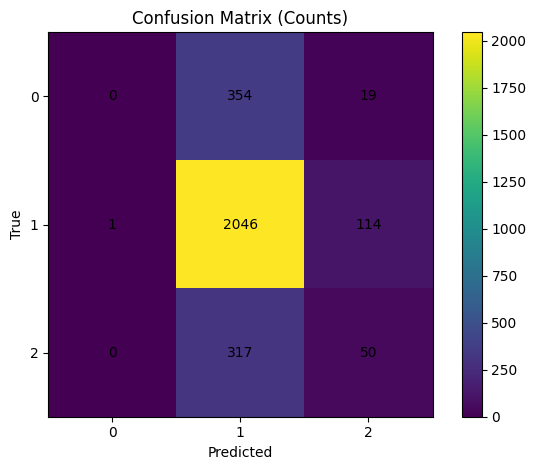

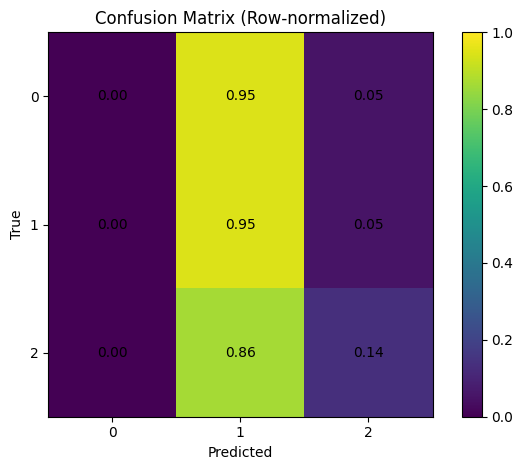

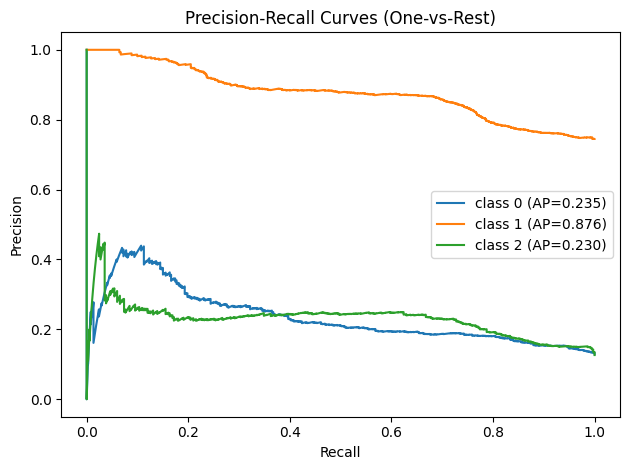

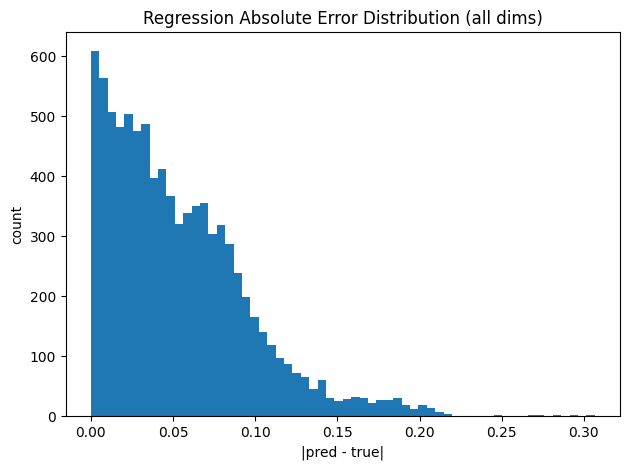

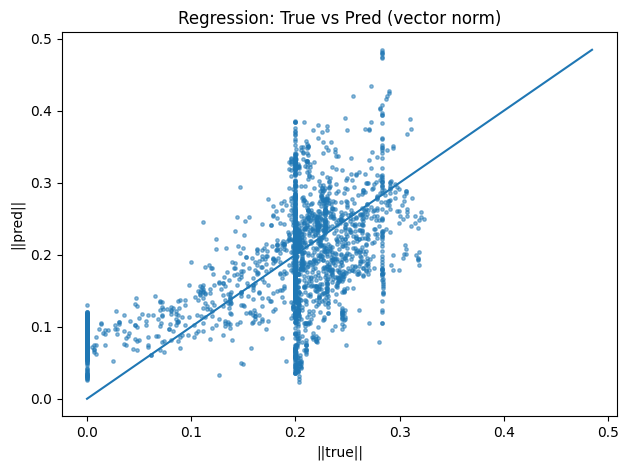


===== Regression (pos) =====
MAE_all:  0.053791
RMSE_all: 0.068587
CosSim:   0.628686
SignAgr:  0.434218

===== Classification (grp) =====
Accuracy:     0.722509
F1_macro:     0.340229
F1_weighted:  0.647888
PR_AUC_macro: 0.447096

Classification report:
               precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000       373
           1     0.7530    0.9468    0.8389      2161
           2     0.2732    0.1362    0.1818       367

    accuracy                         0.7225      2901
   macro avg     0.3421    0.3610    0.3402      2901
weighted avg     0.5955    0.7225    0.6479      2901


Saved all results to: /workspace/tbx/cw2/COMP0188_CW2_Question/results/q1c/EXPERIMENT3/


{'regression': {'MAE_all': 0.05379131808876991,
  'RMSE_all': 0.0685873031616211,
  'MAE_dim': [0.08566895127296448, 0.04252869263291359, 0.03317631408572197],
  'RMSE_dim': [0.096322201192379, 0.05400688946247101, 0.043794550001621246],
  'SignAgree_all': 0.43421807885169983,
  'SignAgree_dim': [0.41158220171928406,
   0.39262324571609497,
   0.49844881892204285],
  'CosineSim_mean': 0.628686249256134},
 'classification': {'Accuracy': 0.7225094794898311,
  'F1_macro': 0.3402288568340229,
  'F1_weighted': 0.6478875769297319,
  'PR_AUC_macro': 0.44709592595534287,
  'PR_AUC_per_class': [0.23535319112660877,
   0.8759908337631348,
   0.2299437529762851],
  'ConfusionMatrix_counts': [[0, 354, 19], [1, 2046, 114], [0, 317, 50]],
  'ConfusionMatrix_normalized': [[0.0,
    0.9490616621729474,
    0.05093833780024294],
   [0.0004627487274388582, 0.9467838963399039, 0.052753354928029836],
   [0.0, 0.8637602179601155, 0.1362397820126365]],
  'Classification_report': '              precision    

In [24]:
result_dir="results/q1c/experiment3/"


# Note
ckpt_path = os.path.join(result_dir, "mdl_chkpnt_epoch_2.pt")

print(ckpt_path)

evaluate_checkpoint(
    model=model,
    val_dataloader=val_dataloader,
    ckpt_path=ckpt_path,
    result_dir=result_dir,
    show_plots=True,
)

In [27]:
# Implementation section
# ---------------------------------------------------------------------
# Self-supervised VAE (observation-only)
# Data notes:
# - front_cam_ob, mount_cam_ob: grayscale 224x224 -> (1,224,224) after global_transforms
# - pixel range ~[0,255] (NOT normalised to [0,1])
#
# Therefore:
# - img_size = 224
# - decoder output: NO sigmoid
# - reconstruction loss: MSE (mean)
# - latent_dim fixed to 32 for Q3 interface
# ---------------------------------------------------------------------
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# ----------------------------
# 1) Dataset: ONLY two images
# ----------------------------
class TwoCamOnlyDataset(Dataset):
    """
    Fully self-supervised: returns only observation images.
    Output:
      x: Tensor [2, 224, 224] by concatenating (front_cam_ob, mount_cam_ob) along channel dimension.
    IMPORTANT: NO actions / rewards / dones / next_obs / low-dim states are touched or returned.
    """
    def __init__(self, np_dict, transform_lkp):
        assert "front_cam_ob" in np_dict and "mount_cam_ob" in np_dict
        self.front = np_dict["front_cam_ob"]
        self.mount = np_dict["mount_cam_ob"]
        self.tf_front = transform_lkp["front_cam_ob"]
        self.tf_mount = transform_lkp["mount_cam_ob"]
        assert len(self.front) == len(self.mount), "front and mount lengths mismatch"

    def __len__(self):
        return len(self.front)

    def __getitem__(self, idx):
        f = self.tf_front(self.front[idx])   # expected shape: [1,224,224]
        m = self.tf_mount(self.mount[idx])   # expected shape: [1,224,224]
        x = torch.cat([f, m], dim=0)         # [2,224,224]
        return x


# ----------------------------
# 2) Conv VAE (2x224x224)
# ----------------------------
class ConvVAE(nn.Module):
    def __init__(self, in_ch=2, latent_dim=64, base_ch=32):
        super().__init__()
        # 224 -> 112 -> 56 -> 28 -> 14 -> 7
        self.enc = nn.Sequential(
            nn.Conv2d(in_ch, base_ch, 4, 2, 1), nn.ReLU(True),
            nn.Conv2d(base_ch, base_ch*2, 4, 2, 1), nn.ReLU(True),
            nn.Conv2d(base_ch*2, base_ch*4, 4, 2, 1), nn.ReLU(True),
            nn.Conv2d(base_ch*4, base_ch*8, 4, 2, 1), nn.ReLU(True),
            nn.Conv2d(base_ch*8, base_ch*16, 4, 2, 1), nn.ReLU(True),
        )
        self.enc_out_ch = base_ch * 16
        self.enc_out_hw = 7
        enc_flat = self.enc_out_ch * self.enc_out_hw * self.enc_out_hw

        self.fc = nn.Sequential(
            nn.Linear(enc_flat, 512),
            nn.ReLU(True),
        )
        self.fc_mu = nn.Linear(512, latent_dim)
        self.fc_logvar = nn.Linear(512, latent_dim)
        nn.init.constant_(self.fc_logvar.bias, -4.0)


        self.fc_dec = nn.Sequential(
            nn.Linear(latent_dim, 512),
            nn.ReLU(True),
            nn.Linear(512, enc_flat),
            nn.ReLU(True),
        )

        self.dec = nn.Sequential(
            nn.ConvTranspose2d(self.enc_out_ch, base_ch*8, 4, 2, 1), nn.ReLU(True),  # 14
            nn.ConvTranspose2d(base_ch*8, base_ch*4, 4, 2, 1), nn.ReLU(True),       # 28
            nn.ConvTranspose2d(base_ch*4, base_ch*2, 4, 2, 1), nn.ReLU(True),       # 56
            nn.ConvTranspose2d(base_ch*2, base_ch, 4, 2, 1), nn.ReLU(True),         # 112
            nn.ConvTranspose2d(base_ch, in_ch, 4, 2, 1),                            # 224
        )

    def encode(self, x):
        h = self.enc(x).flatten(1)
        h = self.fc(h)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        # logvar clamp avoids overflow in exp
        logvar = logvar.clamp(-6.0, 2.0)
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std, logvar

    def decode(self, z):
        h = self.fc_dec(z)
        h = h.view(-1, self.enc_out_ch, self.enc_out_hw, self.enc_out_hw)
        out = self.dec(h)
        return out

    def forward(self, x):
        mu, logvar = self.encode(x)
        z, logvar = self.reparameterize(mu, logvar)
        recon_raw = self.decode(z)  # raw (unbounded) output
        return recon_raw, mu, logvar, z


# ----------------------------
# 3) Loss: Sigmoid + MSE + beta*KL  (robust to 0-1 or 0-255 inputs)
# ----------------------------
def vae_loss_sigmoid_mse(recon_raw, x, mu, logvar, beta=1.0):
    """
    - Automatically scales x to [0,1] if it looks like [0,255]
    - Uses sigmoid(recon_raw) to match [0,1] target
    - MSE reconstruction (sum over pixels/channels, mean over batch)
    """
    x = x.float()
    # auto-detect scale
    if torch.isfinite(x).all():
        if x.max() > 1.5:
            x = x / 255.0
    x = x.clamp(0.0, 1.0)

    recon = torch.sigmoid(recon_raw)  # [0,1]
    recon_term = F.mse_loss(recon, x, reduction="mean")


    # KL term
    logvar = logvar.clamp(-6.0, 2.0)

    kl_per_dim = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp())  # [B, D]

    # optional: free-bits (keeps KL from collapsing to 0)
    free_bits = 0.2
    kl_per_dim = torch.clamp(kl_per_dim, min=free_bits)
    kl = kl_per_dim.mean(dim=1).mean()



    total = recon_term + beta * kl
    return total, recon_term.detach(), kl.detach()


# ----------------------------
# 4) Training loop (re-runnable)
# ----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

batch_size = 256
# #####increase batch_size if you run out of GPU memory
train_ds = TwoCamOnlyDataset(train_nps, global_transforms)
val_ds   = TwoCamOnlyDataset(val_nps, global_transforms)

train_loader = DataLoader(
    train_ds, batch_size=batch_size, shuffle=True,
    num_workers=0, pin_memory=torch.cuda.is_available(), drop_last=False
)
# #####increase num_workers if you run out of CPU threads
val_loader = DataLoader(
    val_ds, batch_size=batch_size, shuffle=False,
    num_workers=0, pin_memory=torch.cuda.is_available(), drop_last=False
)

torch.manual_seed(1)
vae = ConvVAE(in_ch=2, latent_dim=64, base_ch=32).to(device)

optimizer = torch.optim.AdamW(vae.parameters(), lr=1e-3, weight_decay=1e-4)

# AMP OFF by default for stability (turn on after it's stable if you want)
use_amp = True
scaler = torch.cuda.amp.GradScaler(enabled=use_amp)

def beta_schedule(epoch, warmup=20, max_beta=1.0):
    return max_beta * min(1.0, epoch / warmup)


num_epochs = 30
best_val = float("inf")
best_state = None

history = {"train_total": [], "train_recon": [], "train_kl": [],
           "val_total": [], "val_recon": [], "val_kl": []}

# (Optional sanity check: print first batch range)
x0 = next(iter(train_loader))
x0 = x0.float()
mx = x0.max().item()
mn = x0.min().item()
print(f"Sanity check - raw batch range: min={mn:.3f}, max={mx:.3f} (auto-scale will handle 0-255 vs 0-1)")

for epoch in range(num_epochs):
    vae.train()
    beta = beta_schedule(epoch, warmup=20, max_beta=1.0)

    tr_tot = tr_rec = tr_kl = 0.0
    n_tr = 0

    for x in train_loader:
        x = x.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with torch.cuda.amp.autocast(enabled=use_amp):
            recon_raw, mu, logvar, z = vae(x)
            loss, recon_term, kl_term = vae_loss_sigmoid_mse(recon_raw, x, mu, logvar, beta=beta)

        # Backprop (stable)
        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(vae.parameters(), 5.0)
        scaler.step(optimizer)
        scaler.update()

        bs = x.size(0)
        tr_tot += loss.item() * bs
        tr_rec += recon_term.item() * bs
        tr_kl  += kl_term.item() * bs
        n_tr += bs

    tr_tot /= n_tr
    tr_rec /= n_tr
    tr_kl  /= n_tr

    vae.eval()
    va_tot = va_rec = va_kl = 0.0
    n_va = 0
    with torch.no_grad():
        for x in val_loader:
            x = x.to(device, non_blocking=True)
            recon_raw, mu, logvar, z = vae(x)
            loss, recon_term, kl_term = vae_loss_sigmoid_mse(recon_raw, x, mu, logvar, beta=beta)

            bs = x.size(0)
            va_tot += loss.item() * bs
            va_rec += recon_term.item() * bs
            va_kl  += kl_term.item() * bs
            n_va += bs

    va_tot /= n_va
    va_rec /= n_va
    va_kl  /= n_va

    history["train_total"].append(tr_tot)
    history["train_recon"].append(tr_rec)
    history["train_kl"].append(tr_kl)
    history["val_total"].append(va_tot)
    history["val_recon"].append(va_rec)
    history["val_kl"].append(va_kl)

    print(f"[Epoch {epoch+1:02d}/{num_epochs}] beta={beta:.2f} | "
          f"train: total={tr_tot:.2f}, recon={tr_rec:.2f}, kl={tr_kl:.2f} | "
          f"val: total={va_tot:.2f}, recon={va_rec:.2f}, kl={va_kl:.2f}")

    if torch.isfinite(torch.tensor(va_tot)) and va_tot < best_val:
        best_val = va_tot
        best_state = {k: v.detach().cpu().clone() for k, v in vae.state_dict().items()}

if best_state is not None:
    vae.load_state_dict(best_state)
print("Best val total loss:", best_val)


# ******* Implementation HERE - END *******

C:\Users\32618\AppData\Local\Temp\ipykernel_34364\1077770136.py:180: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=use_amp)
C:\Users\32618\AppData\Local\Temp\ipykernel_34364\1077770136.py:212: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):


Sanity check - raw batch range: min=0.002, max=0.999 (auto-scale will handle 0-255 vs 0-1)
[Epoch 01/30] beta=0.00 | train: total=0.03, recon=0.03, kl=1.57 | val: total=0.02, recon=0.02, kl=2.04
[Epoch 02/30] beta=0.05 | train: total=0.04, recon=0.02, kl=0.44 | val: total=0.03, recon=0.02, kl=0.20
[Epoch 03/30] beta=0.10 | train: total=0.04, recon=0.02, kl=0.20 | val: total=0.04, recon=0.02, kl=0.20
[Epoch 04/30] beta=0.15 | train: total=0.05, recon=0.02, kl=0.20 | val: total=0.05, recon=0.02, kl=0.20
[Epoch 05/30] beta=0.20 | train: total=0.06, recon=0.02, kl=0.20 | val: total=0.06, recon=0.02, kl=0.20
[Epoch 06/30] beta=0.25 | train: total=0.07, recon=0.02, kl=0.20 | val: total=0.07, recon=0.02, kl=0.20
[Epoch 07/30] beta=0.30 | train: total=0.08, recon=0.02, kl=0.20 | val: total=0.08, recon=0.02, kl=0.20
[Epoch 08/30] beta=0.35 | train: total=0.09, recon=0.02, kl=0.20 | val: total=0.09, recon=0.02, kl=0.20
[Epoch 09/30] beta=0.40 | train: total=0.10, recon=0.02, kl=0.20 | val: total

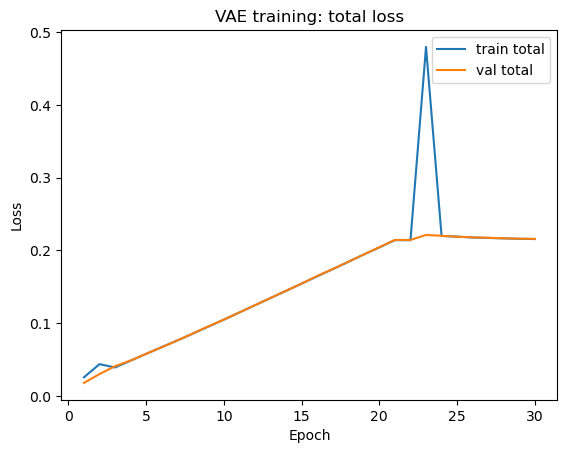

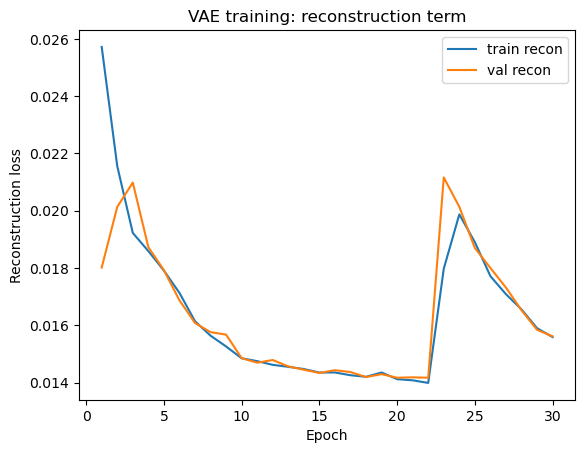

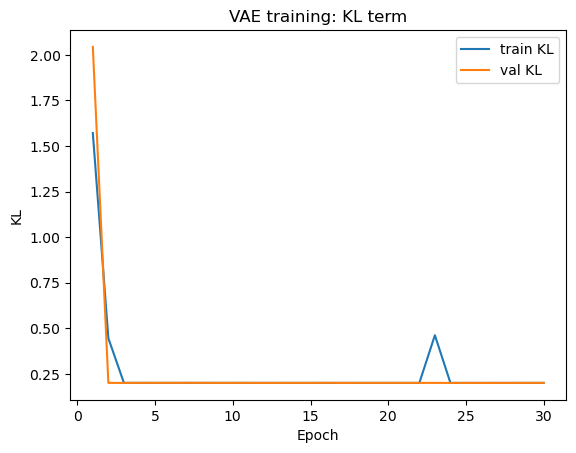


=== Final dataset-level evaluation (obs-only) ===
Train: total=2.0226±0.1922, recon=0.0176±0.0053, kl=2.0050±0.1891
Val:   total=2.0595±0.1400, recon=0.0179±0.0042, kl=2.0416±0.1376


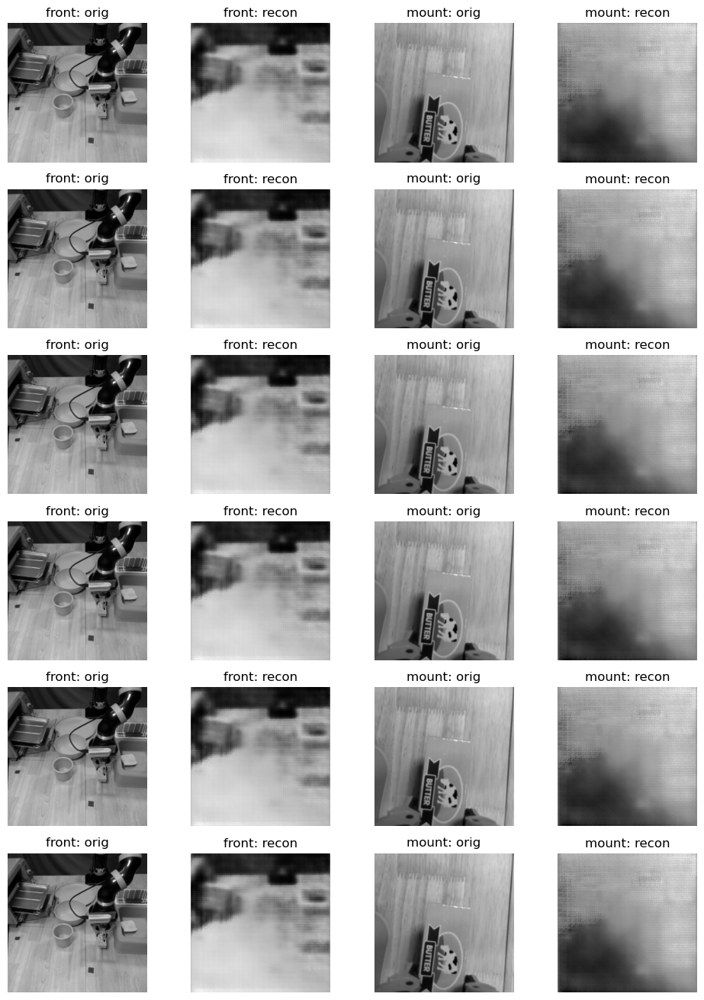


=== Automatic convergence summary (last 5 epochs) ===
Plateau criterion: mean relative change < 2.0% over last 5 epochs

[TOTAL]
  Train: plateau=True | rel_change=0.0030 | tail_mean=0.2166±0.0008
  Val:   plateau=True | rel_change=0.0027 | tail_mean=0.2168±0.0008
  Final generalisation gap (val - train): +0.0003

[RECON]
  Train: plateau=False | rel_change=0.0400 | tail_mean=0.0166±0.0008
  Val:   plateau=False | rel_change=0.0370 | tail_mean=0.0167±0.0009
  Final generalisation gap (val - train): +0.0000

[KL]
  Train: plateau=True | rel_change=0.0001 | tail_mean=0.2001±0.0000
  Val:   plateau=True | rel_change=0.0005 | tail_mean=0.2002±0.0001
  Final generalisation gap (val - train): +0.0003

Verdict:  The validation total loss appears to have plateaued (rel_change=0.0027). This supports convergence.


In [ ]:
# Run this cell to generate empirical evaluation evidence.

# Implementation section
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader

# ----------------------------
# 0) Safety checks
# ----------------------------
assert "train_nps" in globals() and "val_nps" in globals(), "Missing train_nps/val_nps. Please run the data-loading cells above."
assert "global_transforms" in globals(), "Missing global_transforms. Please run the transforms cell above."
assert "vae" in globals(), "Missing vae model. Please run VAE training first."

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vae = vae.to(device)

# ----------------------------
# 1) Dataset: ONLY observation images (two cameras)
# ----------------------------
class TwoCamOnlyDataset(Dataset):
    def __init__(self, np_dict, transform_lkp):
        self.front = np_dict["front_cam_ob"]
        self.mount = np_dict["mount_cam_ob"]
        self.tf_front = transform_lkp["front_cam_ob"]
        self.tf_mount = transform_lkp["mount_cam_ob"]
        assert len(self.front) == len(self.mount)

    def __len__(self):
        return len(self.front)

    def __getitem__(self, idx):
        f = self.tf_front(self.front[idx])   # [1,224,224]
        m = self.tf_mount(self.mount[idx])   # [1,224,224]
        x = torch.cat([f, m], dim=0)         # [2,224,224]
        return x

batch_size = 64
train_ds = TwoCamOnlyDataset(train_nps, global_transforms)
val_ds   = TwoCamOnlyDataset(val_nps, global_transforms)
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=torch.cuda.is_available())
val_loader   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=0, pin_memory=torch.cuda.is_available())

# ----------------------------
# 2) Loss (same scaling logic as VAE training): sigmoid + MSE + (optional) KL floor
#    Note: This is for evaluation/monitoring convergence only.
# ----------------------------
def eval_vae_losses(vae, loader, beta=1.0, free_bits=0.2):
    vae.eval()
    total_list, recon_list, kl_list = [], [], []
    with torch.no_grad():
        for x in loader:
            x = x.to(device, non_blocking=True).float()

            # auto-scale to [0,1] if needed
            if x.max() > 1.5:
                x = (x / 255.0).clamp(0.0, 1.0)
            else:
                x = x.clamp(0.0, 1.0)

            recon_raw, mu, logvar, z = vae(x)

            # recon (mean over all pixels)
            recon = torch.sigmoid(recon_raw)
            recon_term = torch.mean((recon - x) ** 2)

            # KL (stable scale)
            logvar = logvar.clamp(-6.0, 2.0)
            kl_per_dim = -0.5 * (1 + logvar - mu.pow(2) - logvar.exp())  # [B, D]
            if free_bits is not None and free_bits > 0:
                kl_per_dim = torch.clamp(kl_per_dim, min=free_bits)
            kl = kl_per_dim.mean(dim=1).mean()

            total = recon_term + beta * kl

            total_list.append(total.item())
            recon_list.append(recon_term.item())
            kl_list.append(kl.item())

    return {
        "total_mean": float(np.mean(total_list)),
        "recon_mean": float(np.mean(recon_list)),
        "kl_mean": float(np.mean(kl_list)),
        "total_std": float(np.std(total_list)),
        "recon_std": float(np.std(recon_list)),
        "kl_std": float(np.std(kl_list)),
    }

# ----------------------------
# 3) Evidence A: training/validation curves (if history exists)
# ----------------------------
if "history" in globals() and isinstance(history, dict) and len(history.get("train_total", [])) > 0:
    epochs = np.arange(1, len(history["train_total"]) + 1)

    plt.figure()
    plt.plot(epochs, history["train_total"], label="train total")
    plt.plot(epochs, history["val_total"], label="val total")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("VAE training: total loss")
    plt.legend()
    plt.show()

    plt.figure()
    plt.plot(epochs, history["train_recon"], label="train recon")
    plt.plot(epochs, history["val_recon"], label="val recon")
    plt.xlabel("Epoch")
    plt.ylabel("Reconstruction loss")
    plt.title("VAE training: reconstruction term")
    plt.legend()
    plt.show()

    plt.figure()
    plt.plot(epochs, history["train_kl"], label="train KL")
    plt.plot(epochs, history["val_kl"], label="val KL")
    plt.xlabel("Epoch")
    plt.ylabel("KL")
    plt.title("VAE training: KL term")
    plt.legend()
    plt.show()
else:
    print("No per-epoch history found. Will report final train/val metrics + recon visualisations only.")

# ----------------------------
# 4) Evidence B: final train/val metrics on full loaders
# ----------------------------
# Use beta=1.0 for reporting ELBO-like balance; free_bits matches VAE training if you used it
train_metrics = eval_vae_losses(vae, train_loader, beta=1.0, free_bits=0.2)
val_metrics   = eval_vae_losses(vae, val_loader,   beta=1.0, free_bits=0.2)

print("\n=== Final dataset-level evaluation (obs-only) ===")
print(f"Train: total={train_metrics['total_mean']:.4f}±{train_metrics['total_std']:.4f}, "
      f"recon={train_metrics['recon_mean']:.4f}±{train_metrics['recon_std']:.4f}, "
      f"kl={train_metrics['kl_mean']:.4f}±{train_metrics['kl_std']:.4f}")

print(f"Val:   total={val_metrics['total_mean']:.4f}±{val_metrics['total_std']:.4f}, "
      f"recon={val_metrics['recon_mean']:.4f}±{val_metrics['recon_std']:.4f}, "
      f"kl={val_metrics['kl_mean']:.4f}±{val_metrics['kl_std']:.4f}")

# ----------------------------
# 5) Evidence C: reconstruction visualisation (val samples)
#    Show both cameras: front and mount.
# ----------------------------
def show_reconstructions(vae, loader, num_samples=6):
    vae.eval()
    x = next(iter(loader)).to(device).float()

    # scale to [0,1] if needed
    if x.max() > 1.5:
        x = (x / 255.0).clamp(0.0, 1.0)
    else:
        x = x.clamp(0.0, 1.0)

    with torch.no_grad():
        recon_raw, mu, logvar, z = vae(x)
        recon = torch.sigmoid(recon_raw).clamp(0.0, 1.0)

    x = x[:num_samples].cpu().numpy()
    recon = recon[:num_samples].cpu().numpy()

    # layout: rows = samples, cols = [front orig, front recon, mount orig, mount recon]
    plt.figure(figsize=(10, 2.2 * num_samples))
    for i in range(num_samples):
        # front
        ax = plt.subplot(num_samples, 4, i*4 + 1)
        ax.imshow(x[i, 0], cmap="gray")
        ax.set_title("front: orig")
        ax.axis("off")

        ax = plt.subplot(num_samples, 4, i*4 + 2)
        ax.imshow(recon[i, 0], cmap="gray")
        ax.set_title("front: recon")
        ax.axis("off")

        # mount
        ax = plt.subplot(num_samples, 4, i*4 + 3)
        ax.imshow(x[i, 1], cmap="gray")
        ax.set_title("mount: orig")
        ax.axis("off")

        ax = plt.subplot(num_samples, 4, i*4 + 4)
        ax.imshow(recon[i, 1], cmap="gray")
        ax.set_title("mount: recon")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

show_reconstructions(vae, val_loader, num_samples=6)
# ----------------------------
# 6) Evidence D: automatic convergence / plateau check (history-based)
# ----------------------------
def plateau_check(curve, tail=5, eps_ratio=0.02):
    """
    Determines if the curve has plateaued in the last `tail` epochs.
    eps_ratio: relative change threshold compared to the mean of the last tail epochs.
    Returns: (is_plateau, rel_change, tail_mean, tail_std)
    """
    curve = np.array(curve, dtype=float)
    if len(curve) < tail + 1:
        return None

    last = curve[-tail:]
    prev = curve[-(tail+1):-1]

    tail_mean = float(np.mean(last))
    tail_std = float(np.std(last))
    # relative change: mean abs diff between last and previous window, normalized by tail_mean
    denom = max(1e-8, abs(tail_mean))
    rel_change = float(np.mean(np.abs(last - prev)) / denom)

    is_plateau = rel_change < eps_ratio
    return is_plateau, rel_change, tail_mean, tail_std

def generalisation_gap(train_curve, val_curve):
    train_curve = np.array(train_curve, dtype=float)
    val_curve = np.array(val_curve, dtype=float)
    if len(train_curve) == 0 or len(val_curve) == 0:
        return None
    # final epoch gap
    gap = float(val_curve[-1] - train_curve[-1])
    return gap

if "history" in globals() and isinstance(history, dict) and len(history.get("val_total", [])) > 0:
    tail = 5
    eps_ratio = 0.02  # 2% change threshold (reasonable for convergence evidence)

    checks = {}
    for key in ["total", "recon", "kl"]:
        tr_key = f"train_{key}"
        va_key = f"val_{key}"
        if tr_key in history and va_key in history and len(history[va_key]) >= tail + 1:
            checks[key] = {
                "train_plateau": plateau_check(history[tr_key], tail=tail, eps_ratio=eps_ratio),
                "val_plateau": plateau_check(history[va_key], tail=tail, eps_ratio=eps_ratio),
                "gap_final": generalisation_gap(history[tr_key], history[va_key]),
            }

    print("\n=== Automatic convergence summary (last 5 epochs) ===")
    print(f"Plateau criterion: mean relative change < {eps_ratio*100:.1f}% over last {tail} epochs\n")

    if len(checks) == 0:
        print("Not enough history to compute plateau checks (need >= 6 epochs).")
    else:
        for k, v in checks.items():
            tr = v["train_plateau"]
            va = v["val_plateau"]
            gap = v["gap_final"]

            if tr is None or va is None:
                continue

            tr_plateau, tr_rel, tr_mean, tr_std = tr
            va_plateau, va_rel, va_mean, va_std = va

            print(f"[{k.upper()}]")
            print(f"  Train: plateau={tr_plateau} | rel_change={tr_rel:.4f} | tail_mean={tr_mean:.4f}±{tr_std:.4f}")
            print(f"  Val:   plateau={va_plateau} | rel_change={va_rel:.4f} | tail_mean={va_mean:.4f}±{va_std:.4f}")
            print(f"  Final generalisation gap (val - train): {gap:+.4f}\n")

        # A short human-readable verdict
        # We consider "converged" if val_total plateaus and doesn't blow up.
        verdict = None
        if "total" in checks and checks["total"]["val_plateau"] is not None:
            val_plateau = checks["total"]["val_plateau"][0]
            val_rel = checks["total"]["val_plateau"][1]
            if val_plateau:
                verdict = f" The validation total loss appears to have plateaued (rel_change={val_rel:.4f}). This supports convergence."
            else:
                verdict = f" The validation total loss has not clearly plateaued yet (rel_change={val_rel:.4f}). Training longer or tuning β/free-bits may help."

        if verdict is not None:
            print("Verdict:", verdict)

else:
    print("\n(No history found) Convergence plateau checks skipped.")

# ******* Implementation HERE - END *******

Collected latents: (2000, 64)


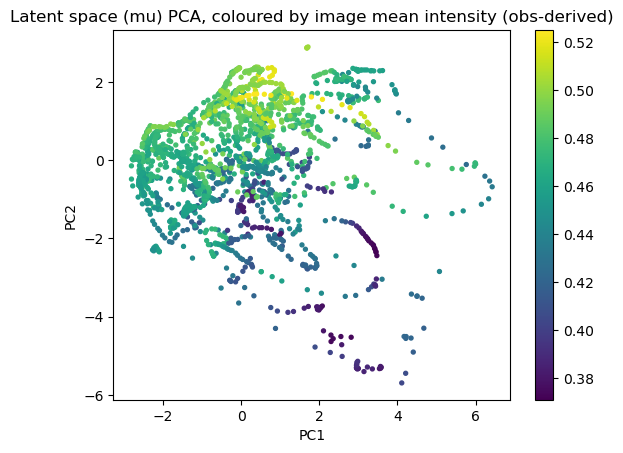

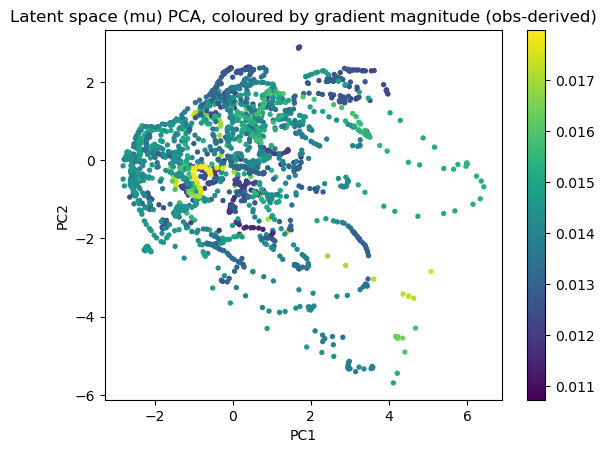

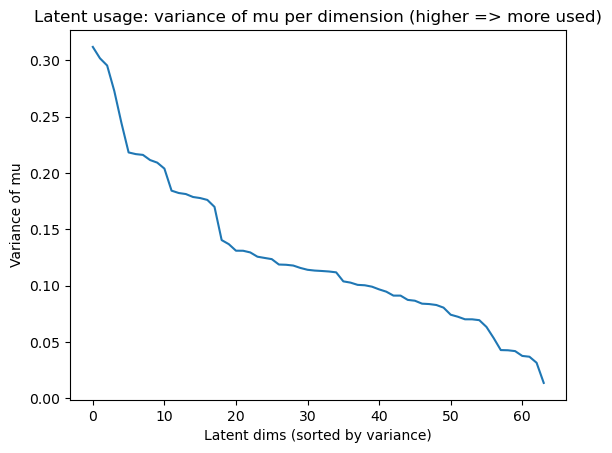

Top-10 latent dims by variance:
  dim 29: var=0.311870
  dim 23: var=0.301752
  dim 56: var=0.295370
  dim 62: var=0.272730
  dim 08: var=0.244272
  dim 54: var=0.218172
  dim 58: var=0.216684
  dim 16: var=0.215991
  dim 39: var=0.211413
  dim 32: var=0.209116


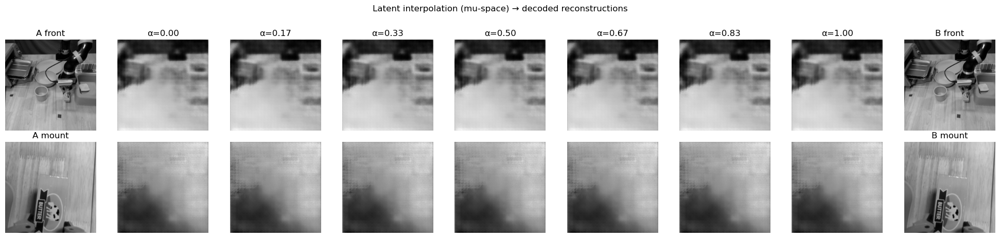

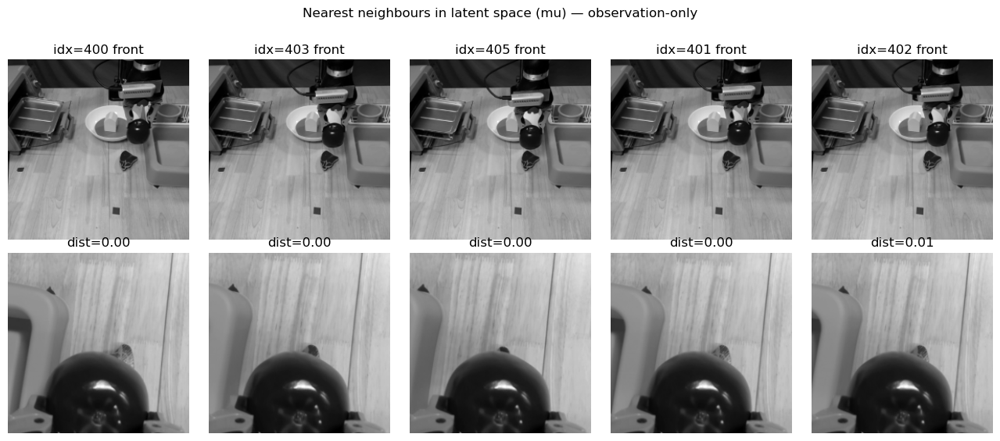


Done: Q2.c latent space evidence generated (PCA visualisation, dim-usage, interpolation, nearest neighbours).


In [35]:
# Run this cell to generate empirical evaluation evidence.

# Implementation section

import numpy as np
import torch
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader

try:
    from sklearn.decomposition import PCA
except Exception:
    PCA = None

# ----------------------------
# 0) Safety checks
# ----------------------------
assert "vae" in globals(), "Missing vae. Please train the VAE first."
assert "train_nps" in globals() and "val_nps" in globals(), "Missing train_nps/val_nps."
assert "global_transforms" in globals(), "Missing global_transforms."

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vae = vae.to(device)
vae.eval()

# ----------------------------
# 1) Dataset: ONLY two camera observations
# ----------------------------
class TwoCamOnlyDataset(Dataset):
    def __init__(self, np_dict, transform_lkp):
        self.front = np_dict["front_cam_ob"]
        self.mount = np_dict["mount_cam_ob"]
        self.tf_front = transform_lkp["front_cam_ob"]
        self.tf_mount = transform_lkp["mount_cam_ob"]
        assert len(self.front) == len(self.mount)

    def __len__(self):
        return len(self.front)

    def __getitem__(self, idx):
        f = self.tf_front(self.front[idx])   # [1,224,224]
        m = self.tf_mount(self.mount[idx])   # [1,224,224]
        x = torch.cat([f, m], dim=0)         # [2,224,224]
        return x

val_ds = TwoCamOnlyDataset(val_nps, global_transforms)
val_loader = DataLoader(val_ds, batch_size=64, shuffle=False, num_workers=0, pin_memory=torch.cuda.is_available())

# ----------------------------
# 2) Preprocess: robust scaling to [0,1] (obs-only)
# ----------------------------
def preprocess_x(x: torch.Tensor) -> torch.Tensor:
    x = x.float()
    if x.max() > 1.5:
        x = x / 255.0
    return x.clamp(0.0, 1.0)

# ----------------------------
# 3) Encode a subset -> latent means (mu), plus simple obs-derived scalars for colouring
#    (NO supervised labels; only statistics from observation images)
# ----------------------------
def collect_latents(vae, loader, max_items=2000):
    mus = []
    img_mean = []
    img_grad = []

    count = 0
    with torch.no_grad():
        for x in loader:
            x = x.to(device, non_blocking=True)
            x01 = preprocess_x(x)

            # encode
            mu, logvar = vae.encode(x01)  # uses only observations

            # simple observation-derived scalars for colouring
            # brightness (mean intensity)
            b = x01.mean(dim=(1,2,3))  # [B]

            # simple "edge/texture" proxy: mean abs finite-diff gradient magnitude
            dx = torch.abs(x01[:, :, 1:, :] - x01[:, :, :-1, :]).mean(dim=(1,2,3))
            dy = torch.abs(x01[:, :, :, 1:] - x01[:, :, :, :-1]).mean(dim=(1,2,3))
            g = (dx + dy) / 2.0

            mus.append(mu.detach().cpu())
            img_mean.append(b.detach().cpu())
            img_grad.append(g.detach().cpu())

            count += x.size(0)
            if count >= max_items:
                break

    mu_all = torch.cat(mus, dim=0)[:max_items].numpy()
    mean_all = torch.cat(img_mean, dim=0)[:max_items].numpy()
    grad_all = torch.cat(img_grad, dim=0)[:max_items].numpy()
    return mu_all, mean_all, grad_all

mu_all, mean_all, grad_all = collect_latents(vae, val_loader, max_items=2000)
print("Collected latents:", mu_all.shape)

# ----------------------------
# 4) Evidence A: 2D latent visualisation (PCA)
# ----------------------------
def pca_2d(X):
    if PCA is not None:
        return PCA(n_components=2, random_state=0).fit_transform(X)
    # fallback: torch PCA
    Xt = torch.tensor(X, dtype=torch.float32)
    Xt = Xt - Xt.mean(0, keepdim=True)
    # lowrank PCA
    U, S, V = torch.pca_lowrank(Xt, q=2)
    Z = (Xt @ V[:, :2]).numpy()
    return Z

Z = pca_2d(mu_all)

plt.figure()
plt.scatter(Z[:, 0], Z[:, 1], s=8, c=mean_all)
plt.xlabel("PC1"); plt.ylabel("PC2")
plt.title("Latent space (mu) PCA, coloured by image mean intensity (obs-derived)")
plt.colorbar()
plt.show()

plt.figure()
plt.scatter(Z[:, 0], Z[:, 1], s=8, c=grad_all)
plt.xlabel("PC1"); plt.ylabel("PC2")
plt.title("Latent space (mu) PCA, coloured by gradient magnitude (obs-derived)")
plt.colorbar()
plt.show()

# ----------------------------
# 5) Evidence B: latent dimension usage (variance of mu per dim)
#    If many dims ~0 variance => latent under-used / collapse risk
# ----------------------------
var_per_dim = np.var(mu_all, axis=0)
sorted_idx = np.argsort(-var_per_dim)

plt.figure()
plt.plot(var_per_dim[sorted_idx])
plt.xlabel("Latent dims (sorted by variance)")
plt.ylabel("Variance of mu")
plt.title("Latent usage: variance of mu per dimension (higher => more used)")
plt.show()

print("Top-10 latent dims by variance:")
for i in range(min(10, len(sorted_idx))):
    d = sorted_idx[i]
    print(f"  dim {d:02d}: var={var_per_dim[d]:.6f}")

# ----------------------------
# 6) Evidence C: latent interpolation (smoothness)
#    Pick two observations, interpolate between their mus, decode and visualise.
# ----------------------------
def get_two_samples(loader):
    x = next(iter(loader))
    if x.size(0) < 2:
        # get next batch if too small
        x = torch.cat([x, next(iter(loader))], dim=0)
    return x[0:1], x[1:2]

def show_interpolation(vae, xA, xB, steps=7):
    vae.eval()
    with torch.no_grad():
        xA = preprocess_x(xA.to(device))
        xB = preprocess_x(xB.to(device))

        muA, logvarA = vae.encode(xA)
        muB, logvarB = vae.encode(xB)

        alphas = torch.linspace(0, 1, steps, device=device).view(-1, 1)
        z = (1 - alphas) * muA + alphas * muB  # [steps, D]
        recon_raw = vae.decode(z)
        recon = torch.sigmoid(recon_raw).clamp(0, 1).cpu().numpy()

        xA_np = xA.cpu().numpy()[0]
        xB_np = xB.cpu().numpy()[0]

    # plot: first row = originals; second row = interpolations (front+mount)
    plt.figure(figsize=(2.2 * (steps + 2), 4.5))

    # originals
    ax = plt.subplot(2, steps + 2, 1)
    ax.imshow(xA_np[0], cmap="gray"); ax.set_title("A front"); ax.axis("off")
    ax = plt.subplot(2, steps + 2, 1 + (steps + 2))
    ax.imshow(xA_np[1], cmap="gray"); ax.set_title("A mount"); ax.axis("off")

    ax = plt.subplot(2, steps + 2, steps + 2)
    ax.imshow(xB_np[0], cmap="gray"); ax.set_title("B front"); ax.axis("off")
    ax = plt.subplot(2, steps + 2, (steps + 2) + (steps + 2))
    ax.imshow(xB_np[1], cmap="gray"); ax.set_title("B mount"); ax.axis("off")

    # interpolations
    for i in range(steps):
        ax = plt.subplot(2, steps + 2, i + 2)
        ax.imshow(recon[i, 0], cmap="gray"); ax.set_title(f"α={i/(steps-1):.2f}"); ax.axis("off")

        ax = plt.subplot(2, steps + 2, (steps + 2) + (i + 2))
        ax.imshow(recon[i, 1], cmap="gray"); ax.axis("off")

    plt.suptitle("Latent interpolation (mu-space) → decoded reconstructions", y=1.02)
    plt.tight_layout()
    plt.show()

xA, xB = get_two_samples(val_loader)
show_interpolation(vae, xA, xB, steps=7)

# ----------------------------
# 7) Evidence D: nearest neighbours in latent space
#    Pick a query, find closest samples by L2 distance in mu (obs-only),
#    then show whether nearest neighbours look visually similar.
# ----------------------------
def show_nearest_neighbours(vae, loader, pool_max=1500, k=5):
    mu_pool, mean_pool, grad_pool = collect_latents(vae, loader, max_items=pool_max)

    # choose query index (middle for determinism)
    q_idx = pool_max // 2
    q = mu_pool[q_idx:q_idx+1]  # [1, D]
    dists = np.sum((mu_pool - q) ** 2, axis=1)
    nn_idx = np.argsort(dists)[:k]

    # fetch actual images for these indices
    # We rebuild a small index->image map by iterating once (obs-only).
    imgs = []
    with torch.no_grad():
        count = 0
        for x in loader:
            for i in range(x.size(0)):
                if count in nn_idx:
                    imgs.append((count, preprocess_x(x[i:i+1]).cpu().numpy()[0]))
                count += 1
                if count >= pool_max:
                    break
            if count >= pool_max:
                break

    # sort imgs by nearest order
    idx_to_img = {idx: img for idx, img in imgs}
    ordered = [idx_to_img[i] for i in nn_idx if i in idx_to_img]

    plt.figure(figsize=(2.6*k, 5.5))
    for j, img in enumerate(ordered):
        ax = plt.subplot(2, k, j+1)
        ax.imshow(img[0], cmap="gray"); ax.set_title(f"idx={nn_idx[j]} front"); ax.axis("off")
        ax = plt.subplot(2, k, k + j+1)
        ax.imshow(img[1], cmap="gray"); ax.set_title(f"dist={dists[nn_idx[j]]:.2f}"); ax.axis("off")

    plt.suptitle("Nearest neighbours in latent space (mu) — observation-only", y=1.02)
    plt.tight_layout()
    plt.show()

show_nearest_neighbours(vae, val_loader, pool_max=800, k=5)

print("\nDone: Q2.c latent space evidence generated (PCA visualisation, dim-usage, interpolation, nearest neighbours).")
# ******* Implementation HERE - END *******

In [33]:
print(test_batch.input['obs'].shape)

torch.Size([64, 15])


In [19]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import time

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Ensure ConvVAE exists (defined in VAE training). If not, re-define a minimal compatible version.
if 'ConvVAE' not in globals():
    class ConvVAE(nn.Module):
        def __init__(self, in_ch=2, latent_dim=64, base_ch=32):
            super().__init__()
            # 224 -> 112 -> 56 -> 28 -> 14 -> 7
            self.enc = nn.Sequential(
                nn.Conv2d(in_ch, base_ch, 4, 2, 1), nn.ReLU(True),
                nn.Conv2d(base_ch, base_ch*2, 4, 2, 1), nn.ReLU(True),
                nn.Conv2d(base_ch*2, base_ch*4, 4, 2, 1), nn.ReLU(True),
                nn.Conv2d(base_ch*4, base_ch*8, 4, 2, 1), nn.ReLU(True),
                nn.Conv2d(base_ch*8, base_ch*16, 4, 2, 1), nn.ReLU(True), # 关键：这里是 16
            )
            self.enc_out_ch = base_ch * 16 # 512
            self.enc_out_hw = 7
            enc_flat = self.enc_out_ch * self.enc_out_hw * self.enc_out_hw # 25088

            self.fc = nn.Sequential(
                nn.Linear(enc_flat, 512),
                nn.ReLU(True),
            )
            self.fc_mu = nn.Linear(512, latent_dim)
            self.fc_logvar = nn.Linear(512, latent_dim)

# Note
# Note
            self.fc_dec = nn.Sequential(nn.Linear(latent_dim, 512), nn.ReLU(True), nn.Linear(512, enc_flat), nn.ReLU(True))
            self.dec = nn.Sequential(
                nn.ConvTranspose2d(self.enc_out_ch, base_ch*8, 4, 2, 1), nn.ReLU(True),
                nn.ConvTranspose2d(base_ch*8, base_ch*4, 4, 2, 1), nn.ReLU(True),
                nn.ConvTranspose2d(base_ch*4, base_ch*2, 4, 2, 1), nn.ReLU(True),
                nn.ConvTranspose2d(base_ch*2, base_ch, 4, 2, 1), nn.ReLU(True),
                nn.ConvTranspose2d(base_ch, in_ch, 4, 2, 1)
            )

        def encode(self, x):
            h = self.enc(x).flatten(1)
            h = self.fc(h)
            return self.fc_mu(h), self.fc_logvar(h)

        def forward(self, x): # only encode
            return self.encode(x)

# Instantiate and load
VAE_CKPT = "models/best_vae.pth"
LATENT_DIM = 64  # keep consistent with Q2 settings
vae = ConvVAE(in_ch=2, latent_dim=LATENT_DIM, base_ch=32).to(device)
ckpt = torch.load(VAE_CKPT, map_location=device)
state = ckpt['model_state_dict'] if isinstance(ckpt, dict) and 'model_state_dict' in ckpt else ckpt
vae.load_state_dict(state, strict=False)
vae.eval()


# Freeze VAE parameters
for p in vae.parameters():
    p.requires_grad = False

# Define downstream policy with frozen VAE encoder + trainable heads
class VAEBCPolicy(nn.Module):
    def __init__(self, frozen_vae: nn.Module, obs_dim: int, latent_dim: int = 64, hidden: int = 256):
        super().__init__()
        self.frozen_vae = frozen_vae

        # Proprio / low-dim state encoder
        self.obs_net = nn.Sequential(
            nn.Linear(obs_dim, hidden), nn.ReLU(),
            nn.Linear(hidden, hidden), nn.ReLU(),
        )

        # Fusion trunk
        self.fusion = nn.Sequential(
            nn.Linear(latent_dim + hidden, hidden), nn.ReLU(),
            nn.Linear(hidden, hidden), nn.ReLU(),
        )

        # Heads
        self.pos_head = nn.Linear(hidden, 3)   # delta xyz
        self.grp_head = nn.Linear(hidden, 3)   # open/stay/close

    def forward(self, images, obs):
        # images: [B,2,224,224] (front+mount stacked)
        with torch.no_grad():
            mu, _ = self.frozen_vae.encode(images)
            z = mu  # deterministic latent works best for BC

        o = self.obs_net(obs)
        h = self.fusion(torch.cat([z, o], dim=-1))

        pos = self.pos_head(h)
        grp = self.grp_head(h)
        return {'pos': pos, 'grp': grp}


# Infer obs_dim from a batch
assert 'train_dataloader' in globals(), 'train_dataloader not found. Please run the dataloader setup cell(s) above.'
assert 'val_dataloader' in globals(), 'val_dataloader not found. Please run the dataloader setup cell(s) above.'

sample_batch = next(iter(train_dataloader))
obs_dim = sample_batch.input['obs'].shape[-1]

policy_model = VAEBCPolicy(frozen_vae=vae, obs_dim=obs_dim, latent_dim=LATENT_DIM, hidden=256).to(device)

# Optimise ONLY trainable head parameters
trainable_params = [p for p in policy_model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(trainable_params, lr=1e-3, weight_decay=1e-5)

use_amp = (device == 'cuda') and (('exp_kwargs' in globals() and exp_kwargs.get('half_precision', False)) or False)
scaler = torch.cuda.amp.GradScaler(enabled=use_amp)


num_epochs = 10
best_val_loss = float('inf')
save_path = "./models/q3a_best_policy.pt"
lambda_grp = 0.5  # 建议加权

for epoch in range(num_epochs):
    start_time = time.time()

    # ---- Train ----
    policy_model.train()
    train_total_loss = 0.0

    for batch in train_dataloader:
        imgs = batch.input['images'].to(device)
        obs  = batch.input['obs'].to(device)
        target_pos = batch.output['pos'].to(device)

        grp_raw = batch.output['grp'].to(device)
# Note
        if grp_raw.ndim == 2 and grp_raw.shape[-1] == 3:
            target_grp = torch.argmax(grp_raw, dim=1).long()
        else:
            target_grp = grp_raw.long()

        optimizer.zero_grad(set_to_none=True)

        outputs = policy_model(imgs, obs)
        loss_pos = pos_criterion(outputs['pos'], target_pos)
        loss_grp = grp_criterion(outputs['grp'], target_grp)

        total_loss = loss_pos + lambda_grp * loss_grp
        total_loss.backward()

# Note
        torch.nn.utils.clip_grad_norm_(trainable_params, 1.0)

        optimizer.step()
        train_total_loss += total_loss.item()

    avg_train_loss = train_total_loss / len(train_dataloader)

    # ---- Val ----
    policy_model.eval()
    val_total_loss = 0.0
    with torch.no_grad():
        for batch in val_dataloader:
            imgs = batch.input['images'].to(device)
            obs  = batch.input['obs'].to(device)
            target_pos = batch.output['pos'].to(device)

            grp_raw = batch.output['grp'].to(device)
            if grp_raw.ndim == 2 and grp_raw.shape[-1] == 3:
                target_grp = torch.argmax(grp_raw, dim=1).long()
            else:
                target_grp = grp_raw.long()

            outputs = policy_model(imgs, obs)
            loss_pos = pos_criterion(outputs['pos'], target_pos)
            loss_grp = grp_criterion(outputs['grp'], target_grp)

            val_total_loss += (loss_pos + lambda_grp * loss_grp).item()

    avg_val_loss = val_total_loss / len(val_dataloader)

    # ---- Save best ----
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': policy_model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': best_val_loss,
        }, save_path)

    elapsed = time.time() - start_time
    print(f"Epoch {epoch+1}/{num_epochs} | train={avg_train_loss:.4f} | val={avg_val_loss:.4f} | best_val={best_val_loss:.4f} | {elapsed:.1f}s")

print(f"Saved best policy to: {save_path}")

Epoch 1/10 | train=0.2421 | val=0.1682 | best_val=0.1682 | 12.3s
Epoch 2/10 | train=0.1627 | val=0.1569 | best_val=0.1569 | 12.2s
Epoch 3/10 | train=0.1479 | val=0.1498 | best_val=0.1498 | 12.4s
Epoch 4/10 | train=0.1362 | val=0.1601 | best_val=0.1498 | 12.1s
Epoch 5/10 | train=0.1261 | val=0.1635 | best_val=0.1498 | 12.0s
Epoch 6/10 | train=0.1191 | val=0.1586 | best_val=0.1498 | 12.1s
Epoch 7/10 | train=0.1124 | val=0.1615 | best_val=0.1498 | 12.0s
Epoch 8/10 | train=0.1060 | val=0.1887 | best_val=0.1498 | 12.2s
Epoch 9/10 | train=0.0997 | val=0.1652 | best_val=0.1498 | 12.0s
Epoch 10/10 | train=0.0939 | val=0.1704 | best_val=0.1498 | 12.0s
Saved best policy to: ./models/q3a_best_policy.pt


In [32]:
_keys = [
    "actions","front_cam_ob",
    "mount_cam_ob","terminals",
    "ee_cartesian_pos_ob",
    "ee_cartesian_vel_ob",
    "joint_pos_ob"

    ]

test_nps = load_all_files(test_dh.loc,"test_[0-4]+.h5",keys=_keys)
# ==========================================================
# Note
# ==========================================================
class EvaluationDataset(torch.utils.data.Dataset):
    def __init__(self, np_dict, transform_lkp):
        self.np_dict = np_dict
        self.tf_front = transform_lkp["front_cam_ob"]
        self.tf_mount = transform_lkp["mount_cam_ob"]

    def __len__(self):
        return len(self.np_dict["front_cam_ob"])

    def __getitem__(self, idx):
# Note
        f = self.tf_front(self.np_dict["front_cam_ob"][idx])
        m = self.tf_mount(self.np_dict["mount_cam_ob"][idx])
        img = torch.cat([f, m], dim=0) # [2, 224, 224]

# Note
# Note
        obs = np.concatenate([
            self.np_dict["ee_cartesian_pos_ob"][idx],
            self.np_dict["ee_cartesian_vel_ob"][idx],
            self.np_dict["joint_pos_ob"][idx]
        ], axis=-1)

# Note
# Note
        action = self.np_dict["actions"][idx]
        pos_target = action[:3]
        grp_target = action[3:] # 或者是你定义的分类格式

# Note
        return {
            "input": {
                "images": img.float(),
                "obs": torch.from_numpy(obs).float()
            },
            "output": {
                "pos": torch.from_numpy(pos_target).float(),
                "grp": torch.from_numpy(grp_target).float()
            }
        }

# ==========================================================
# Note
# ==========================================================
test_ds = EvaluationDataset(test_nps, global_transforms)
test_dataloader = DataLoader(test_ds, batch_size=64, shuffle=False, num_workers=0)

print(f"✅ test sample: {len(test_ds)} ")


# jia zai vae xu yao de han shu
sample_batch = next(iter(test_dataloader))
obs_dim = sample_batch['input']['obs'].shape[-1]
LATENT_DIM = 64
# Ensure ConvVAE exists (defined in VAE training). If not, re-define a minimal compatible version.
if 'ConvVAE' not in globals():
    class ConvVAE(nn.Module):
        def __init__(self, in_ch=2, latent_dim=64, base_ch=32):
            super().__init__()
            # 224 -> 112 -> 56 -> 28 -> 14 -> 7
            self.enc = nn.Sequential(
                nn.Conv2d(in_ch, base_ch, 4, 2, 1), nn.ReLU(True),
                nn.Conv2d(base_ch, base_ch*2, 4, 2, 1), nn.ReLU(True),
                nn.Conv2d(base_ch*2, base_ch*4, 4, 2, 1), nn.ReLU(True),
                nn.Conv2d(base_ch*4, base_ch*8, 4, 2, 1), nn.ReLU(True),
                nn.Conv2d(base_ch*8, base_ch*16, 4, 2, 1), nn.ReLU(True), # 关键：这里是 16
            )
            self.enc_out_ch = base_ch * 16 # 512
            self.enc_out_hw = 7
            enc_flat = self.enc_out_ch * self.enc_out_hw * self.enc_out_hw # 25088

            self.fc = nn.Sequential(
                nn.Linear(enc_flat, 512),
                nn.ReLU(True),
            )
            self.fc_mu = nn.Linear(512, latent_dim)
            self.fc_logvar = nn.Linear(512, latent_dim)

# Note
# Note
            self.fc_dec = nn.Sequential(nn.Linear(latent_dim, 512), nn.ReLU(True), nn.Linear(512, enc_flat), nn.ReLU(True))
            self.dec = nn.Sequential(
                nn.ConvTranspose2d(self.enc_out_ch, base_ch*8, 4, 2, 1), nn.ReLU(True),
                nn.ConvTranspose2d(base_ch*8, base_ch*4, 4, 2, 1), nn.ReLU(True),
                nn.ConvTranspose2d(base_ch*4, base_ch*2, 4, 2, 1), nn.ReLU(True),
                nn.ConvTranspose2d(base_ch*2, base_ch, 4, 2, 1), nn.ReLU(True),
                nn.ConvTranspose2d(base_ch, in_ch, 4, 2, 1)
            )

        def encode(self, x):
            h = self.enc(x).flatten(1)
            h = self.fc(h)
            return self.fc_mu(h), self.fc_logvar(h)

        def forward(self, x): # only encode
            return self.encode(x)

# Define downstream policy with frozen VAE encoder + trainable heads
class VAEBCPolicy(nn.Module):
    def __init__(self, frozen_vae: nn.Module, obs_dim: int, latent_dim: int = 64, hidden: int = 256):
        super().__init__()
        self.frozen_vae = frozen_vae

        # Proprio / low-dim state encoder
        self.obs_net = nn.Sequential(
            nn.Linear(obs_dim, hidden), nn.ReLU(),
            nn.Linear(hidden, hidden), nn.ReLU(),
        )

        # Fusion trunk
        self.fusion = nn.Sequential(
            nn.Linear(latent_dim + hidden, hidden), nn.ReLU(),
            nn.Linear(hidden, hidden), nn.ReLU(),
        )

        # Heads
        self.pos_head = nn.Linear(hidden, 3)   # delta xyz
        self.grp_head = nn.Linear(hidden, 3)   # open/stay/close

    def forward(self, images, obs):
        # images: [B,2,224,224] (front+mount stacked)
        with torch.no_grad():
            mu, _ = self.frozen_vae.encode(images)
            z = mu  # deterministic latent works best for BC

        o = self.obs_net(obs)
        h = self.fusion(torch.cat([z, o], dim=-1))

        pos = self.pos_head(h)
        grp = self.grp_head(h)
        return {'pos': pos, 'grp': grp}

vae = ConvVAE(in_ch=2, latent_dim=LATENT_DIM, base_ch=32).to(device)

# jia zai 1c de han shu
def get_q1c_model(obs_dim=15):
# Note
    cnn_config = ConvolutionLayersConfig(
        input_dim=224,
        input_channels=2,
        layers=[
            nn.Conv2d(2, 16, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.Conv2d(16, 16, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),
            nn.Conv2d(16, 32, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),
            nn.Conv2d(32, 64, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),
            nn.Conv2d(64, 128, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),
            nn.Conv2d(128, 256, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=(3,3), stride=(1,1), padding=(1,1)), nn.ReLU(),
            nn.MaxPool2d(kernel_size=(2,2), stride=(2,2)),
        ]
    )

# Note
    image_encoder = JointCNNEncoder(
        cnn=CNN(cnn_config),
        dense=MLP(input_dim=12544, hidden_dims=[512, 256], output_dim=128)
    )

    obs_encoder = MLP(input_dim=obs_dim, hidden_dims=[256, 256], output_dim=128)
    dense_net = MLP(input_dim=128, hidden_dims=[256, 128], output_dim=6)

    return Baseline1(image_encoder=image_encoder, obs_encoder=obs_encoder, dense=dense_net)

100%|██████████| 5/5 [00:00<00:00, 16.41it/s]


✅ test sample: 7352 


In [41]:
# Run this cell to generate empirical evaluation evidence.

# Implementation section
import torch
import pandas as pd
import numpy as np

# 1) Path setup
PATH_Q3A = "./models/q3a_best_policy.pt"
PATH_Q1C = "./models/final.pt"

# 2) Model loading
# ---------------------------------------------------------
def load_all_models():
# Note
    sample_batch = next(iter(test_dataloader))
# Note
    obs_dim = sample_batch['input']['obs'].shape[-1]

# Note
    model_q3a = VAEBCPolicy(frozen_vae=vae, obs_dim=obs_dim, latent_dim=64).to(device)
    ckpt_3a = torch.load("./models/q3a_best_policy.pt", map_location=device, weights_only=False)
    model_q3a.load_state_dict(ckpt_3a['model_state_dict'])
    model_q3a.eval()

# Note
    model_q1c = get_q1c_model(obs_dim=obs_dim).to(device)
    ckpt_1c = torch.load("./models/final.pt", map_location=device, weights_only=False)
# Note
    state_dict_1c = ckpt_1c['model_state_dict'] if 'model_state_dict' in ckpt_1c else ckpt_1c
    model_q1c.load_state_dict(state_dict_1c)
    model_q1c.eval()

    return model_q3a, model_q1c

# ---------------------------------------------------------
# Note
# ---------------------------------------------------------
def run_evaluation(model, dataloader, model_name="Model"):
    print(f"Running evaluation for {model_name}...")

    all_pos_preds, all_pos_gt = [], []
    all_grp_preds, all_grp_gt = [], []

    with torch.no_grad():
        for batch in dataloader:
            imgs = batch['input']['images'].to(device)
            obs = batch['input']['obs'].to(device)

# Note
            outputs = model(imgs, obs)

# Note
            all_pos_preds.append(outputs['pos'].cpu())
            all_pos_gt.append(batch['output']['pos'].cpu())

# Note
            grp_logits = outputs['grp'].cpu()
            grp_gt = batch['output']['grp'].cpu()
            if grp_gt.ndim == 2: grp_gt = torch.argmax(grp_gt, dim=1)

            all_grp_preds.append(torch.argmax(grp_logits, dim=1))
            all_grp_gt.append(grp_gt)

# Note
    pos_preds = torch.cat(all_pos_preds).numpy()
    pos_gt = torch.cat(all_pos_gt).numpy()
    grp_preds = torch.cat(all_grp_preds).numpy()
    grp_gt = torch.cat(all_grp_gt).numpy()

# Note
    from sklearn.metrics import f1_score, accuracy_score
    mae = np.mean(np.abs(pos_preds - pos_gt))
    acc = accuracy_score(grp_gt, grp_preds)
    f1 = f1_score(grp_gt, grp_preds, average='macro')

    return {"MAE": mae, "Accuracy": acc, "F1-Macro": f1}

# ---------------------------------------------------------
# Note
# ---------------------------------------------------------
# Note
model_q3a, model_q1c = load_all_models()
results_q3a = run_evaluation(model_q3a, test_dataloader, "VAE+Head (3.a)")
results_q1c = run_evaluation(model_q1c, test_dataloader, "End-to-End (1.c)")

# Note
comparison_df = pd.DataFrame([results_q1c, results_q3a],
                             index=["End-to-End (Q1.c)", "Self-Supervised (VAE+Head model)"])

print("\n" + "="*40)
print("       COMPARISON ON TEST SET")
print("="*40)
display(comparison_df.round(4))
# ******* Implementation HERE - END *******

Running evaluation for VAE+Head (3.a)...
Running evaluation for End-to-End (1.c)...

       COMPARISON ON TEST SET


,MAE,Accuracy,F1-Macro
End-to-End (Q1.c),0.0297,0.0496,0.0315
Self-Supervised (Q3.a),0.0288,0.0868,0.0532


In [52]:
# =========================
# Q3bii FINAL: load Q1c via get_q1c_model() + load Q3a + evaluate + save evidence
# =========================
import os
import numpy as np
import torch
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Q3A_CKPT = "./models/q3a_best_policy.pt"
Q1C_CKPT = "./models/final.pt"
VAE_CKPT = "./models/best_vae.pth"

OUT_DIR = "./results/q3bii"
os.makedirs(OUT_DIR, exist_ok=True)

# -------------------------
# Sanity: ensure test_dataloader exists and infer obs_dim / image channels
# -------------------------
assert "test_dataloader" in globals(), "test_dataloader not found. Please create/run the test dataloader cell first."
b = next(iter(test_dataloader))
obs_dim = b["input"]["obs"].shape[-1]
img_ch = b["input"]["images"].shape[1]
print("obs_dim:", obs_dim, "| img channels:", img_ch)

# -------------------------
# (1) Build & load Q1c end-to-end model using your provided function
# -------------------------
assert "get_q1c_model" in globals(), "get_q1c_model() not found. Please run the cell that defines it first."
q1c_model = get_q1c_model(obs_dim=obs_dim).to(DEVICE)

ckpt_q1c = torch.load(Q1C_CKPT, map_location=DEVICE, weights_only=False)
state_q1c = ckpt_q1c["model_state_dict"] if isinstance(ckpt_q1c, dict) and "model_state_dict" in ckpt_q1c else ckpt_q1c
q1c_model.load_state_dict(state_q1c, strict=True)
q1c_model.eval()

# -------------------------
# (2) Build & load Q3a model (ConvVAE + VAEBCPolicy) consistent with your Q3a design
# -------------------------
class ConvVAE(torch.nn.Module):
    def __init__(self, in_ch=2, latent_dim=64, base_ch=32):
        super().__init__()
        self.enc = torch.nn.Sequential(
            torch.nn.Conv2d(in_ch, base_ch, 4, 2, 1), torch.nn.ReLU(True),
            torch.nn.Conv2d(base_ch, base_ch*2, 4, 2, 1), torch.nn.ReLU(True),
            torch.nn.Conv2d(base_ch*2, base_ch*4, 4, 2, 1), torch.nn.ReLU(True),
            torch.nn.Conv2d(base_ch*4, base_ch*8, 4, 2, 1), torch.nn.ReLU(True),
            torch.nn.Conv2d(base_ch*8, base_ch*16, 4, 2, 1), torch.nn.ReLU(True),
        )
        self.enc_out_ch = base_ch * 16
        self.enc_out_hw = 7
        enc_flat = self.enc_out_ch * self.enc_out_hw * self.enc_out_hw
        self.fc = torch.nn.Sequential(torch.nn.Linear(enc_flat, 512), torch.nn.ReLU(True))
        self.fc_mu = torch.nn.Linear(512, latent_dim)
        self.fc_logvar = torch.nn.Linear(512, latent_dim)

        # keep decoder modules for compatibility
        self.fc_dec = torch.nn.Sequential(torch.nn.Linear(latent_dim, 512), torch.nn.ReLU(True),
                                          torch.nn.Linear(512, enc_flat), torch.nn.ReLU(True))
        self.dec = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(self.enc_out_ch, base_ch*8, 4, 2, 1), torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(base_ch*8, base_ch*4, 4, 2, 1), torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(base_ch*4, base_ch*2, 4, 2, 1), torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(base_ch*2, base_ch, 4, 2, 1), torch.nn.ReLU(True),
            torch.nn.ConvTranspose2d(base_ch, in_ch, 4, 2, 1)
        )

    def encode(self, x):
        h = self.enc(x).flatten(1)
        h = self.fc(h)
        return self.fc_mu(h), self.fc_logvar(h)

    def forward(self, x):
        return self.encode(x)

class VAEBCPolicy(torch.nn.Module):
    def __init__(self, frozen_vae: torch.nn.Module, obs_dim: int, latent_dim: int = 64, hidden: int = 256):
        super().__init__()
        self.frozen_vae = frozen_vae

        self.obs_net = torch.nn.Sequential(
            torch.nn.Linear(obs_dim, hidden), torch.nn.ReLU(),
            torch.nn.Linear(hidden, hidden), torch.nn.ReLU(),
        )
        self.fusion = torch.nn.Sequential(
            torch.nn.Linear(latent_dim + hidden, hidden), torch.nn.ReLU(),
            torch.nn.Linear(hidden, hidden), torch.nn.ReLU(),
        )
        self.pos_head = torch.nn.Linear(hidden, 3)
        self.grp_head = torch.nn.Linear(hidden, 3)

    def forward(self, images, obs):
        with torch.no_grad():
            mu, _ = self.frozen_vae.encode(images)
            z = mu
        o = self.obs_net(obs)
        h = self.fusion(torch.cat([z, o], dim=-1))
        return {"pos": self.pos_head(h), "grp": self.grp_head(h)}

LATENT_DIM = 64
vae = ConvVAE(in_ch=img_ch, latent_dim=LATENT_DIM, base_ch=32).to(DEVICE)

# load VAE weights (needed to compute latents)
if os.path.exists(VAE_CKPT):
    ckpt_vae = torch.load(VAE_CKPT, map_location=DEVICE, weights_only=False)
    state_vae = ckpt_vae["model_state_dict"] if isinstance(ckpt_vae, dict) and "model_state_dict" in ckpt_vae else ckpt_vae
    vae.load_state_dict(state_vae, strict=False)

vae.eval()
for p in vae.parameters():
    p.requires_grad = False

q3a_model = VAEBCPolicy(frozen_vae=vae, obs_dim=obs_dim, latent_dim=LATENT_DIM, hidden=256).to(DEVICE)

ckpt_q3a = torch.load(Q3A_CKPT, map_location=DEVICE, weights_only=False)
state_q3a = ckpt_q3a["model_state_dict"] if isinstance(ckpt_q3a, dict) and "model_state_dict" in ckpt_q3a else ckpt_q3a
q3a_model.load_state_dict(state_q3a, strict=False)
q3a_model.eval()

# -------------------------
# (3) Evaluation
# -------------------------
def extract_grip_target(grp_tensor: torch.Tensor) -> torch.Tensor:
    # one-hot [B,3] -> ids [B]
    if grp_tensor.ndim == 2 and grp_tensor.shape[-1] == 3:
        return torch.argmax(grp_tensor, dim=1).long()
    return grp_tensor.long()

def cosine_similarity_batch(a: np.ndarray, b: np.ndarray, eps: float = 1e-8) -> float:
    a_norm = np.linalg.norm(a, axis=1) + eps
    b_norm = np.linalg.norm(b, axis=1) + eps
    return float(np.mean(np.sum(a*b, axis=1) / (a_norm * b_norm)))

@torch.no_grad()
def evaluate(model_like, loader):
    pos_pred_all, pos_true_all = [], []
    grp_pred_all, grp_true_all = [], []

    for batch in loader:
        imgs = batch["input"]["images"].to(DEVICE)
        obs  = batch["input"]["obs"].to(DEVICE)
        pos_true = batch["output"]["pos"].to(DEVICE)
        grp_true = extract_grip_target(batch["output"]["grp"].to(DEVICE))

        out = model_like(imgs, obs)
        pos_pred = out["pos"]
        grp_logits = out["grp"]
        grp_pred = torch.argmax(grp_logits, dim=1).long()

        pos_pred_all.append(pos_pred.cpu().numpy())
        pos_true_all.append(pos_true.cpu().numpy())
        grp_pred_all.append(grp_pred.cpu().numpy())
        grp_true_all.append(grp_true.cpu().numpy())

    pos_pred = np.concatenate(pos_pred_all, 0)
    pos_true = np.concatenate(pos_true_all, 0)
    grp_pred = np.concatenate(grp_pred_all, 0)
    grp_true = np.concatenate(grp_true_all, 0)

    mae  = float(np.mean(np.abs(pos_pred - pos_true)))
    rmse = float(np.sqrt(np.mean((pos_pred - pos_true)**2)))
    cossim = cosine_similarity_batch(pos_pred, pos_true)

    acc = float(accuracy_score(grp_true, grp_pred))
    f1m = float(f1_score(grp_true, grp_pred, average="macro"))

    rep = classification_report(grp_true, grp_pred, output_dict=True, zero_division=0)
    cm  = confusion_matrix(grp_true, grp_pred, labels=[0,1,2])

    metrics = {"MAE_pos": mae, "RMSE_pos": rmse, "CosSim_pos": cossim, "Acc_grp": acc, "MacroF1_grp": f1m}
    return metrics, rep, cm

def save_cm(cm, title, path):
    plt.figure()
    plt.imshow(cm)
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.xticks([0,1,2], ["open","stay","close"])
    plt.yticks([0,1,2], ["open","stay","close"])
    for i in range(3):
        for j in range(3):
            plt.text(j, i, str(cm[i,j]), ha="center", va="center")
    plt.tight_layout()
    plt.savefig(path, dpi=200)
    plt.close()

m_q1c, rep_q1c, cm_q1c = evaluate(q1c_model, test_dataloader)
m_q3a, rep_q3a, cm_q3a = evaluate(q3a_model, test_dataloader)

df = pd.DataFrame([m_q1c, m_q3a], index=["End-to-End (Q1c)", "Self-Supervised (Q3a)"])
print(df)

# -------------------------
# (4) Save evidence
# -------------------------
df.to_csv(os.path.join(OUT_DIR, "q3bii_summary.csv"))
pd.DataFrame(rep_q1c).T.to_csv(os.path.join(OUT_DIR, "q1c_classification_report.csv"))
pd.DataFrame(rep_q3a).T.to_csv(os.path.join(OUT_DIR, "q3a_classification_report.csv"))

save_cm(cm_q1c, "Gripper CM - Q1c", os.path.join(OUT_DIR, "cm_q1c.png"))
save_cm(cm_q3a, "Gripper CM - Q3a", os.path.join(OUT_DIR, "cm_q3a.png"))

print(f"Saved Q3bii evidence to: {OUT_DIR}")

obs_dim: 15 | img channels: 2
                        MAE_pos  RMSE_pos  CosSim_pos   Acc_grp  MacroF1_grp
End-to-End (Q1c)       0.029655  0.042723    0.733850  0.720348     0.438977
Self-Supervised (Q3a)  0.028821  0.042506    0.735478  0.872960     0.703721
Saved Q3bii evidence to: ./results/q3bii


In [42]:
# Implementation section
def check_robustness(model, test_dataloader, noise_level=0.01):
    model.eval()
    batch = next(iter(test_dataloader))
    imgs = batch['input']['images'].to(device)
    obs = batch['input']['obs'].to(device)

    # 1) Baseline prediction
    with torch.no_grad():
        orig_out = model(imgs, obs)['pos']

    # 2) Prediction with small Gaussian noise
    noisy_imgs = imgs + torch.randn_like(imgs) * noise_level
    with torch.no_grad():
        noisy_out = model(noisy_imgs, obs)['pos']

# Note
    deviation = torch.mean(torch.abs(orig_out - noisy_out)).item()
    return deviation

# Note
dev_q3a = check_robustness(model_q3a, test_dataloader)
dev_q1c = check_robustness(model_q1c, test_dataloader)
print(f"SSL Robustness Deviation: {dev_q3a:.6f}")
print(f"E2E Robustness Deviation: {dev_q1c:.6f}")

# ******* Implementation HERE - END *******

SSL Robustness Deviation: 0.000024
E2E Robustness Deviation: 0.000394


In [43]:
def plot_action_distribution(model, dataloader):
    all_preds = []
    model.eval()
    with torch.no_grad():
        for batch in dataloader:
            out = model(batch['input']['images'].to(device), batch['input']['obs'].to(device))
            all_preds.append(torch.argmax(out['grp'], dim=1).cpu())

    preds = torch.cat(all_preds).numpy()
    unique, counts = np.unique(preds, return_counts=True)
    return dict(zip(unique, counts))

print("SSL Distribution:", plot_action_distribution(model_q3a, test_dataloader))
print("E2E Distribution:", plot_action_distribution(model_q1c, test_dataloader))

SSL Distribution: {0: 638, 1: 5706, 2: 1008}
E2E Distribution: {0: 365, 1: 6232, 2: 755}
